In [400]:
# Load Initial Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import datetime as dt

import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=FutureWarning)

In [412]:
!pip install pygam

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.2/522.2 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 49.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.25.0 which is incompatible.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.25.0 which is incompatible.


In [ ]:
# Load Initial Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import datetime as dt

import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=FutureWarning)

In [257]:
# Import Google Drive
from google.colab import drive
drive.mount('/content/drive') # Connect google drive in order to load data

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [258]:
# Load Data
govhack_1 = pd.read_csv('/content/drive/MyDrive/govhack3.csv')

In [259]:
govhack_1.head(5) # returns first 5 rows of dataset

,Unnamed: 0,Royal Perth Hospital,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Fremantle Hospital,Unnamed: 9,...,Unnamed: 54,Unnamed: 55,Unnamed: 56,Joondalup Health Campus,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63
0,Date,Attendance,Admissions,Tri_1,Tri_2,Tri_3,Tri_4,Tri_5,Attendance,Admissions,...,Tri_3,Tri_4,Tri_5,Attendance,Admissions,Tri_1,Tri_2,Tri_3,Tri_4,Tri_5
1,1-Jul-13,235,99,8,33,89,85,20,155,70,...,51,81,11,267,73,NaN,27,75,151,12 ...
2,2-Jul-13,209,97,NaN,41,73,80,14,145,56,...,45,65,8,241,81,NaN,23,78,133,7 ...
3,3-Jul-13,204,84,7,40,72,79,6,118,60,...,50,87,3,213,67,NaN,29,66,99,17 ...
4,4-Jul-13,199,106,3,37,73,70,15,125,61,...,45,55,4,227,72,5,26,68,117,11 ...


# Initial Descriptive and Inforamtional Exploration

In [260]:
print(govhack_1.shape)

(366, 64)


In [261]:
govhack_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 64 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Unnamed: 0                                     366 non-null    object
 1   Royal Perth Hospital                           366 non-null    object
 2   Unnamed: 2                                     366 non-null    object
 3   Unnamed: 3                                     286 non-null    object
 4   Unnamed: 4                                     366 non-null    object
 5   Unnamed: 5                                     366 non-null    object
 6   Unnamed: 6                                     366 non-null    object
 7   Unnamed: 7                                     365 non-null    object
 8   Fremantle Hospital                             366 non-null    object
 9   Unnamed: 9                                     366 non-null    ob

In [262]:
govhack_1.describe()

,Unnamed: 0,Royal Perth Hospital,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Fremantle Hospital,Unnamed: 9,...,Unnamed: 54,Unnamed: 55,Unnamed: 56,Joondalup Health Campus,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63
count,366,366,366,286,366,366,366,365,366,366,...,366,366,303,366,366,44,366,366,366,366
unique,366,79,59,11,42,58,68,33,69,43,...,45,56,22,95,42,6,33,62,87,166
top,Date,234,95,3,30,75,88,17,166,70,...,48,73,4,262,72,3,28,90,119,5 ...
freq,1,13,14,73,24,16,22,26,13,21,...,20,16,46,12,24,28,32,17,15,9


# Data Cleaning and Preparation

In [263]:
# Load in data again, as hospital_data. But this time without header
hospital_data = pd.read_csv('/content/drive/MyDrive/govhack3.csv', header=None, skiprows=1)

In [264]:
hospital_data.head(5) # return first 5 rows.

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,Date,Attendance,Admissions,Tri_1,Tri_2,Tri_3,Tri_4,Tri_5,Attendance,Admissions,...,Tri_3,Tri_4,Tri_5,Attendance,Admissions,Tri_1,Tri_2,Tri_3,Tri_4,Tri_5
1,1-Jul-13,235,99,8,33,89,85,20,155,70,...,51,81,11,267,73,NaN,27,75,151,12 ...
2,2-Jul-13,209,97,NaN,41,73,80,14,145,56,...,45,65,8,241,81,NaN,23,78,133,7 ...
3,3-Jul-13,204,84,7,40,72,79,6,118,60,...,50,87,3,213,67,NaN,29,66,99,17 ...
4,4-Jul-13,199,106,3,37,73,70,15,125,61,...,45,55,4,227,72,5,26,68,117,11 ...


Data Dictionary:
- Attendance: The number of patients recorded as arriving at a public emergency department
- Admissions: The number of patients who are admitted to hospital for treatment
- Triage categories are given to each patient based on assessment for presenting symptoms:
            - Tri_1: Resuscitation- To be seen within seconds
            - Tri_2: Emergency - To be seen within 10 minutes
            - Tri_3: Urgent - to be seen within 30 minutes
            - Tri_4: Semi-Urgent - to be seen within 60 minutes
            - Tri_5: Non-Urgent

In [265]:
col_names = hospital_data.iloc[0] # Get column names from dataset

# Drop the first and second rows from the DataFrame
hospital_data = hospital_data.iloc[1:].reset_index(drop=True)

#Print result
print(hospital_data.head(5))

         0    1    2    3   4   5   6   7    8   9   ...  54  55  56   57  58  \
0  1-Jul-13  235   99    8  33  89  85  20  155  70  ...  51  81  11  267  73   
1  2-Jul-13  209   97  NaN  41  73  80  14  145  56  ...  45  65   8  241  81   
2  3-Jul-13  204   84    7  40  72  79   6  118  60  ...  50  87   3  213  67   
3  4-Jul-13  199  106    3  37  73  70  15  125  61  ...  45  55   4  227  72   
4  5-Jul-13  193   96    4  40  76  62  11  136  58  ...  46  53   4  229  71   

    59  60  61   62                                                 63  
0  NaN  27  75  151  12                                            ...  
1  NaN  23  78  133  7                                             ...  
2  NaN  29  66   99  17                                            ...  
3    5  26  68  117  11                                            ...  
4  NaN  37  80  106  4                                             ...  

[5 rows x 64 columns]


In [266]:
# Get the column data
datetime = hospital_data[hospital_data.columns[0]]

# Get the column name
datetime_name = hospital_data.columns[0]

# Drop the column
hospital_data = hospital_data.drop(datetime_name, axis=1)

In [267]:
# print results
print(hospital_data)

      1    2    3   4   5    6   7    8   9    10  ...  54  55  56   57  58  \
0    235   99    8  33  89   85  20  155  70  NaN  ...  51  81  11  267  73   
1    209   97  NaN  41  73   80  14  145  56  NaN  ...  45  65   8  241  81   
2    204   84    7  40  72   79   6  118  60  NaN  ...  50  87   3  213  67   
3    199  106    3  37  73   70  15  125  61  NaN  ...  45  55   4  227  72   
4    193   96    4  40  76   62  11  136  58    4  ...  46  53   4  229  71   
..   ...  ...  ...  ..  ..  ...  ..  ...  ..  ...  ...  ..  ..  ..  ...  ..   
360  222  112    4  46  88   68  16  149  73  NaN  ...  48  64   7  241  88   
361  224  112  NaN  40  78   95  11  149  77    3  ...  53  63   3  245  64   
362  239   95    5  32  93   93  16  158  73    3  ...  48  89   3  252  65   
363  218   87   15  19  67  101  16  142  59  NaN  ...  40  74  13  298  76   
364  234  113    8  27  92   88  17  160  61  NaN  ...  52  79  10  279  90   

      59  60   61   62                             

In [268]:
# We can retrieve the actual hospital names from our initial dataset
hospital_names = govhack_1.columns

#Print result
print(hospital_names)

Index(['Unnamed: 0', 'Royal Perth Hospital', 'Unnamed: 2', 'Unnamed: 3',
       'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7',
       'Fremantle Hospital', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11',
       'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14',
       'Princess Margaret Hospital For Children', 'Unnamed: 16', 'Unnamed: 17',
       'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20', 'Unnamed: 21',
       'King Edward Memorial Hospital For Women', 'Unnamed: 23', 'Unnamed: 24',
       'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28',
       'Sir Charles Gairdner Hospital', 'Unnamed: 30', 'Unnamed: 31',
       'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35',
       'Armadale/Kelmscott District Memorial Hospital', 'Unnamed: 37',
       'Unnamed: 38', 'Unnamed: 39', 'Unnamed: 40', 'Unnamed: 41',
       'Unnamed: 42', 'Swan District Hospital', 'Unnamed: 44', 'Unnamed: 45',
       'Unnamed: 46', 'Unnamed: 47', 'Unnamed: 48', 'Unnamed: 49',
       'Rockingham Genera

In [269]:
# We want to remove the 'unnamed' names and just hold the columns with identifiable places
hospital_names = [col for col in hospital_names if 'named' not in col] # Only values which do not contain 'unnamed' will be assigned to new variable

print(hospital_names)

['Royal Perth Hospital', 'Fremantle Hospital', 'Princess Margaret Hospital For Children', 'King Edward Memorial Hospital For Women', 'Sir Charles Gairdner Hospital', 'Armadale/Kelmscott District Memorial Hospital', 'Swan District Hospital', 'Rockingham General Hospital', 'Joondalup Health Campus']


In [270]:
# Now to combine 'hospital_names' variable with our second dataset

# Create an empty dictionary which will contain the separate dataframes we intend to create
dataframes = {}

# Create a loop which will reiterate over hospital_names, extracting the relevant columns
for i, hospital in enumerate(hospital_names):
  # calculate and start indices for columns
  start_index = i*7  # Split the initial dataset every 7 columns.
  end_index = start_index +7
  # Create a new dataframe with these columns
  dataframes[hospital] = hospital_data.iloc[:, start_index:end_index]
  # rename the columns to remove hospital specific prefix or suffix if any
  dataframes[hospital].columns = ['Attendance', 'Admissions', 'Tri_1', 'Tri_2', 'Tri_3', 'Tri_4', 'Tri_5']

In [271]:
print(dataframes)

{'Royal Perth Hospital':     Attendance Admissions Tri_1 Tri_2 Tri_3 Tri_4 Tri_5
0          235         99     8    33    89    85    20
1          209         97   NaN    41    73    80    14
2          204         84     7    40    72    79     6
3          199        106     3    37    73    70    15
4          193         96     4    40    76    62    11
..         ...        ...   ...   ...   ...   ...   ...
360        222        112     4    46    88    68    16
361        224        112   NaN    40    78    95    11
362        239         95     5    32    93    93    16
363        218         87    15    19    67   101    16
364        234        113     8    27    92    88    17

[365 rows x 7 columns], 'Fremantle Hospital':     Attendance Admissions Tri_1 Tri_2 Tri_3 Tri_4 Tri_5
0          155         70   NaN    25    67    54     9
1          145         56   NaN    22    51    47    24
2          118         60   NaN    24    37    43    12
3          125         61   NaN 

In [272]:
for hospital in dataframes:
    # Change the column to a datetime object
    dataframes[hospital]['datetime'] = pd.to_datetime(datetime, infer_datetime_format=True)

    # Then rearrange to make 'datetime' the first column
    cols = dataframes[hospital].columns.tolist()
    cols = cols[-1:] + cols[:-1]
    dataframes[hospital] = dataframes[hospital][cols]

In [273]:
# Add a Weekdays Column
for hospital in dataframes:
  # Add a weekday column
    dataframes[hospital]['Week_days'] = [i%7 + 1 for i in range(len(dataframes[hospital]))]

In [274]:
# Separate the hospitals out into separate dataframes
royal_perth_hospital = dataframes['Royal Perth Hospital']
fremantle_hospital = dataframes['Fremantle Hospital']
Princess_Marg_Child = dataframes['Princess Margaret Hospital For Children']
King_Ed_Memorial_Women = dataframes['King Edward Memorial Hospital For Women']
Sir_charles_hospital = dataframes['Sir Charles Gairdner Hospital']
Armadale_memorial_hospital = dataframes['Armadale/Kelmscott District Memorial Hospital']
Swan_district_hospital = dataframes['Swan District Hospital']
rockingham_general_hospital = dataframes['Rockingham General Hospital']
Joondalup_health_campus = dataframes['Joondalup Health Campus']

In [275]:
print(royal_perth_hospital.head())
(print('\n'))
print(fremantle_hospital.head())
(print('\n'))
print(Princess_Marg_Child.head())
(print('\n'))
print(King_Ed_Memorial_Women.head())
(print('\n'))
print(Sir_charles_hospital.head())
(print('\n'))
print(Armadale_memorial_hospital.head())
(print('\n'))
print(Swan_district_hospital.head())
(print('\n'))
print(rockingham_general_hospital.head())
(print('\n'))
print(Joondalup_health_campus.head())

    datetime Attendance Admissions Tri_1 Tri_2 Tri_3 Tri_4 Tri_5  Week_days
0 2013-07-01        235         99     8    33    89    85    20          1
1 2013-07-02        209         97   NaN    41    73    80    14          2
2 2013-07-03        204         84     7    40    72    79     6          3
3 2013-07-04        199        106     3    37    73    70    15          4
4 2013-07-05        193         96     4    40    76    62    11          5


    datetime Attendance Admissions Tri_1 Tri_2 Tri_3 Tri_4 Tri_5  Week_days
0 2013-07-01        155         70   NaN    25    67    54     9          1
1 2013-07-02        145         56   NaN    22    51    47    24          2
2 2013-07-03        118         60   NaN    24    37    43    12          3
3 2013-07-04        125         61   NaN    21    47    42    14          4
4 2013-07-05        136         58     4    23    51    45    13          5


    datetime Attendance Admissions Tri_1 Tri_2 Tri_3 Tri_4 Tri_5  Week_days
0 2013-0

In [276]:
print(royal_perth_hospital.describe())
(print('\n'))
print(fremantle_hospital.describe())
(print('\n'))
print(Princess_Marg_Child.describe())
(print('\n'))
print(King_Ed_Memorial_Women.describe())
(print('\n'))
print(Sir_charles_hospital.describe())
(print('\n'))
print(Armadale_memorial_hospital.describe())
(print('\n'))
print(Swan_district_hospital.describe())
(print('\n'))
print(rockingham_general_hospital.describe())
(print('\n'))
print(Joondalup_health_campus.describe())

        Week_days
count  365.000000
mean     3.991781
std      2.006155
min      1.000000
25%      2.000000
50%      4.000000
75%      6.000000
max      7.000000


        Week_days
count  365.000000
mean     3.991781
std      2.006155
min      1.000000
25%      2.000000
50%      4.000000
75%      6.000000
max      7.000000


        Week_days
count  365.000000
mean     3.991781
std      2.006155
min      1.000000
25%      2.000000
50%      4.000000
75%      6.000000
max      7.000000


        Week_days
count  365.000000
mean     3.991781
std      2.006155
min      1.000000
25%      2.000000
50%      4.000000
75%      6.000000
max      7.000000


        Week_days
count  365.000000
mean     3.991781
std      2.006155
min      1.000000
25%      2.000000
50%      4.000000
75%      6.000000
max      7.000000


        Week_days
count  365.000000
mean     3.991781
std      2.006155
min      1.000000
25%      2.000000
50%      4.000000
75%      6.000000
max      7.000000


        Week_day

In [277]:
print(royal_perth_hospital.info())
(print('\n'))
print(fremantle_hospital.info())
(print('\n'))
print(Princess_Marg_Child.info())
(print('\n'))
print(King_Ed_Memorial_Women.info())
(print('\n'))
print(Sir_charles_hospital.info())
(print('\n'))
print(Armadale_memorial_hospital.info())
(print('\n'))
print(Swan_district_hospital.info())
(print('\n'))
print(rockingham_general_hospital.info())
(print('\n'))
print(Joondalup_health_campus.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    365 non-null    datetime64[ns]
 1   Attendance  365 non-null    object        
 2   Admissions  365 non-null    object        
 3   Tri_1       285 non-null    object        
 4   Tri_2       365 non-null    object        
 5   Tri_3       365 non-null    object        
 6   Tri_4       365 non-null    object        
 7   Tri_5       364 non-null    object        
 8   Week_days   365 non-null    int64         
dtypes: datetime64[ns](1), int64(1), object(7)
memory usage: 25.8+ KB
None


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    365 non-null    datetime64[ns]
 1   Attendance  365 non-null    object    

In [278]:
# The dtype is object. We need to change that to int for our statistical analysis
# Create List of Dataframes
Dataframes = [royal_perth_hospital, fremantle_hospital, Princess_Marg_Child, King_Ed_Memorial_Women, Sir_charles_hospital, Armadale_memorial_hospital, Swan_district_hospital, rockingham_general_hospital, Joondalup_health_campus]

# Create loop to change dtype from object to int for each column in the dataframe
for df in Dataframes:
  for col in df.columns:
    if col != 'datetime':  # Skip the 'datetime' column
      # Use 'errors=coerce' to set any non-convertible to Nan
      df[col] = pd.to_numeric(df[col], errors='coerce').astype('Int64')

## Fixing Missing Values

In [279]:
# Check for missing null values

print(royal_perth_hospital.isnull().sum())
(print('\n'))
print(fremantle_hospital.isnull().sum())
(print('\n'))
print(Princess_Marg_Child.isnull().sum())
(print('\n'))
print(King_Ed_Memorial_Women.isnull().sum())
(print('\n'))
print(Sir_charles_hospital.isnull().sum())
(print('\n'))
print(Armadale_memorial_hospital.isnull().sum())
(print('\n'))
print(Swan_district_hospital.isnull().sum())
(print('\n'))
print(rockingham_general_hospital.isnull().sum())
(print('\n'))
print(Joondalup_health_campus.isnull().sum())

datetime       0
Attendance     0
Admissions     0
Tri_1         80
Tri_2          0
Tri_3          0
Tri_4          0
Tri_5          1
Week_days      0
dtype: int64


datetime        0
Attendance      0
Admissions      0
Tri_1         287
Tri_2           0
Tri_3           0
Tri_4           0
Tri_5           0
Week_days       0
dtype: int64


datetime        0
Attendance      0
Admissions      0
Tri_1         342
Tri_2           7
Tri_3           0
Tri_4           0
Tri_5         179
Week_days       0
dtype: int64


datetime        0
Attendance      0
Admissions     86
Tri_1         365
Tri_2         364
Tri_3          85
Tri_4           0
Tri_5           3
Week_days       0
dtype: int64


datetime        0
Attendance      0
Admissions      0
Tri_1         175
Tri_2           0
Tri_3           0
Tri_4           0
Tri_5         110
Week_days       0
dtype: int64


datetime        0
Attendance      0
Admissions      0
Tri_1         343
Tri_2           0
Tri_3           0
Tri_4           

Observations:
- All columns have substantial missing values from Tri_1
- Most columns have some missing values from Tri_5
- Dataset from King Edward Memorial Women's Hospital has substantial missing values from Tri_2


In [280]:
# Given the amount of missing values from Tri_1. I am going to replace the NaN values with 0
royal_perth_hospital['Tri_1'] = royal_perth_hospital['Tri_1'].replace(np.nan, 0)
fremantle_hospital['Tri_1'] = fremantle_hospital['Tri_1'].replace(np.nan, 0)
Princess_Marg_Child['Tri_1'] = Princess_Marg_Child['Tri_1'].replace(np.nan, 0)
King_Ed_Memorial_Women['Tri_1'] = King_Ed_Memorial_Women['Tri_1'].replace(np.nan, 0)
Sir_charles_hospital['Tri_1'] = Sir_charles_hospital['Tri_1'].replace(np.nan, 0)
Armadale_memorial_hospital['Tri_1'] = Armadale_memorial_hospital['Tri_1'].replace(np.nan, 0)
Swan_district_hospital['Tri_1'] = Swan_district_hospital['Tri_1'].replace(np.nan, 0)
rockingham_general_hospital['Tri_1'] = rockingham_general_hospital['Tri_1'].replace(np.nan, 0)
Joondalup_health_campus['Tri_1'] = Joondalup_health_campus['Tri_1'].replace(np.nan, 0)

In [281]:
# Most Columns have some missing values from Tri_5. I'm going to replace the NaN values with the mean. This may result in a distorted distribution
# Fix the other Hospitals with NaN
royal_perth_hospital['Tri_5'].fillna(round(royal_perth_hospital['Tri_5'].mean()), inplace=True)
fremantle_hospital['Tri_5'].fillna(round(fremantle_hospital['Tri_5'].mean()), inplace=True)
Princess_Marg_Child['Tri_5'].fillna(round(Princess_Marg_Child['Tri_5'].mean()), inplace=True)
King_Ed_Memorial_Women['Tri_5'].fillna(round(King_Ed_Memorial_Women['Tri_5'].mean()), inplace=True)
Sir_charles_hospital['Tri_5'].fillna(round(Sir_charles_hospital['Tri_5'].mean()), inplace=True)
Armadale_memorial_hospital['Tri_5'].fillna(round(Armadale_memorial_hospital['Tri_5'].mean()), inplace=True)
Swan_district_hospital['Tri_5'].fillna(round(Swan_district_hospital['Tri_5'].mean()), inplace=True)
rockingham_general_hospital['Tri_5'].fillna(round(rockingham_general_hospital['Tri_5'].mean()), inplace=True)
Joondalup_health_campus['Tri_5'].fillna(round(Joondalup_health_campus['Tri_5'].mean()), inplace=True)

In [282]:
# Replace King Edward Memorial Women Column Tri_2 with 0 as we did for Tri_1
King_Ed_Memorial_Women['Tri_2'] = King_Ed_Memorial_Women['Tri_2'].replace(np.nan, 0)

# Replace King Edward Memorial Women Hospital columns, 'Admissions' and 'Tri_3' with mean.
King_Ed_Memorial_Women['Admissions'].fillna(round(King_Ed_Memorial_Women['Admissions'].mean()), inplace=True)
King_Ed_Memorial_Women['Tri_3'].fillna(round(King_Ed_Memorial_Women['Tri_3'].mean()), inplace=True)

#Replace missing values in Princess Margaret Children's Hospital dataset with mean.
Princess_Marg_Child['Tri_2'].fillna(round(Princess_Marg_Child['Tri_2'].mean()), inplace=True)


#Replace Rokcingham_General_Hospital missing values with mean.
rockingham_general_hospital['Admissions'].fillna(round(rockingham_general_hospital['Admissions'].mean()), inplace=True)

In [283]:
#print(royal_perth_hospital.isnull().sum())
(print('\n'))
print(fremantle_hospital.isnull().sum())
(print('\n'))
print(Princess_Marg_Child.isnull().sum())
(print('\n'))
print(King_Ed_Memorial_Women.isnull().sum())
(print('\n'))
print(Sir_charles_hospital.isnull().sum())
(print('\n'))
print(Armadale_memorial_hospital.isnull().sum())
(print('\n'))
print(Swan_district_hospital.isnull().sum())
(print('\n'))
print(rockingham_general_hospital.isnull().sum())
(print('\n'))
print(Joondalup_health_campus.isnull().sum())



datetime      0
Attendance    0
Admissions    0
Tri_1         0
Tri_2         0
Tri_3         0
Tri_4         0
Tri_5         0
Week_days     0
dtype: int64


datetime      0
Attendance    0
Admissions    0
Tri_1         0
Tri_2         0
Tri_3         0
Tri_4         0
Tri_5         0
Week_days     0
dtype: int64


datetime      0
Attendance    0
Admissions    0
Tri_1         0
Tri_2         0
Tri_3         0
Tri_4         0
Tri_5         0
Week_days     0
dtype: int64


datetime      0
Attendance    0
Admissions    0
Tri_1         0
Tri_2         0
Tri_3         0
Tri_4         0
Tri_5         0
Week_days     0
dtype: int64


datetime      0
Attendance    0
Admissions    0
Tri_1         0
Tri_2         0
Tri_3         0
Tri_4         0
Tri_5         0
Week_days     0
dtype: int64


datetime      0
Attendance    0
Admissions    0
Tri_1         0
Tri_2         0
Tri_3         0
Tri_4         0
Tri_5         0
Week_days     0
dtype: int64


datetime      0
Attendance    0
Admissions  

In [284]:
print(royal_perth_hospital.head())
(print('\n'))
print(fremantle_hospital.head())
(print('\n'))
print(Princess_Marg_Child.head())
(print('\n'))
print(King_Ed_Memorial_Women.head())
(print('\n'))
print(Sir_charles_hospital.head())
(print('\n'))
print(Armadale_memorial_hospital.head())
(print('\n'))
print(Swan_district_hospital.head())
(print('\n'))
print(rockingham_general_hospital.head())
(print('\n'))
print(Joondalup_health_campus.head())

    datetime  Attendance  Admissions  Tri_1  Tri_2  Tri_3  Tri_4  Tri_5  \
0 2013-07-01         235          99      8     33     89     85     20   
1 2013-07-02         209          97      0     41     73     80     14   
2 2013-07-03         204          84      7     40     72     79      6   
3 2013-07-04         199         106      3     37     73     70     15   
4 2013-07-05         193          96      4     40     76     62     11   

   Week_days  
0          1  
1          2  
2          3  
3          4  
4          5  


    datetime  Attendance  Admissions  Tri_1  Tri_2  Tri_3  Tri_4  Tri_5  \
0 2013-07-01         155          70      0     25     67     54      9   
1 2013-07-02         145          56      0     22     51     47     24   
2 2013-07-03         118          60      0     24     37     43     12   
3 2013-07-04         125          61      0     21     47     42     14   
4 2013-07-05         136          58      4     23     51     45     13   

   Wee

#Data Visualisation and Exploratory Data Analysis

## Royal Perth Hospital

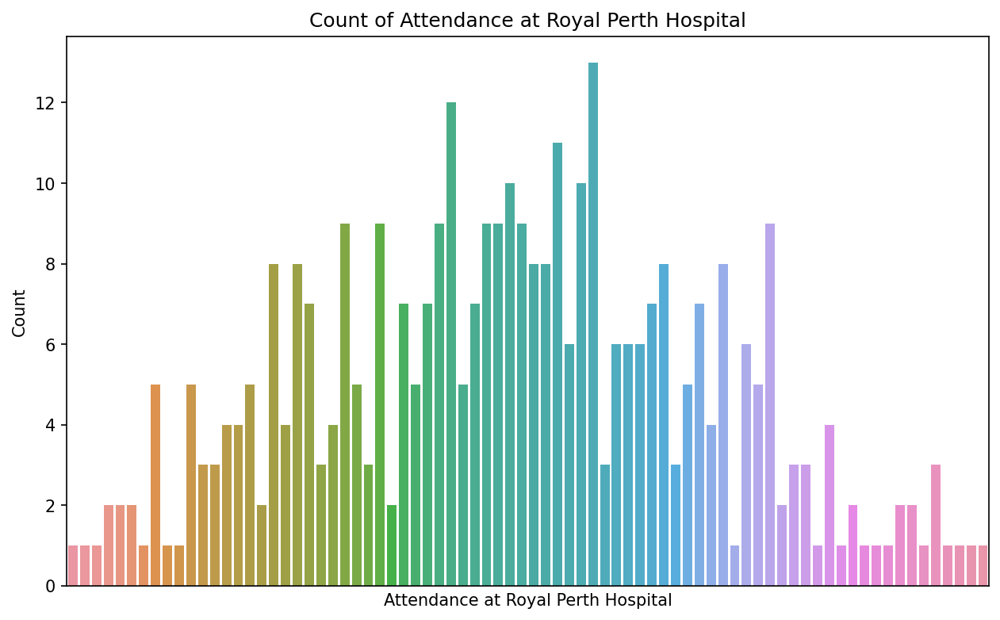

In [285]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Attendance', data=royal_perth_hospital)
plt.title('Count of Attendance at Royal Perth Hospital')
plt.xlabel('Attendance at Royal Perth Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

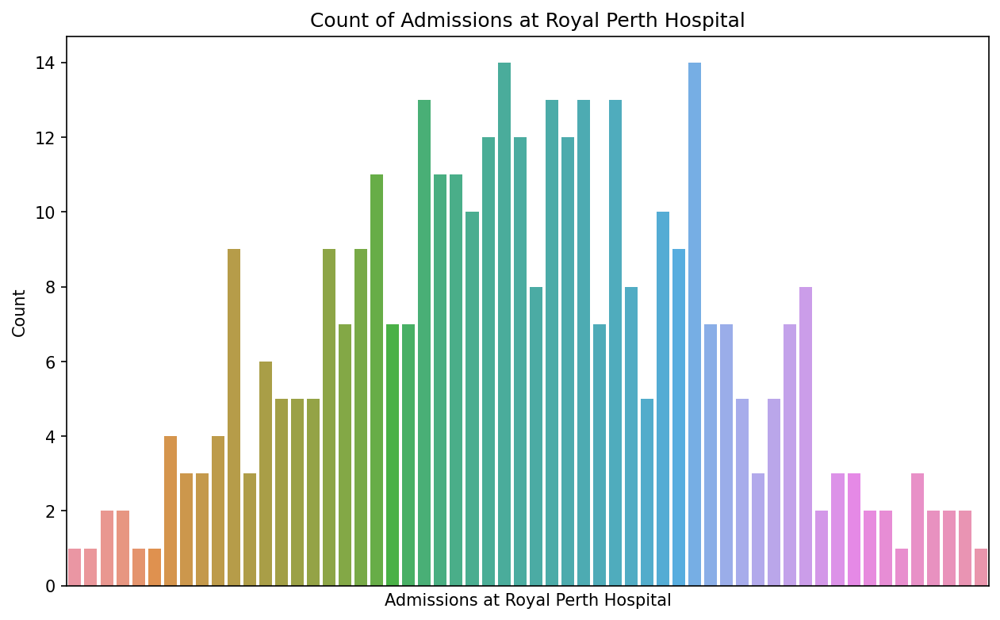

In [286]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Admissions', data=royal_perth_hospital)
plt.title('Count of Admissions at Royal Perth Hospital')
plt.xlabel('Admissions at Royal Perth Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

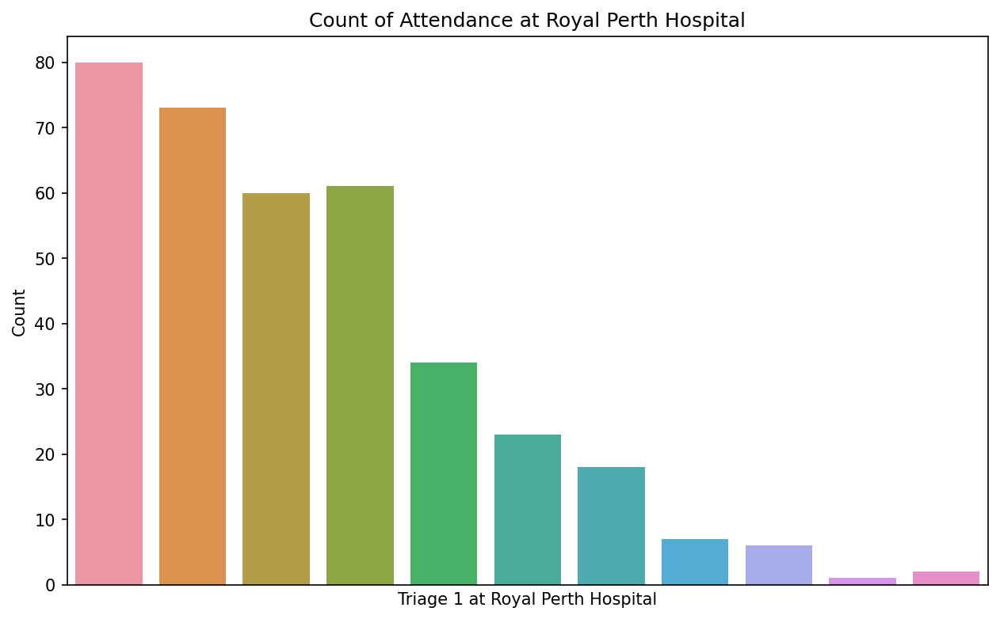

In [287]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_1', data=royal_perth_hospital)
plt.title('Count of Attendance at Royal Perth Hospital')
plt.xlabel('Triage 1 at Royal Perth Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

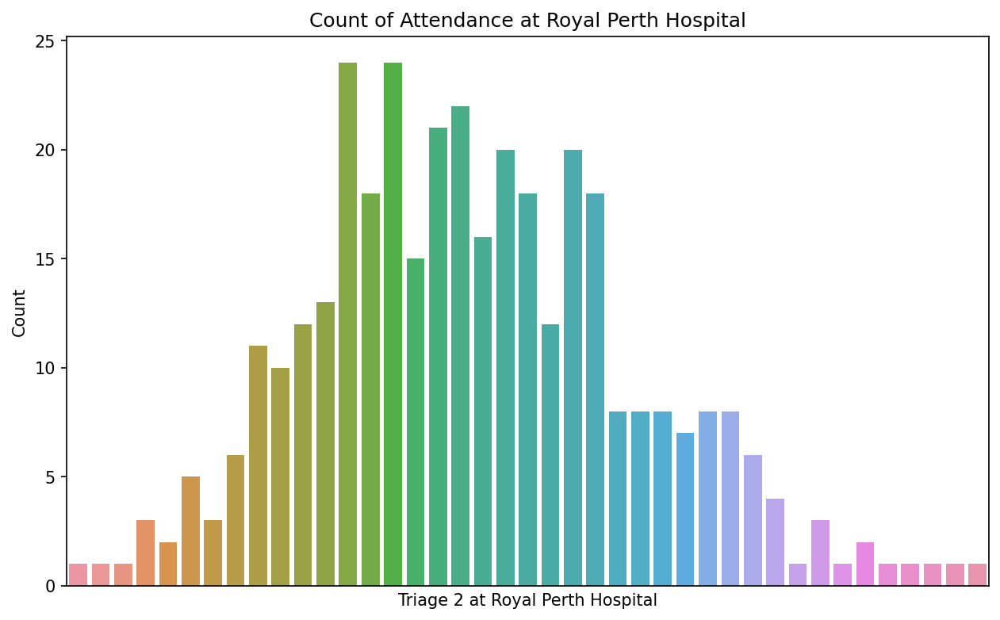

In [288]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_2', data=royal_perth_hospital)
plt.title('Count of Attendance at Royal Perth Hospital')
plt.xlabel('Triage 2 at Royal Perth Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

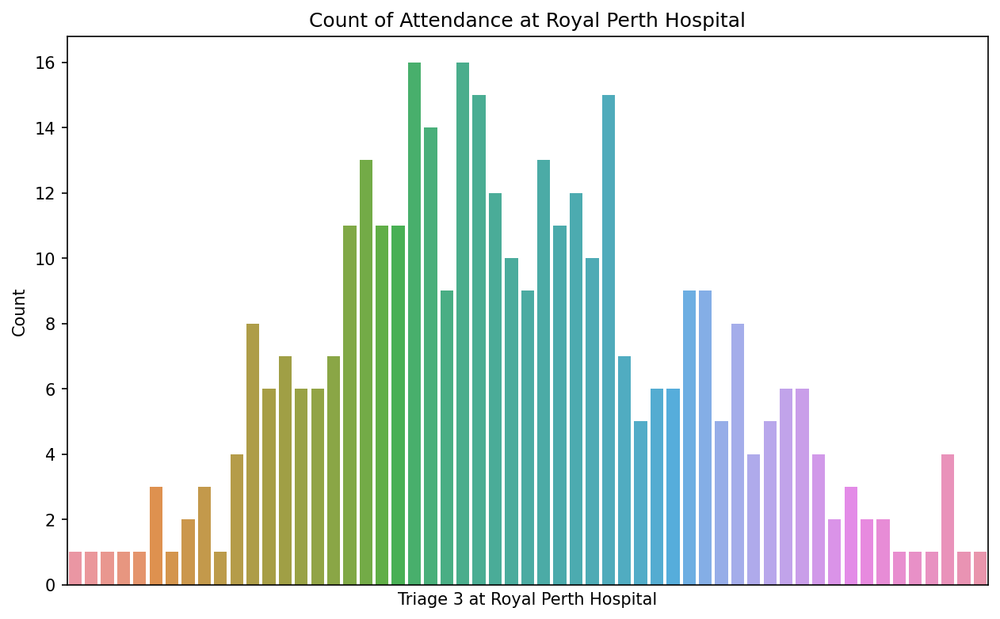

In [289]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_3', data=royal_perth_hospital)
plt.title('Count of Attendance at Royal Perth Hospital')
plt.xlabel('Triage 3 at Royal Perth Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

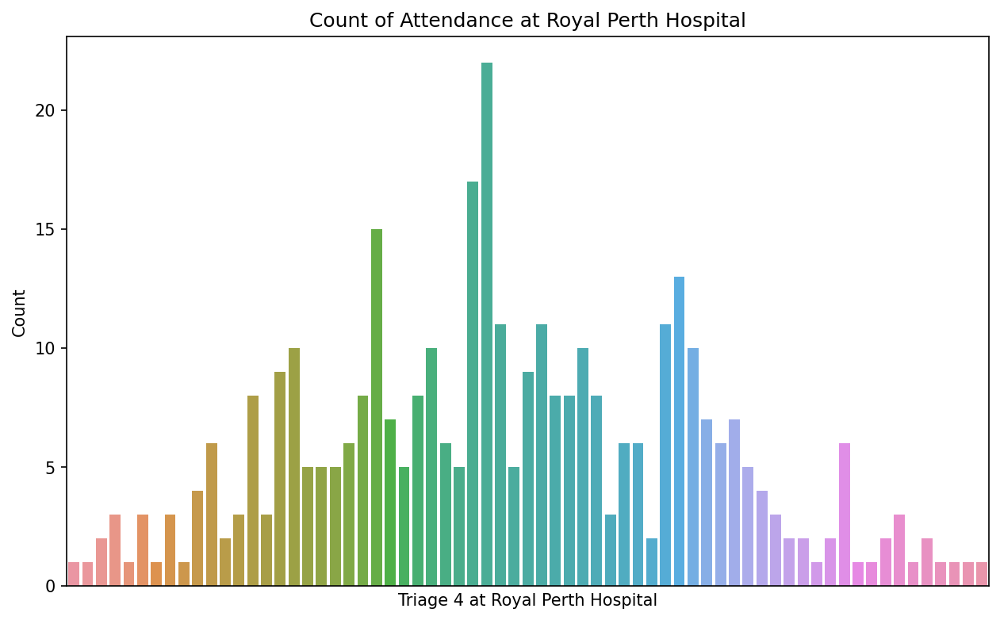

In [290]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_4', data=royal_perth_hospital)
plt.title('Count of Attendance at Royal Perth Hospital')
plt.xlabel('Triage 4 at Royal Perth Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

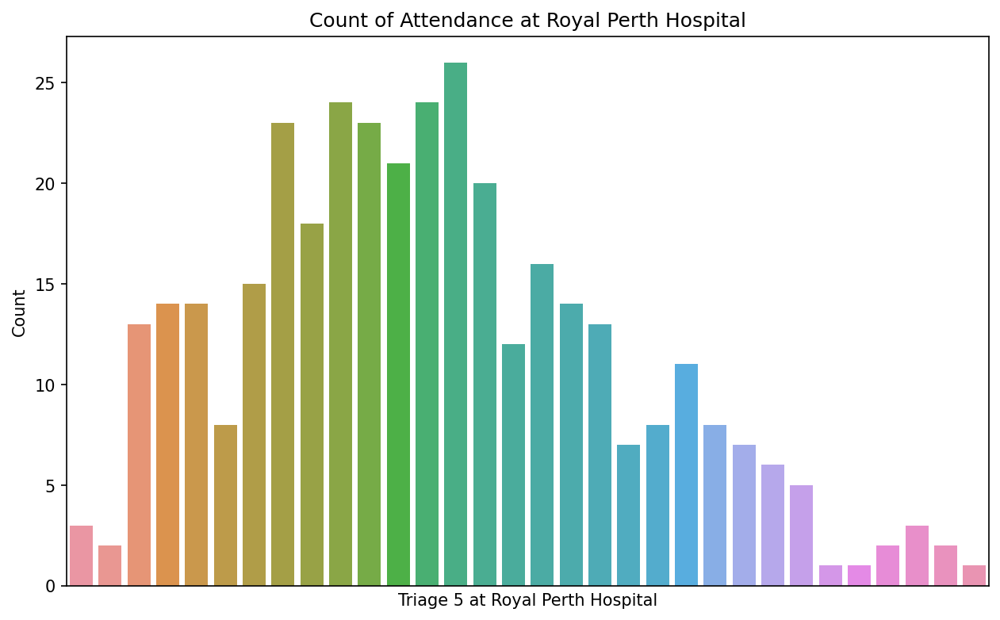

In [291]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_5', data=royal_perth_hospital)
plt.title('Count of Attendance at Royal Perth Hospital')
plt.xlabel('Triage 5 at Royal Perth Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

## Fremantle Hospital

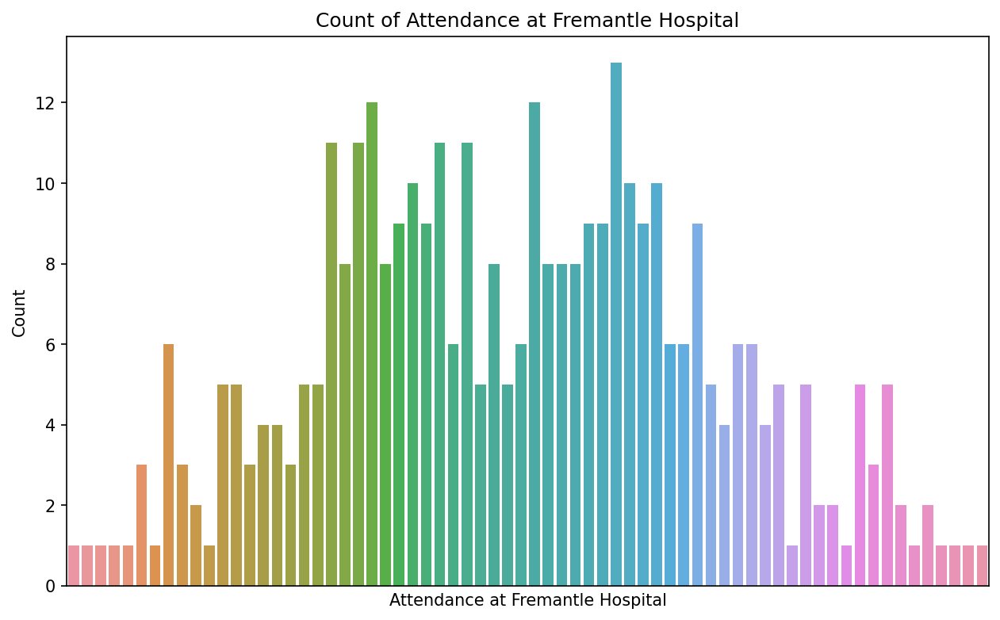

In [292]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Attendance', data=fremantle_hospital)
plt.title('Count of Attendance at Fremantle Hospital')
plt.xlabel('Attendance at Fremantle Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

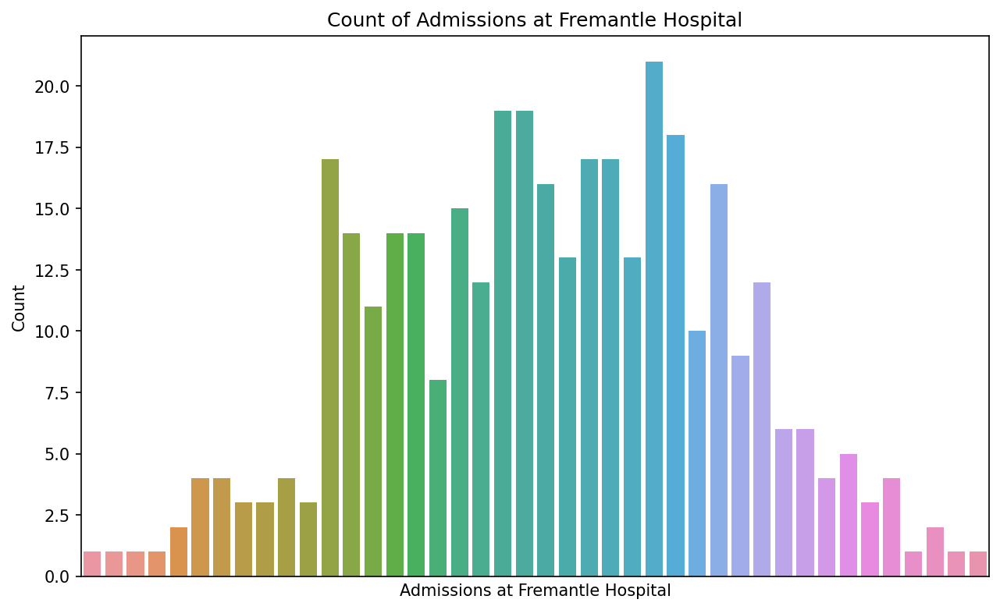

In [293]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Admissions', data=fremantle_hospital)
plt.title('Count of Admissions at Fremantle Hospital')
plt.xlabel('Admissions at Fremantle Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

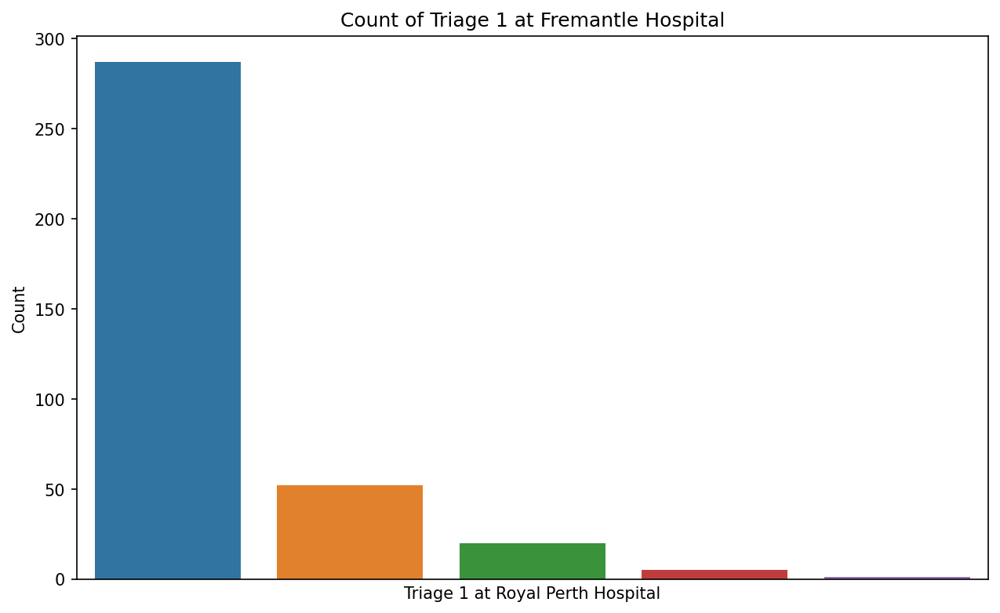

In [294]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_1', data=fremantle_hospital)
plt.title('Count of Triage 1 at Fremantle Hospital')
plt.xlabel('Triage 1 at Royal Perth Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

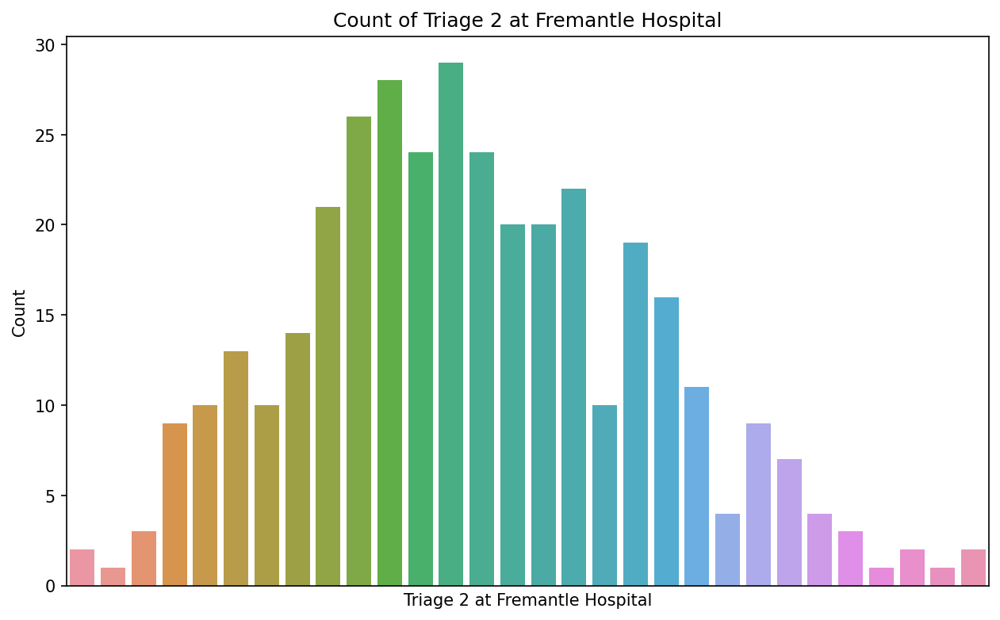

In [295]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_2', data=fremantle_hospital)
plt.title('Count of Triage 2 at Fremantle Hospital')
plt.xlabel('Triage 2 at Fremantle Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

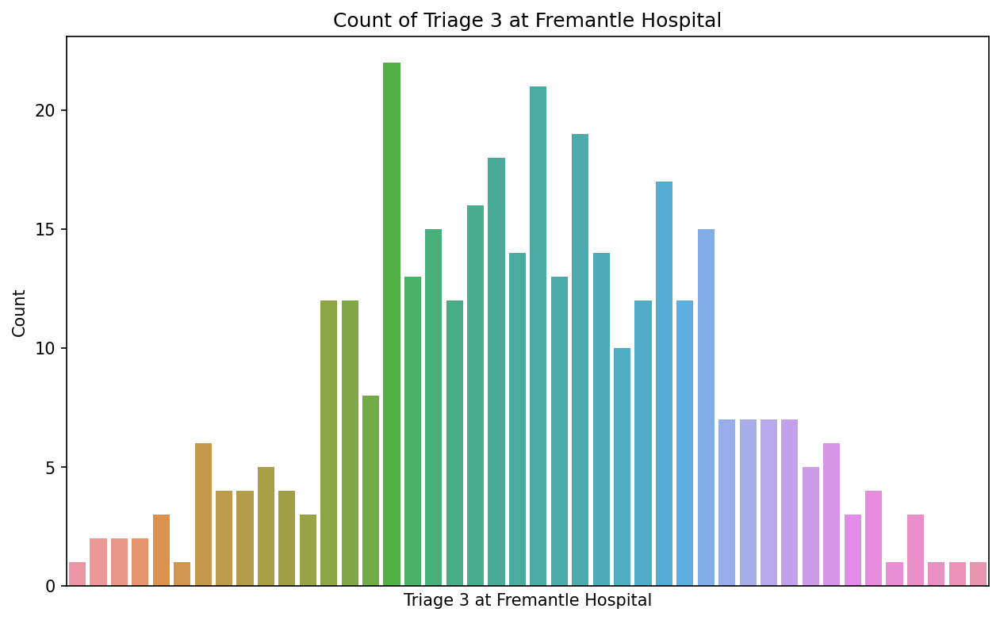

In [296]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_3', data=fremantle_hospital)
plt.title('Count of Triage 3 at Fremantle Hospital')
plt.xlabel('Triage 3 at Fremantle Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

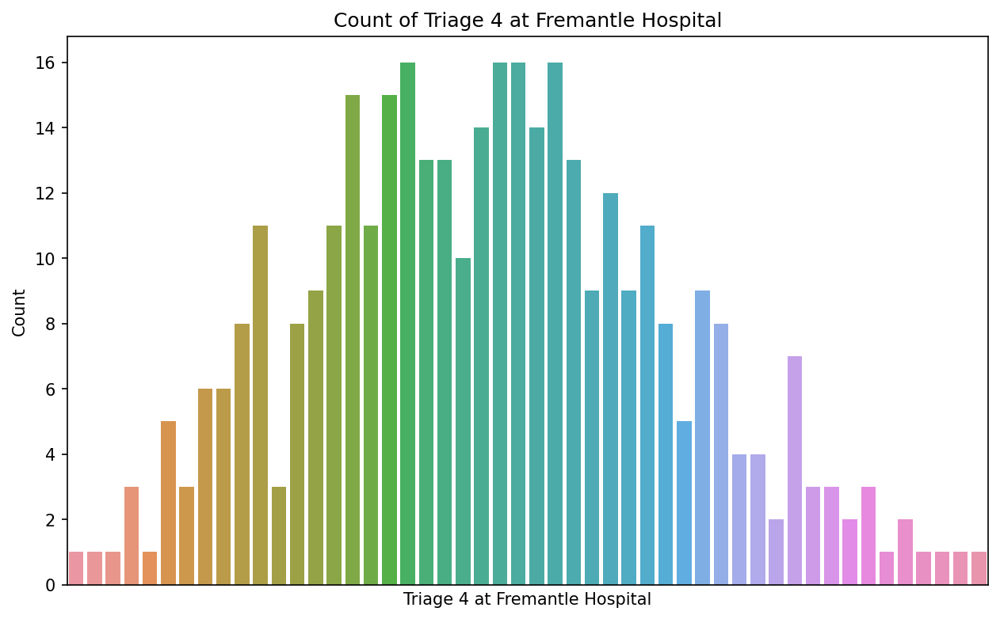

In [297]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_4', data=fremantle_hospital)
plt.title("Count of Triage 4 at Fremantle Hospital")
plt.xlabel('Triage 4 at Fremantle Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

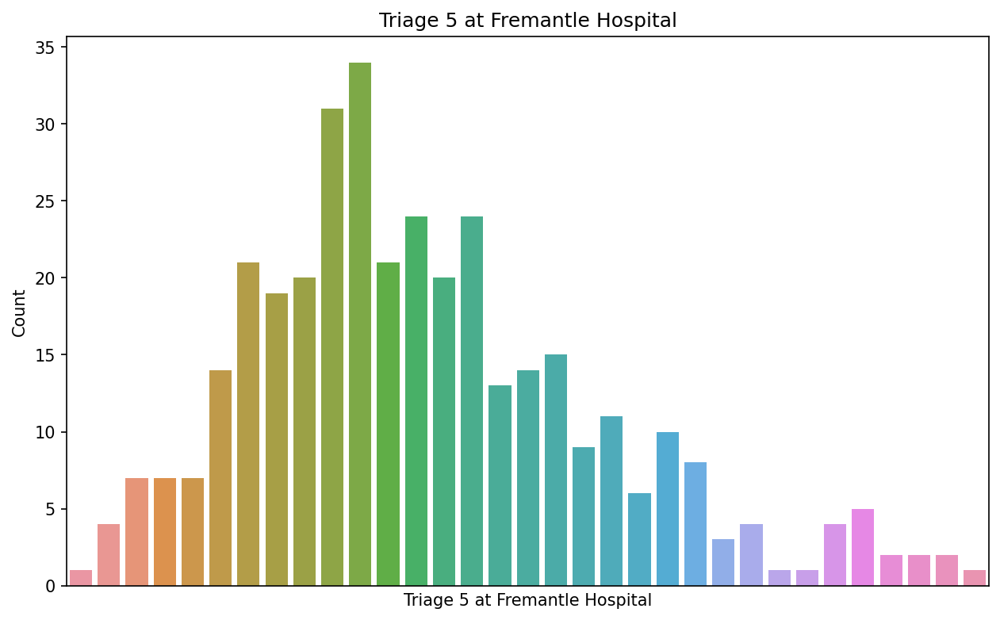

In [298]:
plt.figure(figsize=(10,6), dpi=150)
sns.countplot(x='Tri_5', data=fremantle_hospital)
plt.title('Triage 5 at Fremantle Hospital')
plt.xlabel('Triage 5 at Fremantle Hospital')
plt.xticks([])
plt.ylabel('Count')
plt.show()

## Princess Margaret Children's Hospital

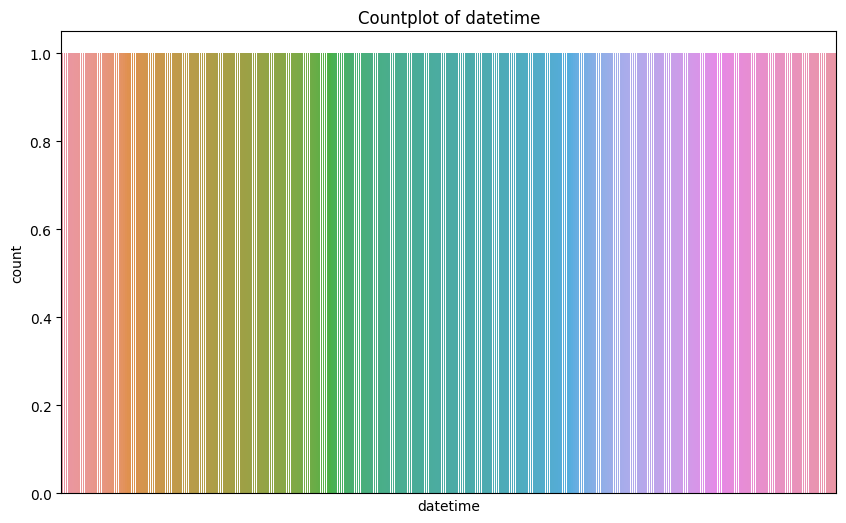

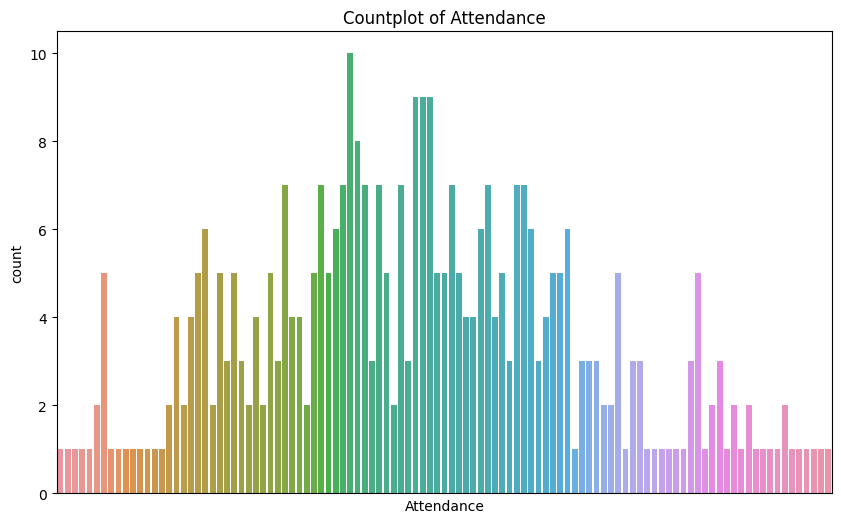

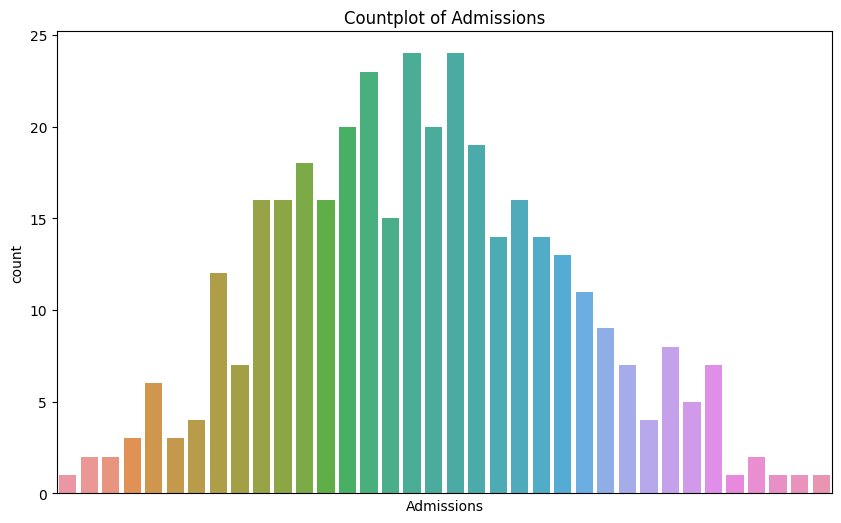

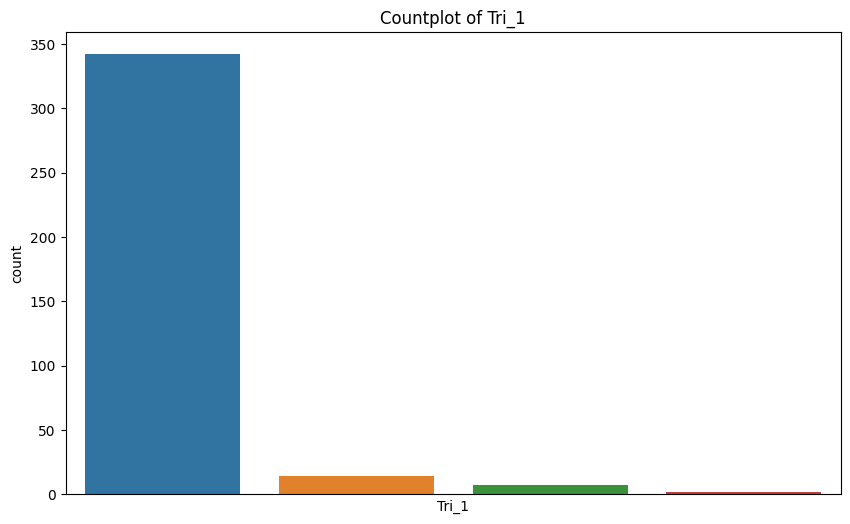

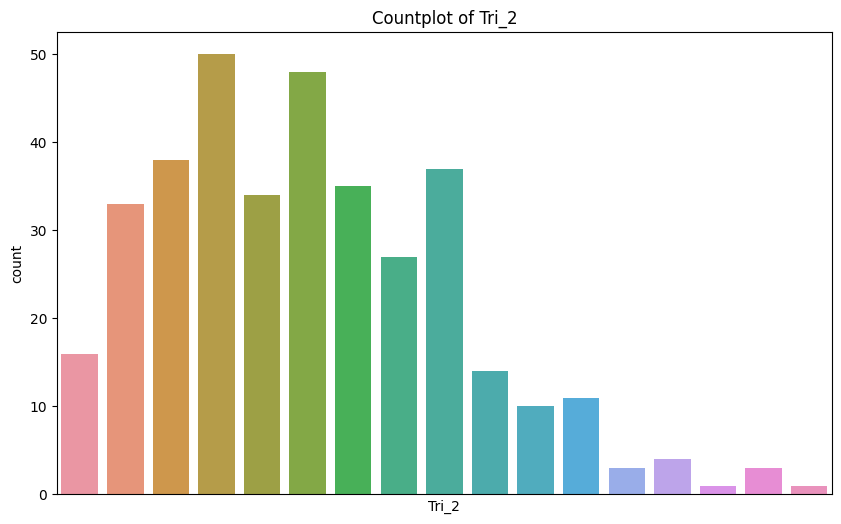

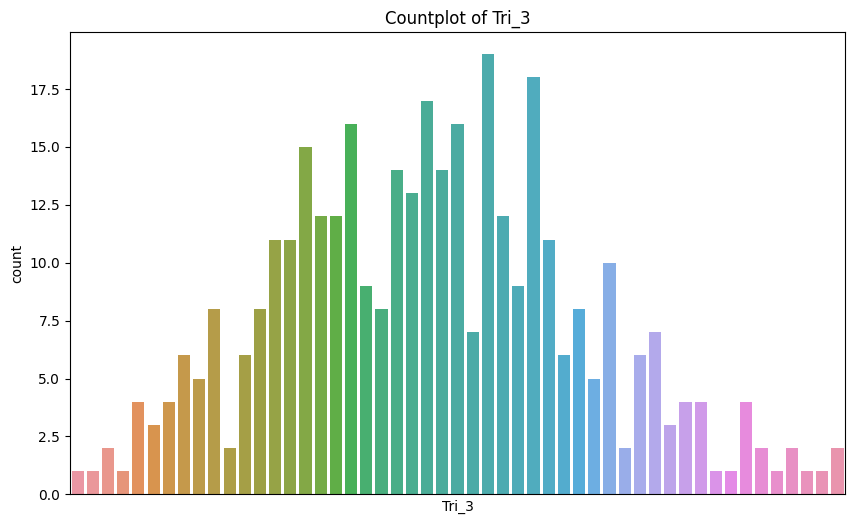

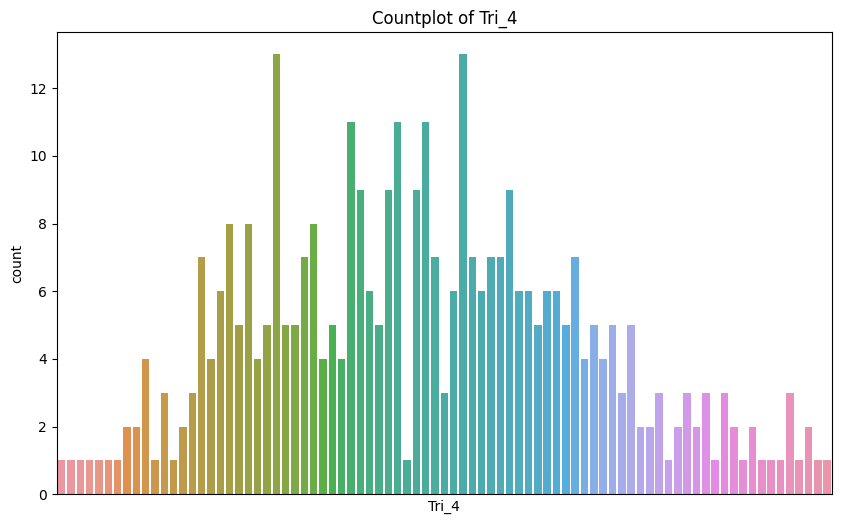

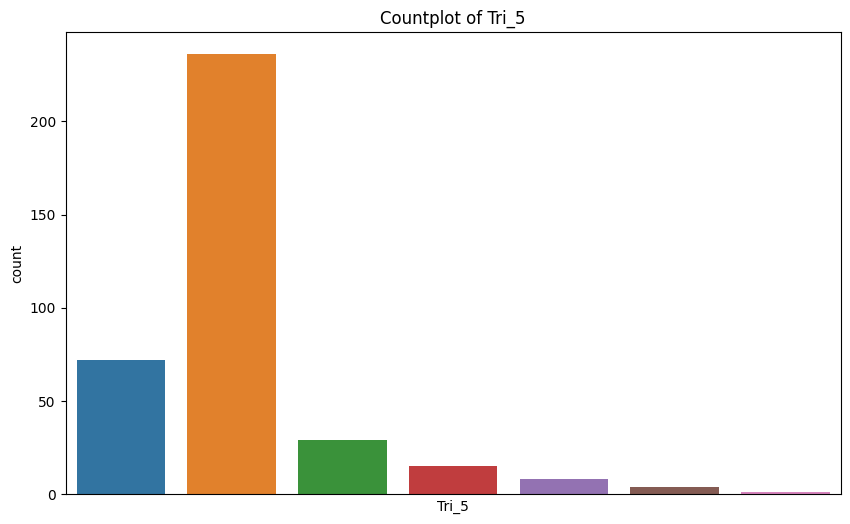

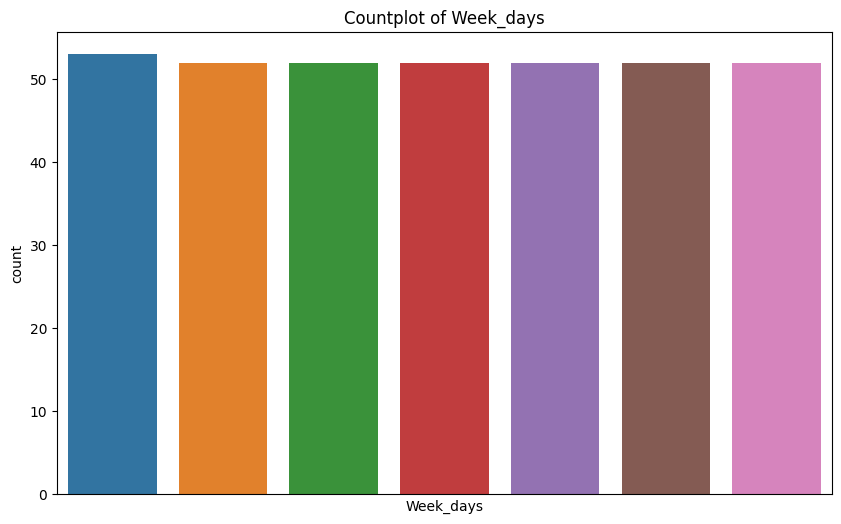

In [299]:
for column in Princess_Marg_Child.columns:
    plt.figure(figsize=(10, 6))  # optional: set the figure size
    sns.countplot(data=Princess_Marg_Child, x=column)  # Create a countplot
    plt.title(f'Countplot of {column}')
    plt.xticks([])  # Set the title of the plot
    plt.show()  # Show the plot

In [300]:
Princess_Marg_Child.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    365 non-null    datetime64[ns]
 1   Attendance  365 non-null    Int64         
 2   Admissions  365 non-null    Int64         
 3   Tri_1       365 non-null    Int64         
 4   Tri_2       365 non-null    Int64         
 5   Tri_3       365 non-null    Int64         
 6   Tri_4       365 non-null    Int64         
 7   Tri_5       365 non-null    Int64         
 8   Week_days   365 non-null    Int64         
dtypes: Int64(8), datetime64[ns](1)
memory usage: 28.6 KB


## King Edward Memorial Women's Hospital

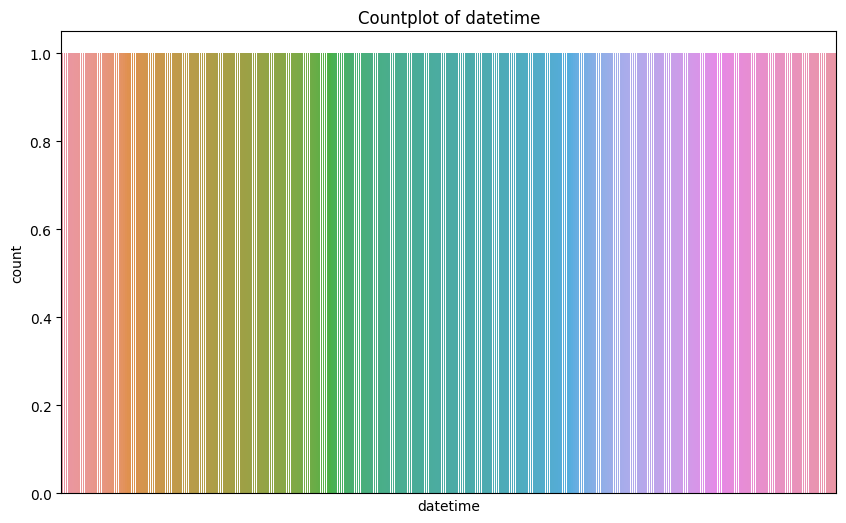

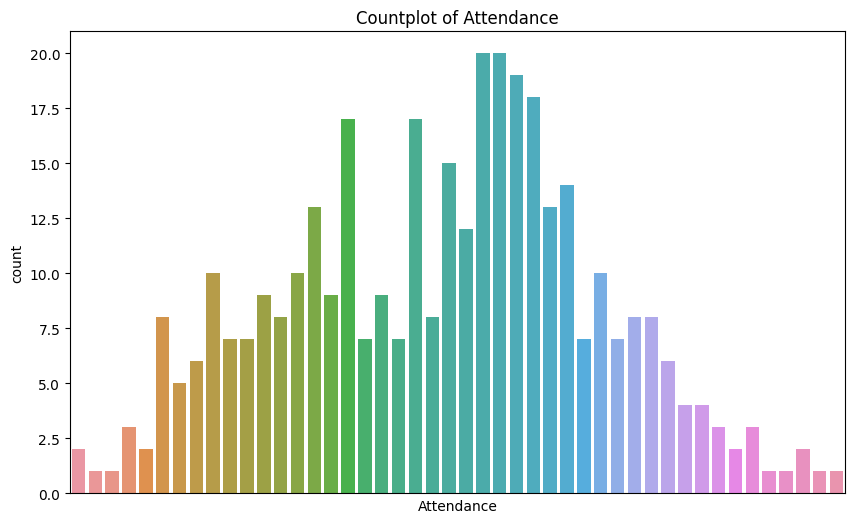

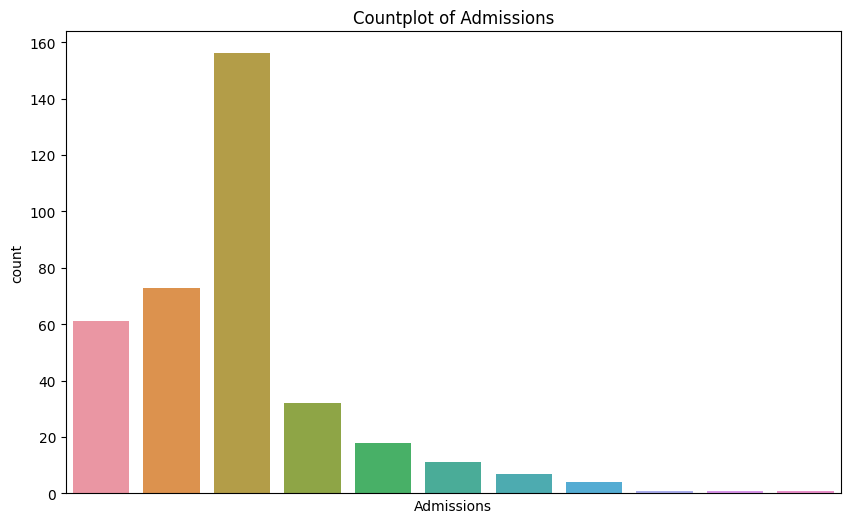

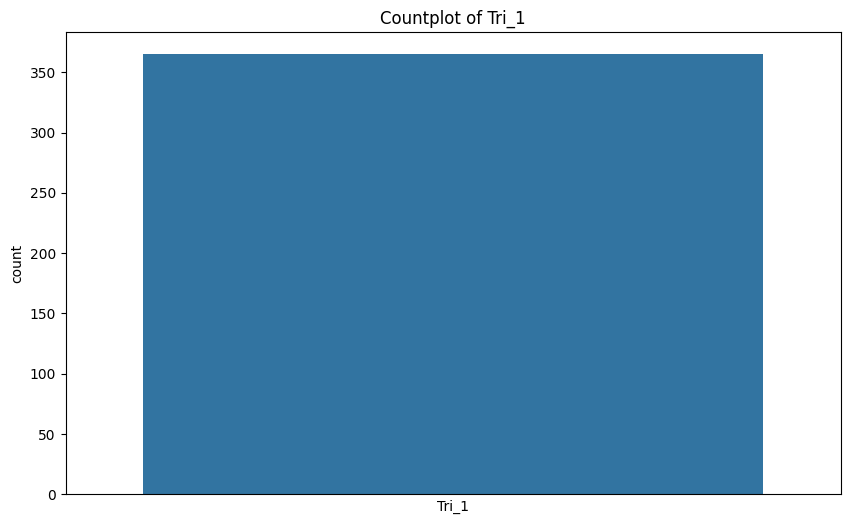

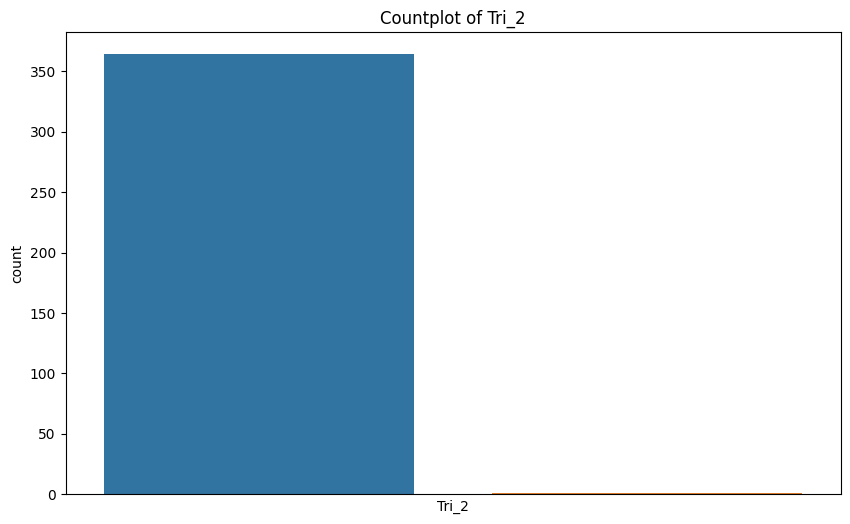

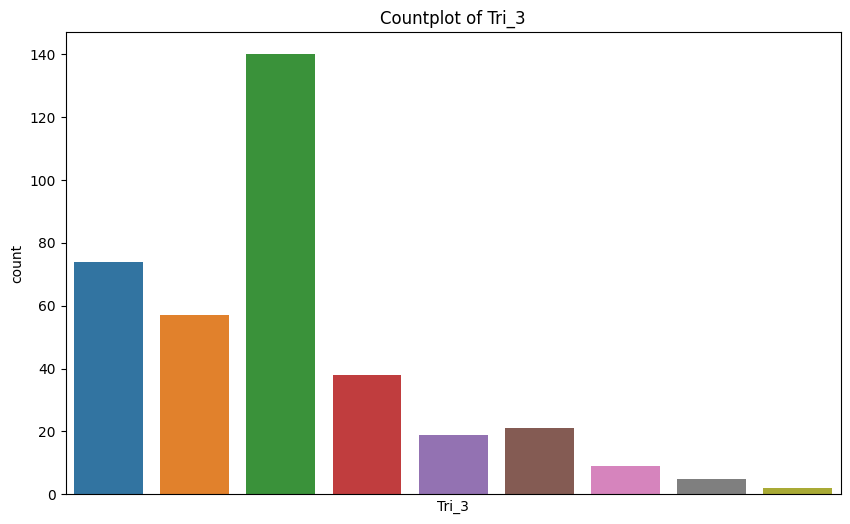

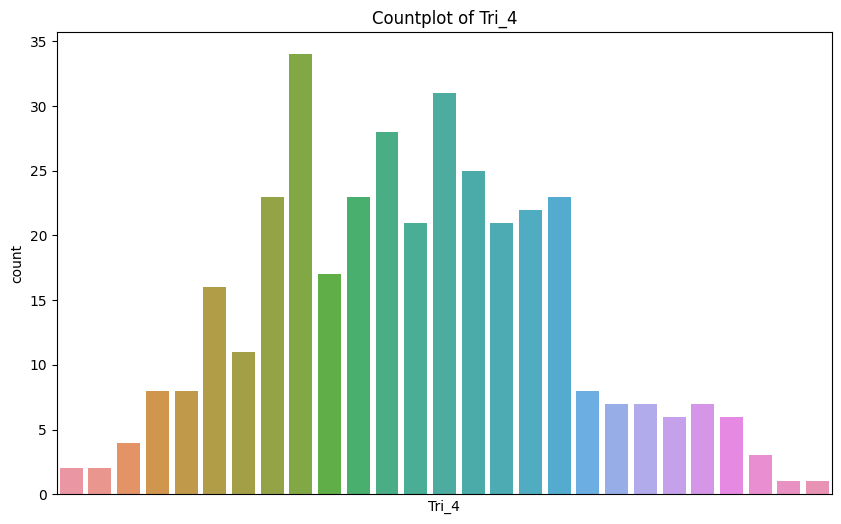

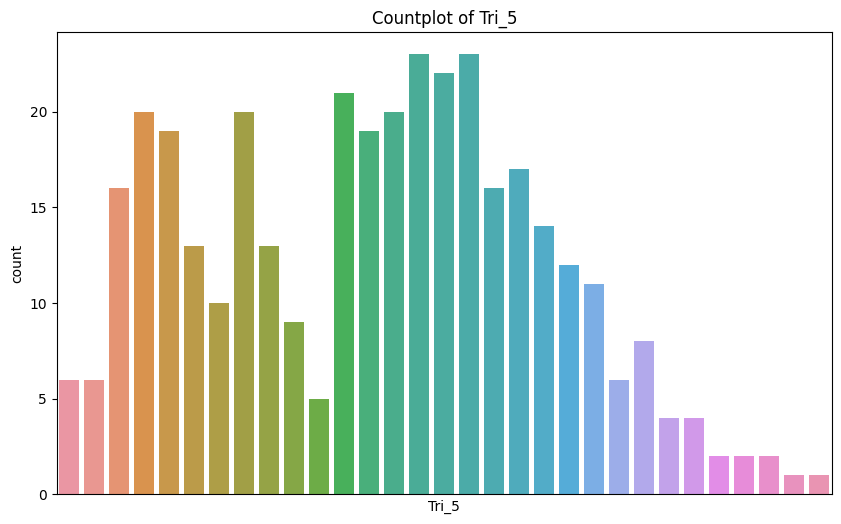

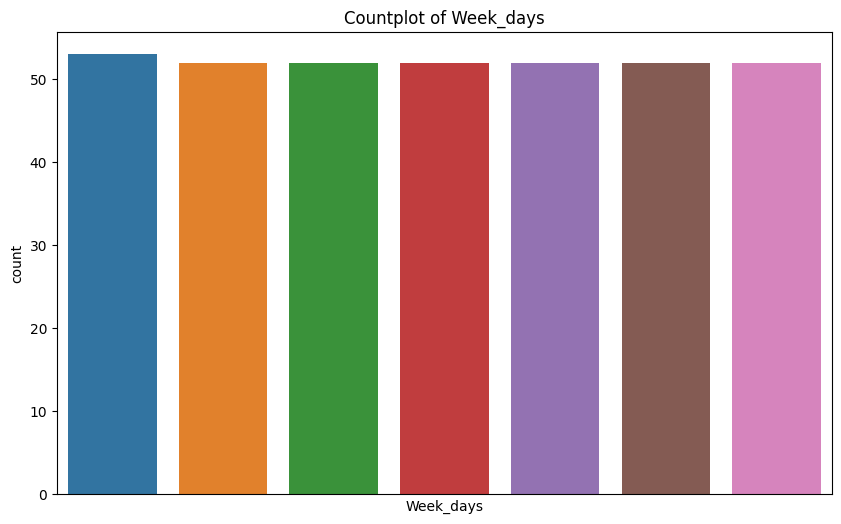

In [301]:
for column in King_Ed_Memorial_Women.columns:
    plt.figure(figsize=(10, 6))  # optional: set the figure size
    sns.countplot(data=King_Ed_Memorial_Women, x=column)  # Create a countplot
    plt.title(f'Countplot of {column}')
    plt.xticks([])  # Set the title of the plot
    plt.show()  # Show the plot

## Sir Charles Hospital

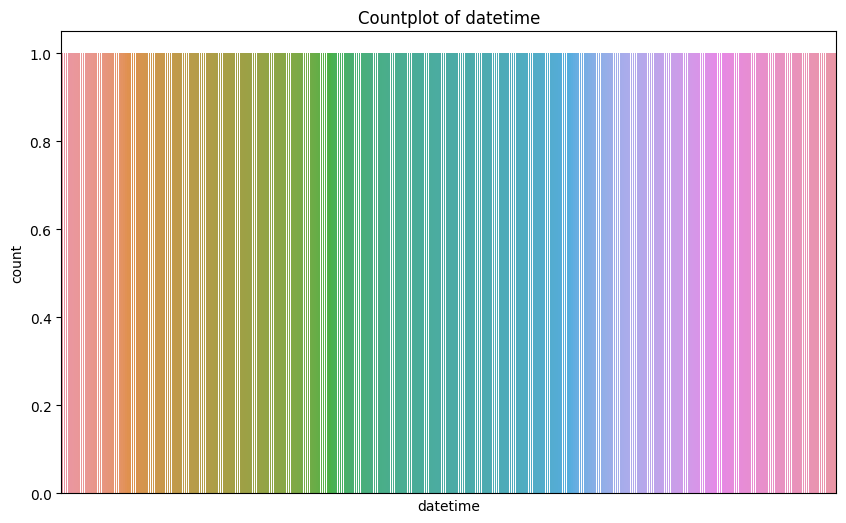

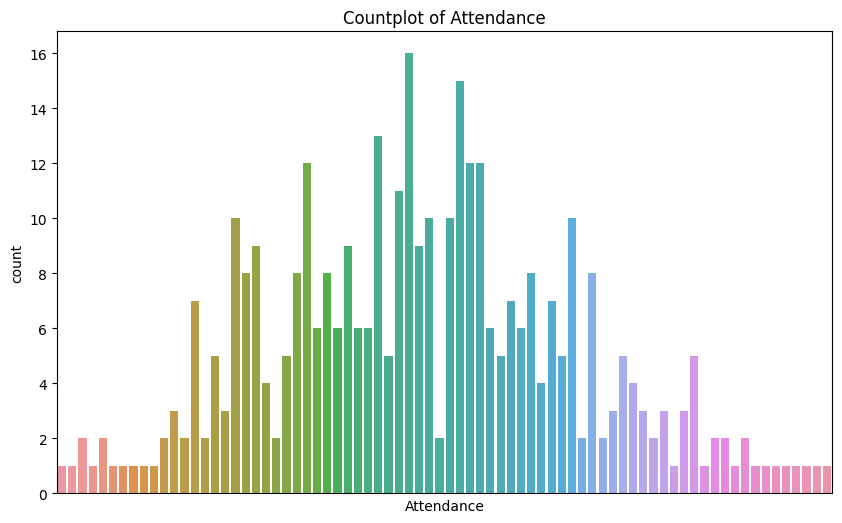

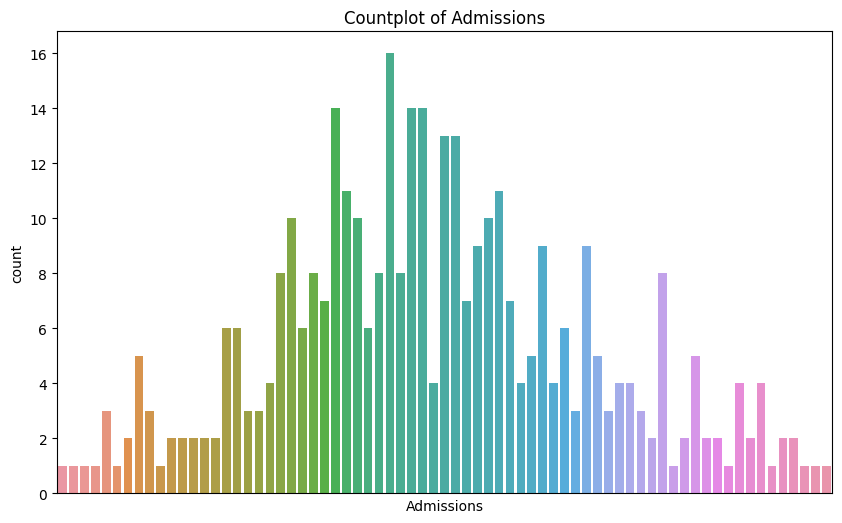

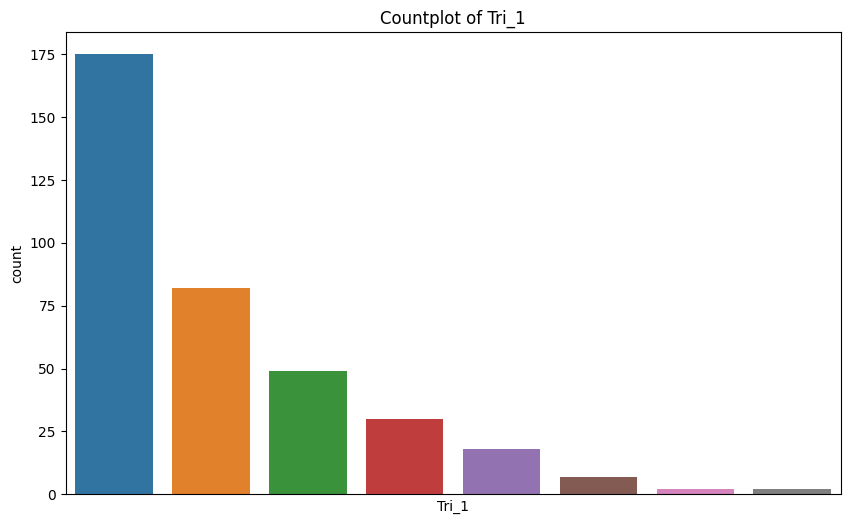

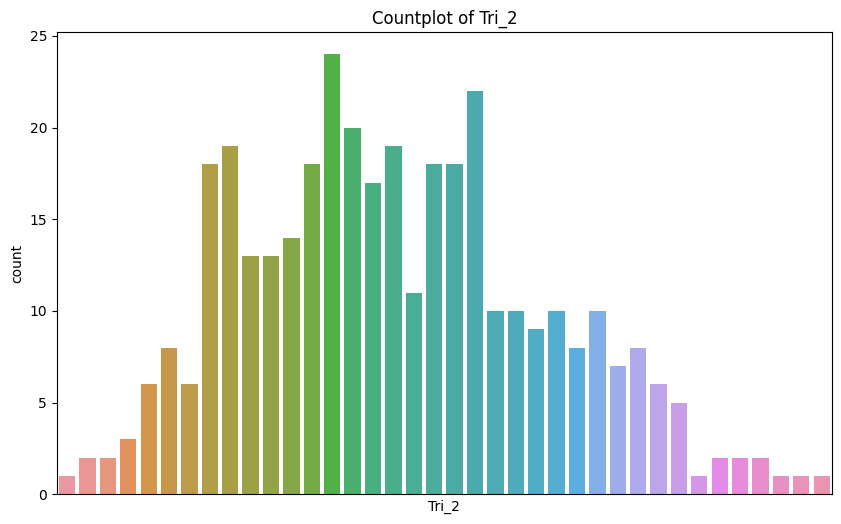

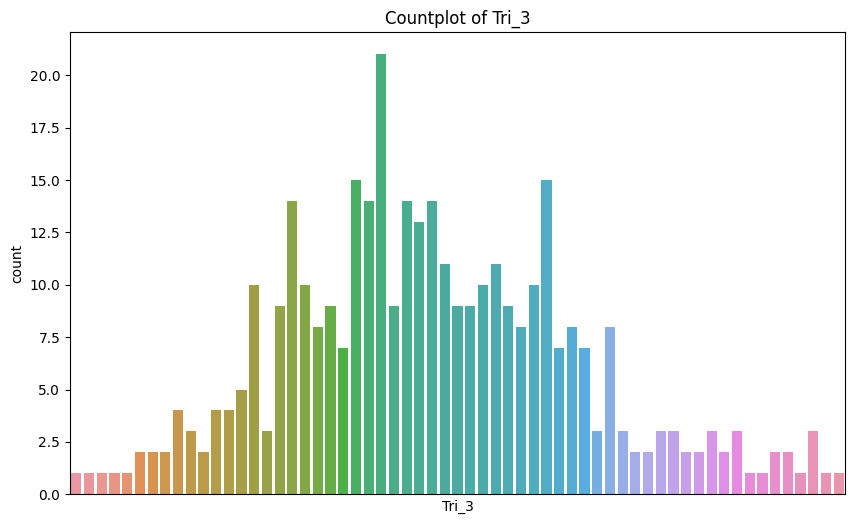

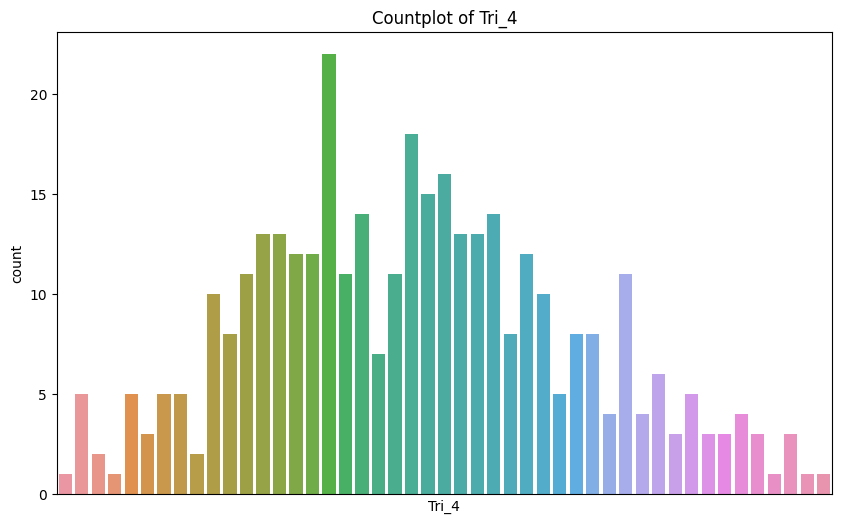

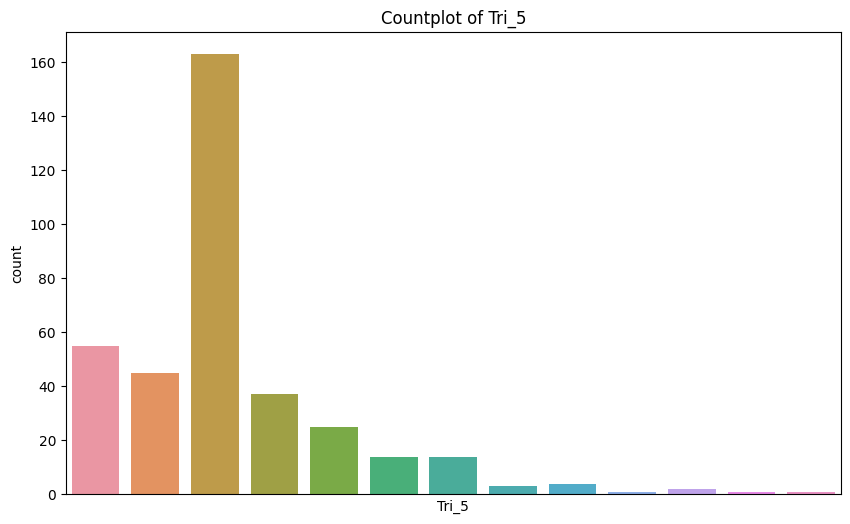

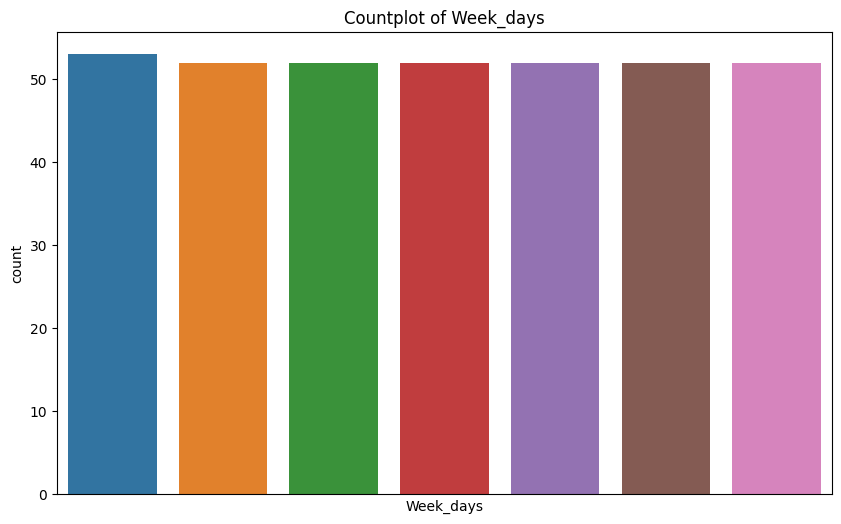

In [302]:
for column in Sir_charles_hospital.columns:
    plt.figure(figsize=(10, 6))  # optional: set the figure size
    sns.countplot(data=Sir_charles_hospital, x=column)  # Create a countplot
    plt.title(f'Countplot of {column}')
    plt.xticks([])  # Set the title of the plot
    plt.show()  # Show the plot

## Armadale Memorial Hospital

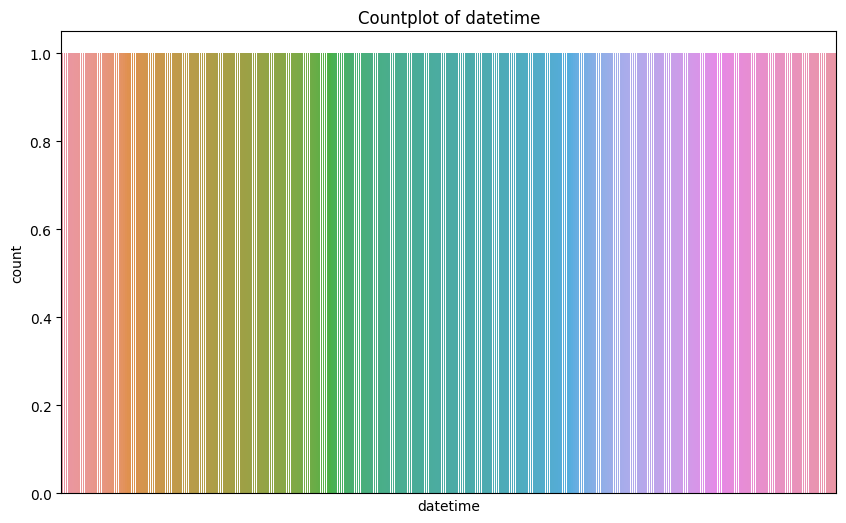

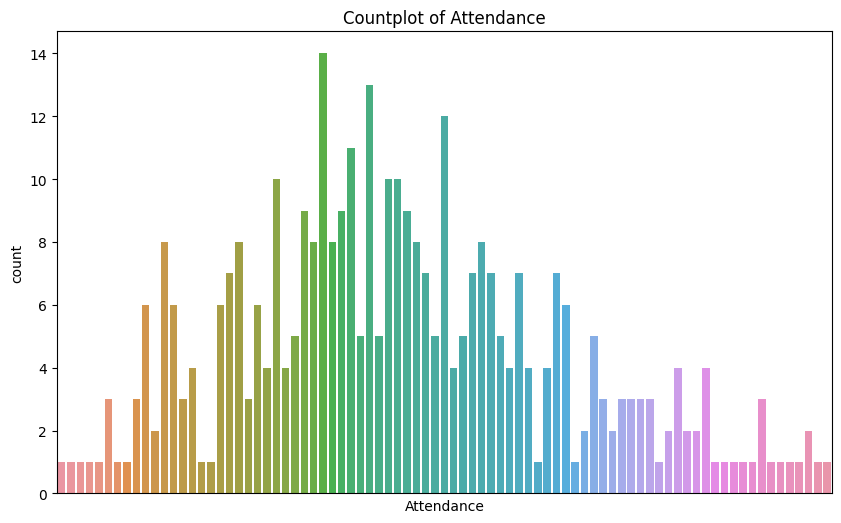

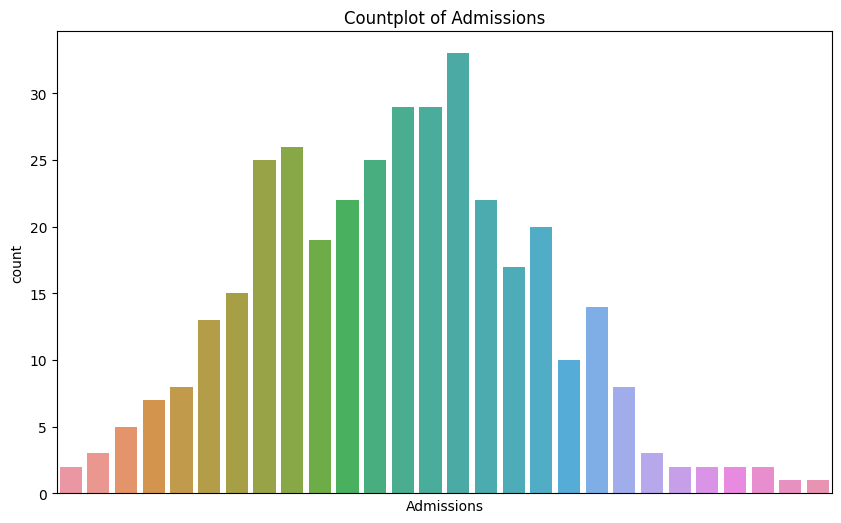

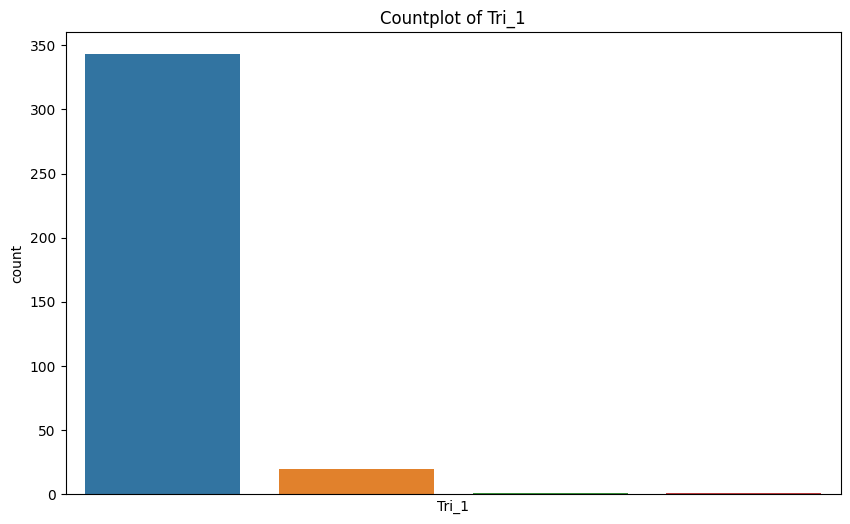

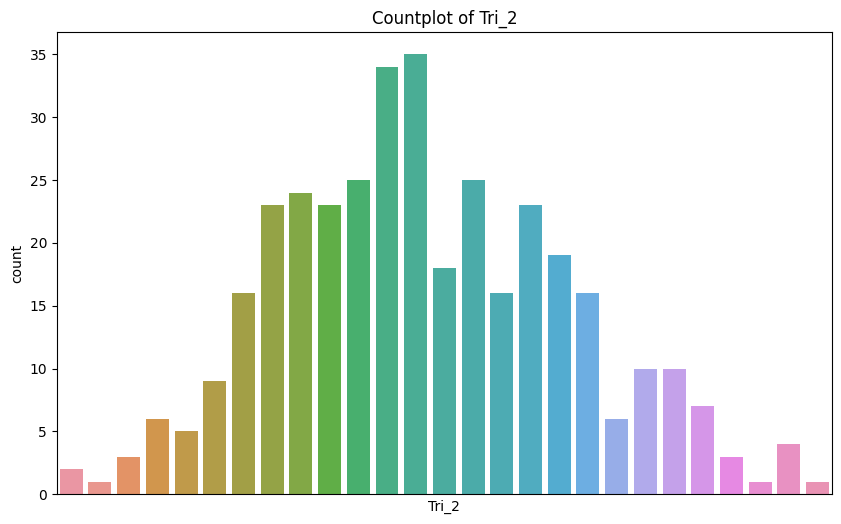

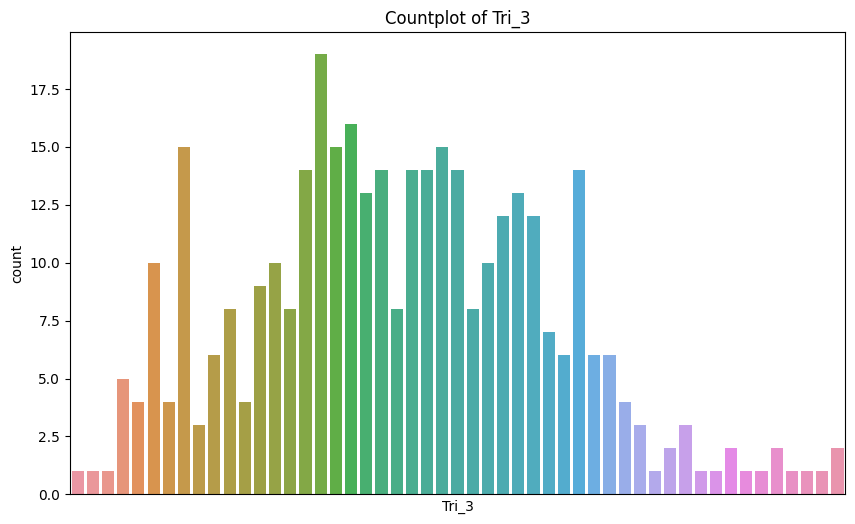

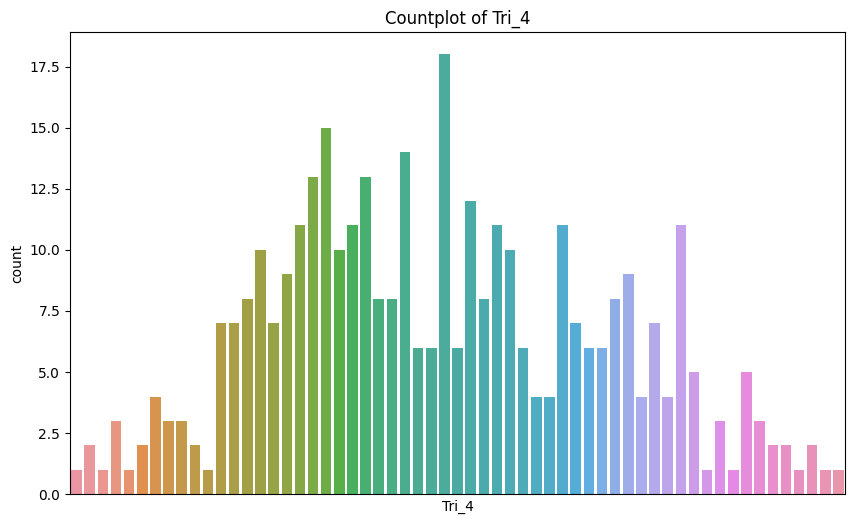

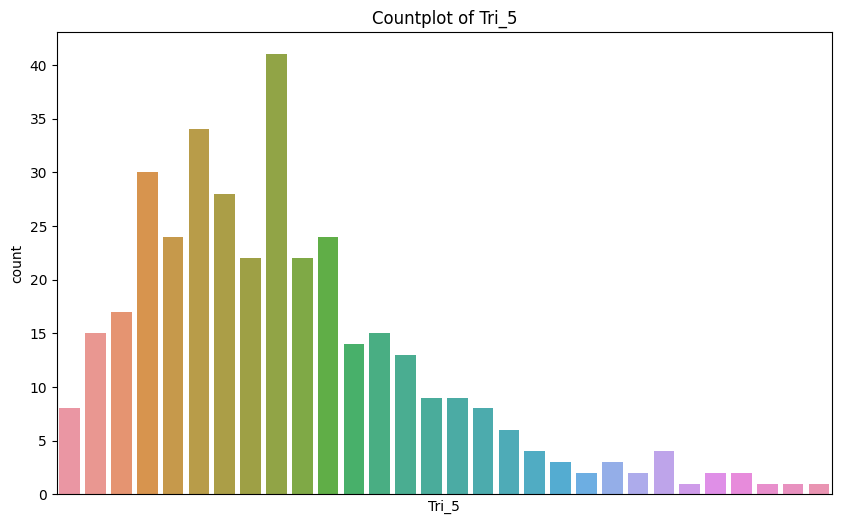

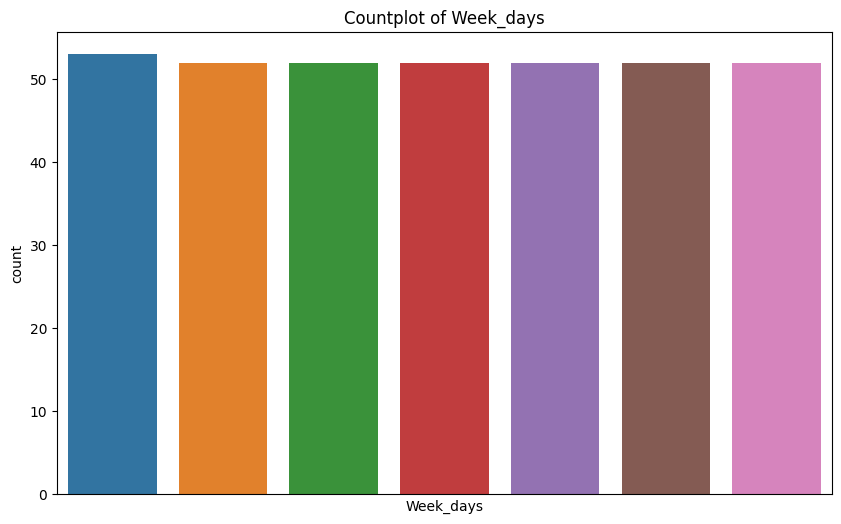

In [303]:
for column in Armadale_memorial_hospital.columns:
    plt.figure(figsize=(10, 6))  # optional: set the figure size
    sns.countplot(data=Armadale_memorial_hospital, x=column)  # Create a countplot
    plt.title(f'Countplot of {column}')
    plt.xticks([])  # Set the title of the plot
    plt.show()  # Show the plot

## Swan District Hospital

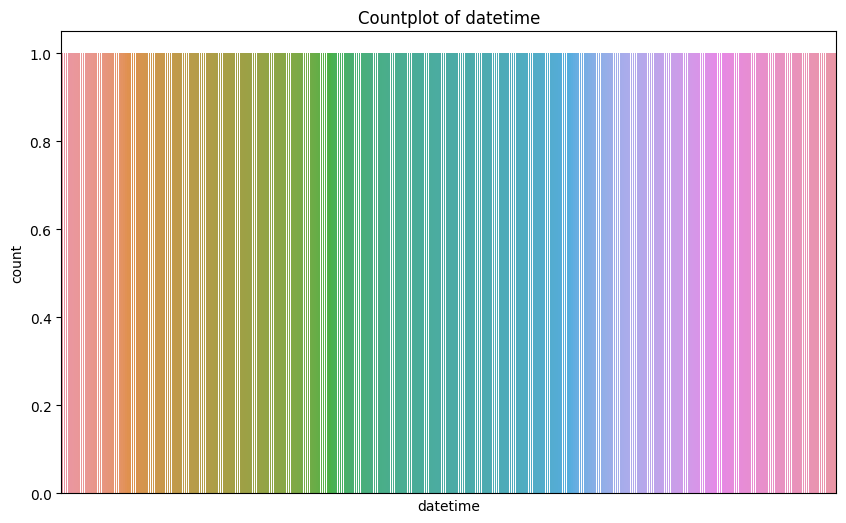

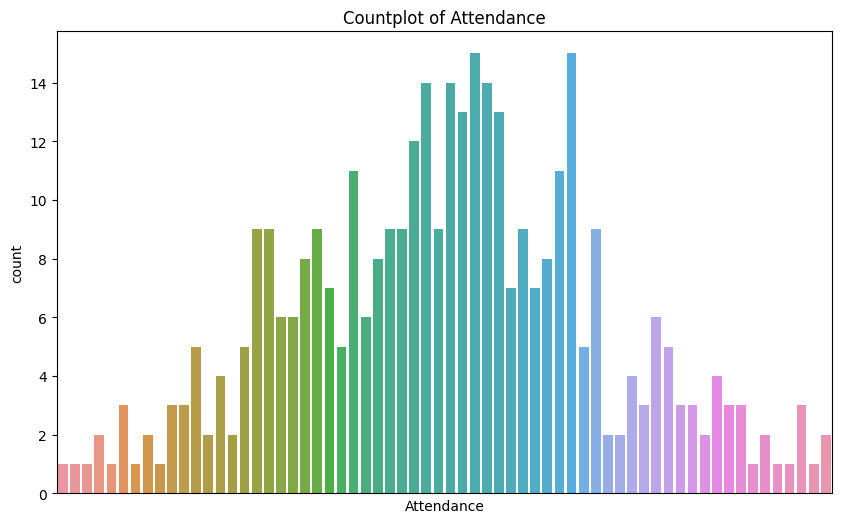

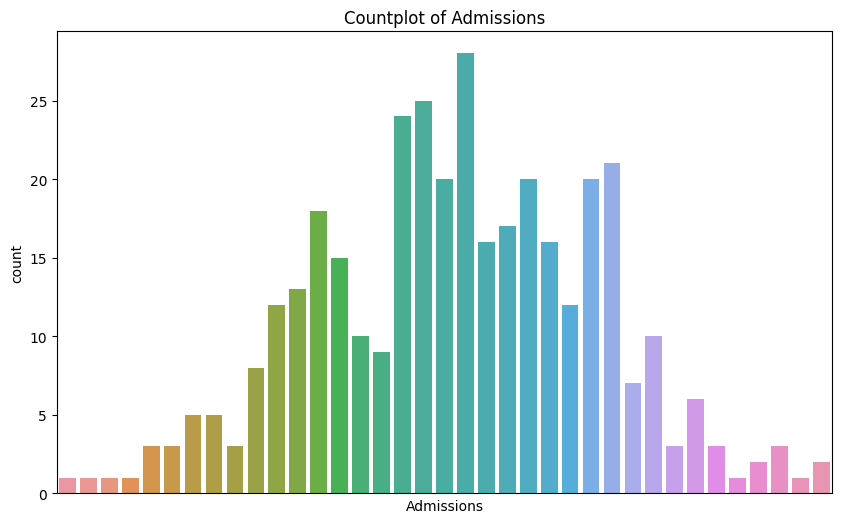

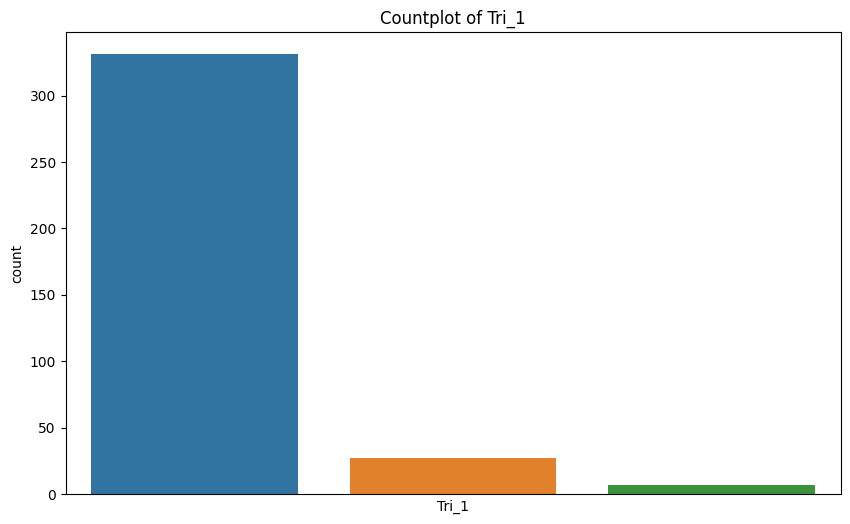

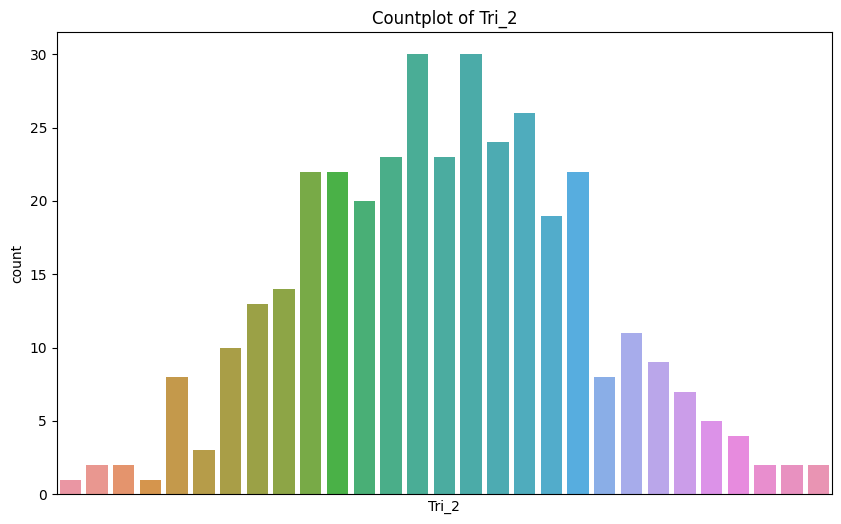

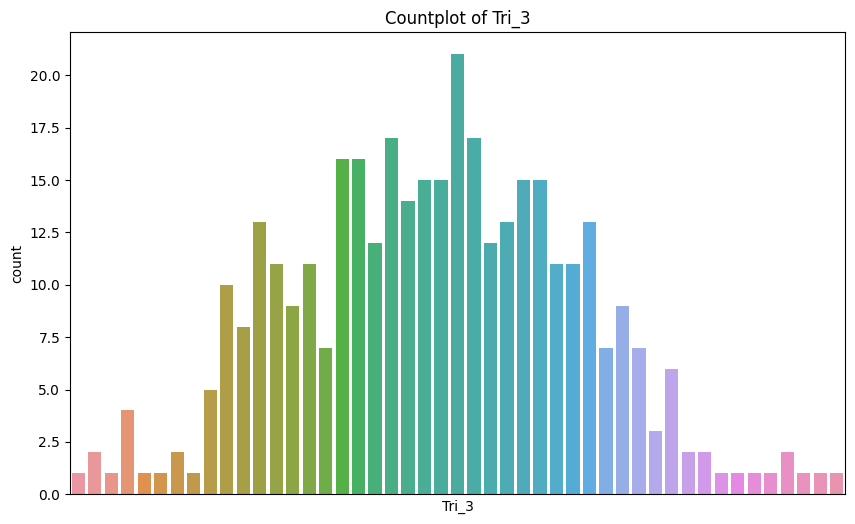

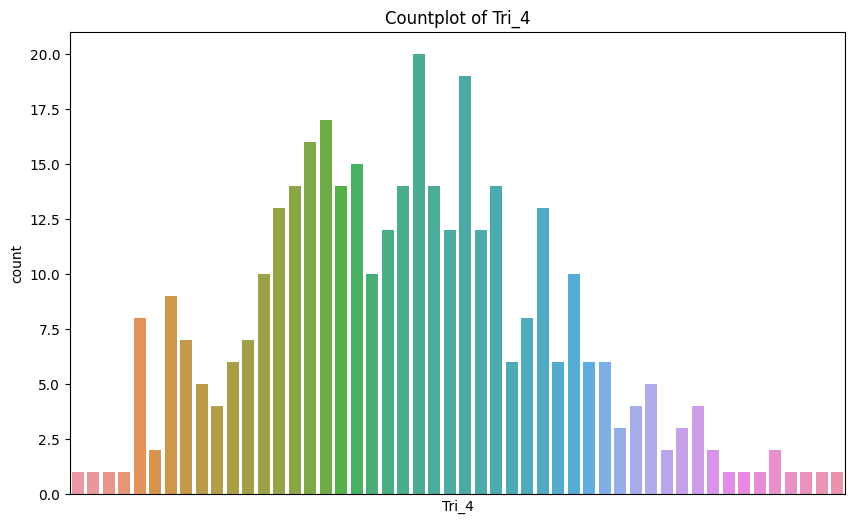

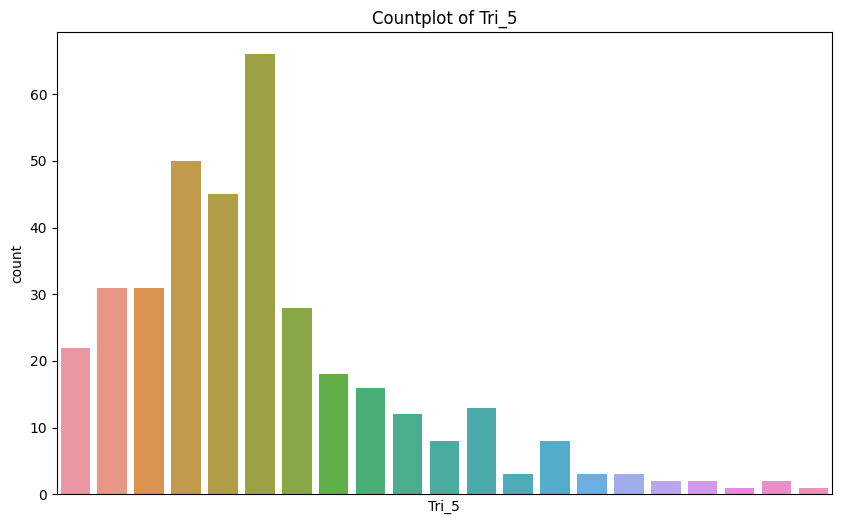

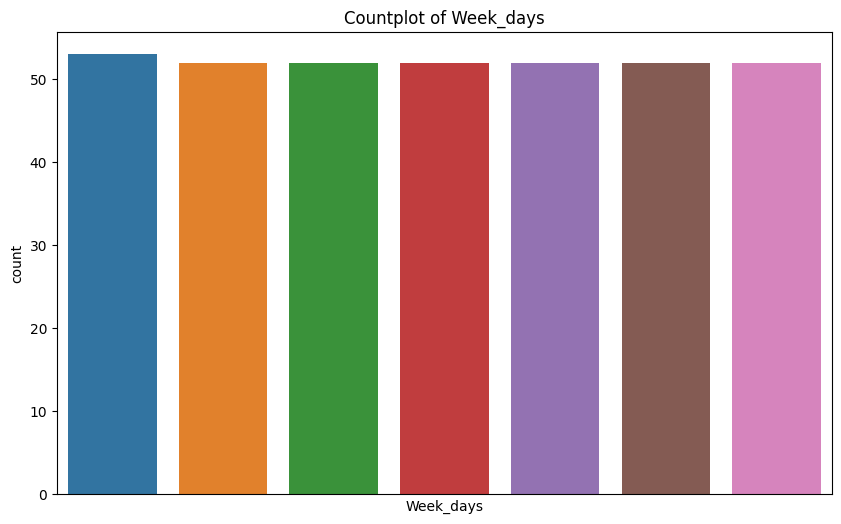

In [304]:
for column in Swan_district_hospital.columns:
    plt.figure(figsize=(10, 6))  # optional: set the figure size
    sns.countplot(data=Swan_district_hospital, x=column)  # Create a countplot
    plt.title(f'Countplot of {column}')
    plt.xticks([])  # Set the title of the plot
    plt.show()  # Show the plot

## Rockingham General Hospital

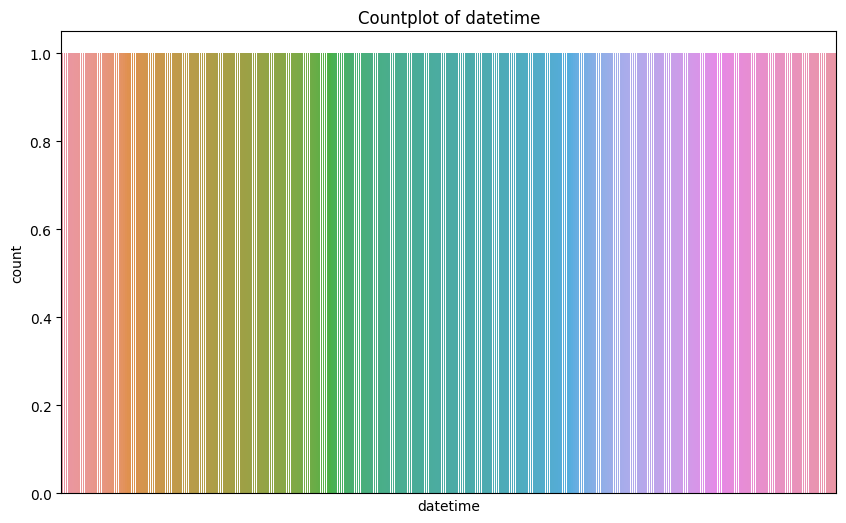

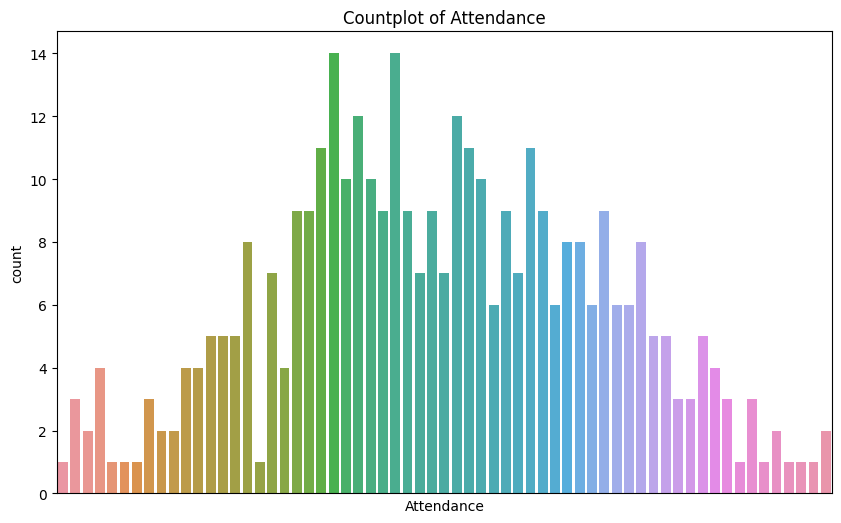

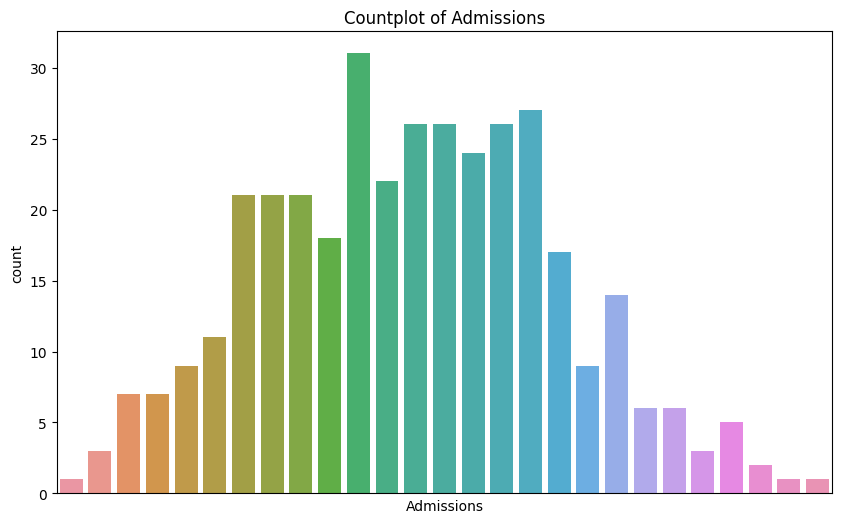

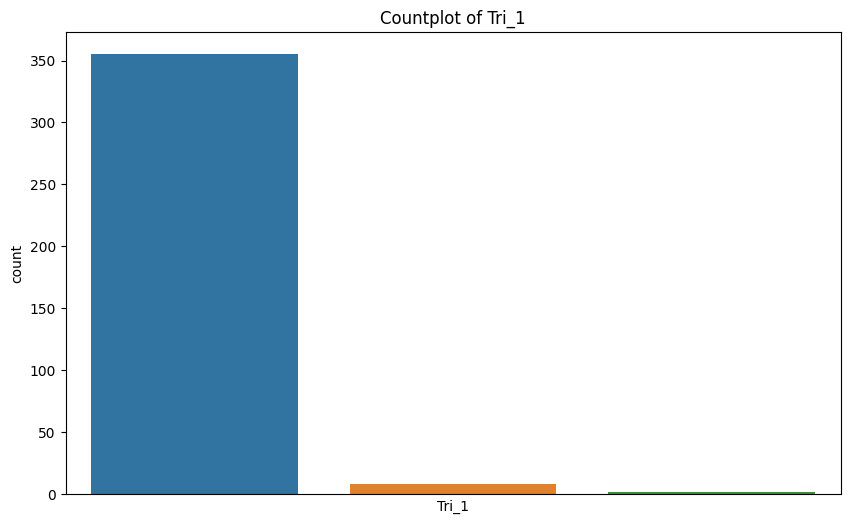

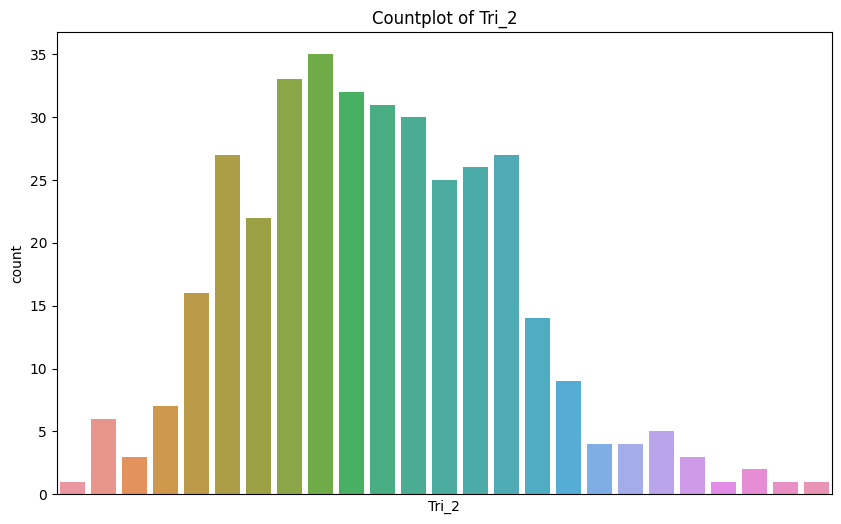

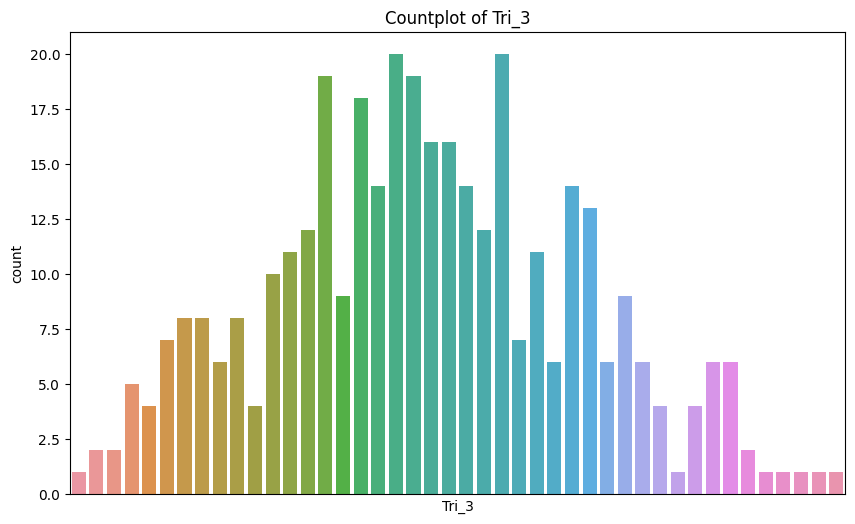

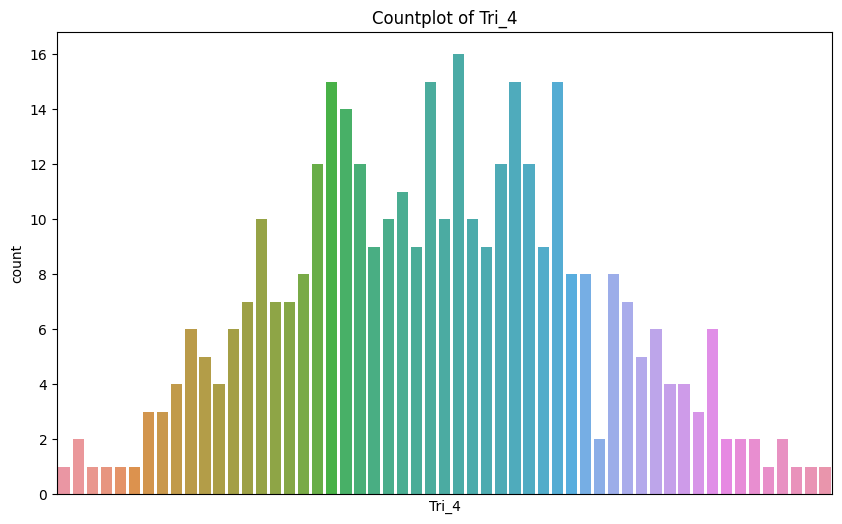

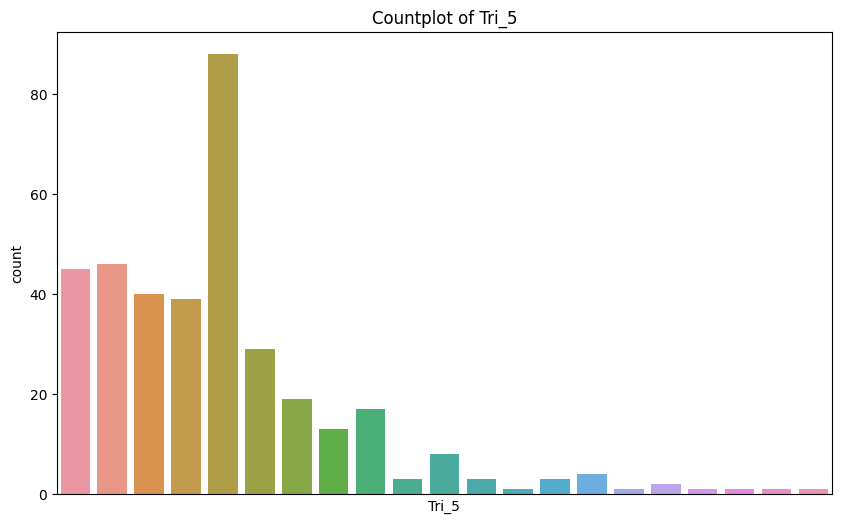

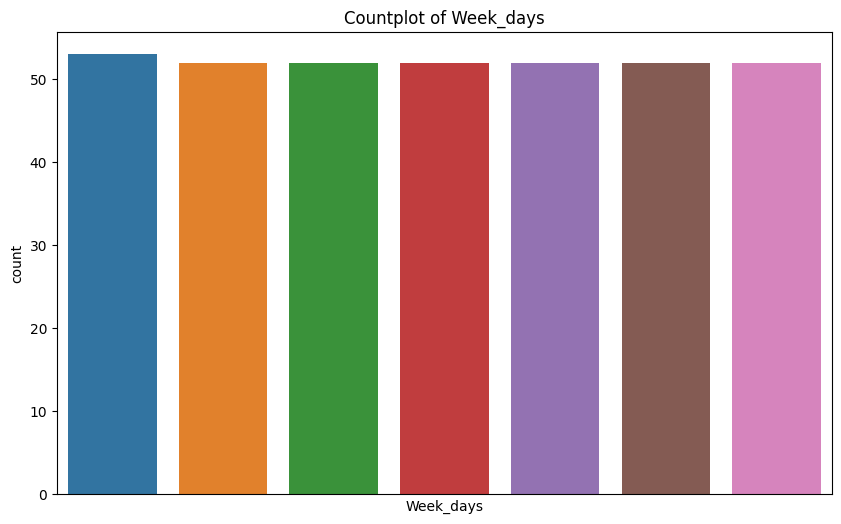

In [305]:
for column in rockingham_general_hospital.columns:
    plt.figure(figsize=(10, 6))  # optional: set the figure size
    sns.countplot(data=rockingham_general_hospital, x=column)  # Create a countplot
    plt.title(f'Countplot of {column}')
    plt.xticks([])  # Set the title of the plot
    plt.show()  # Show the plot

## Joondalup Health Campus

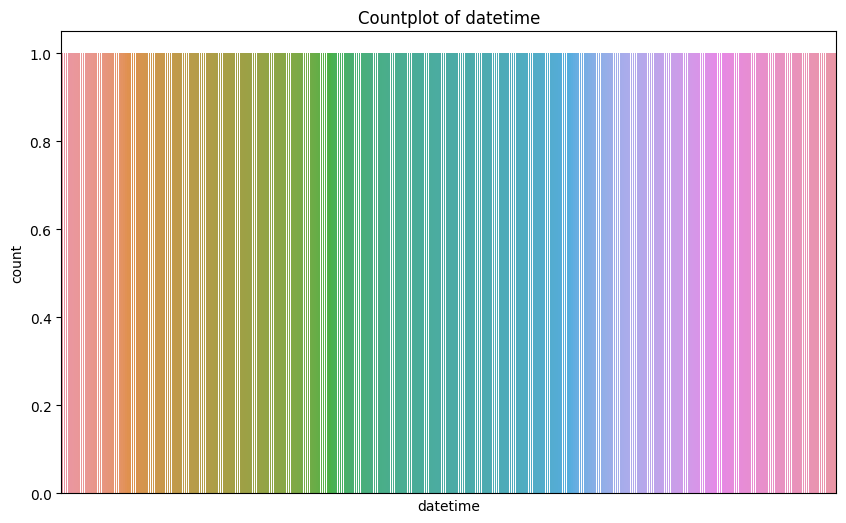

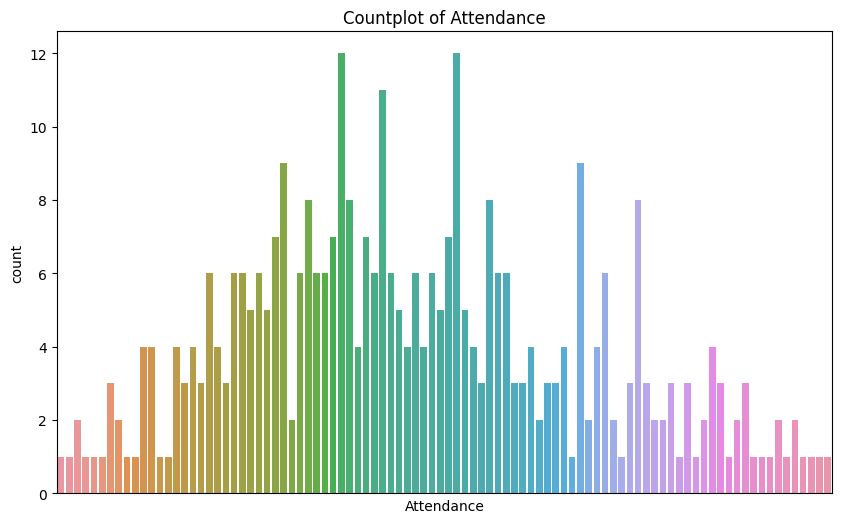

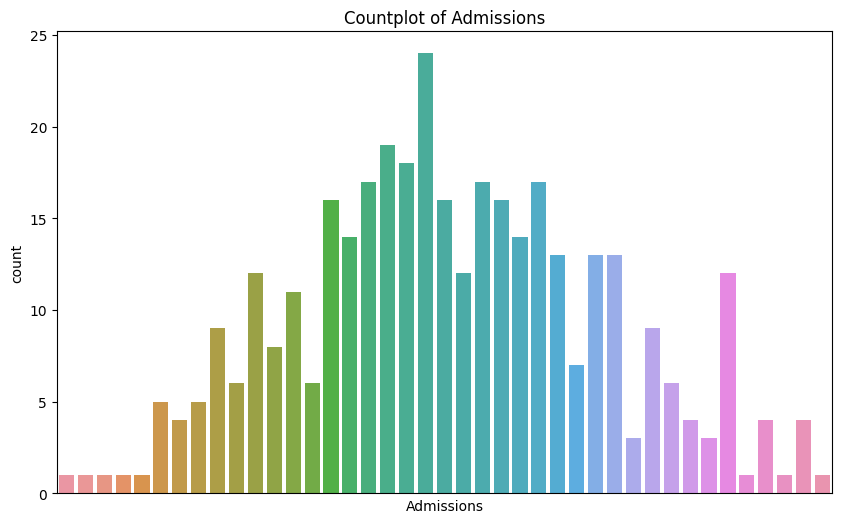

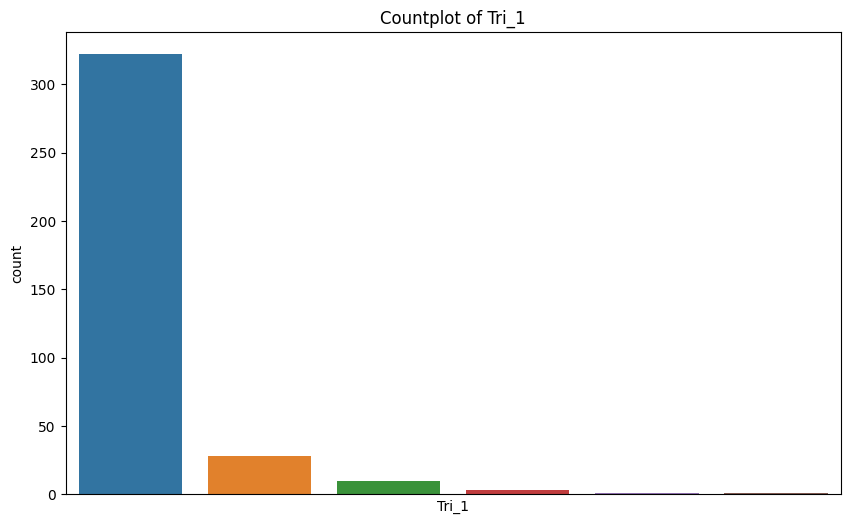

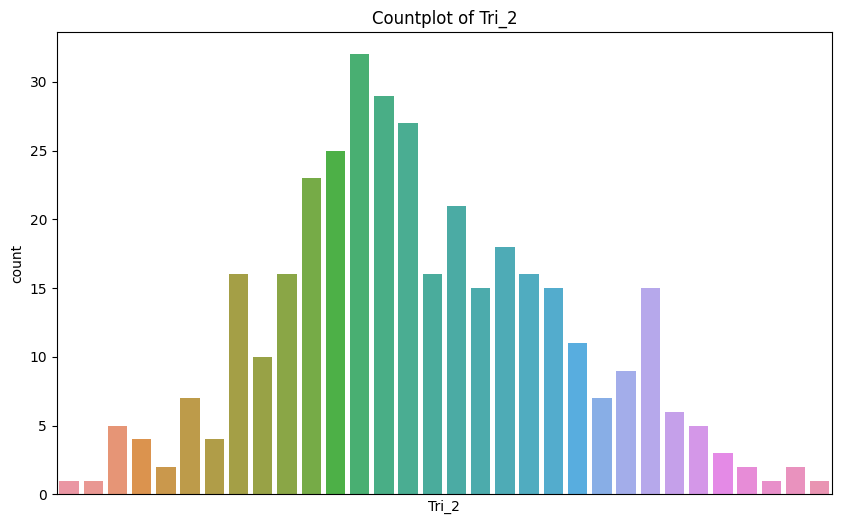

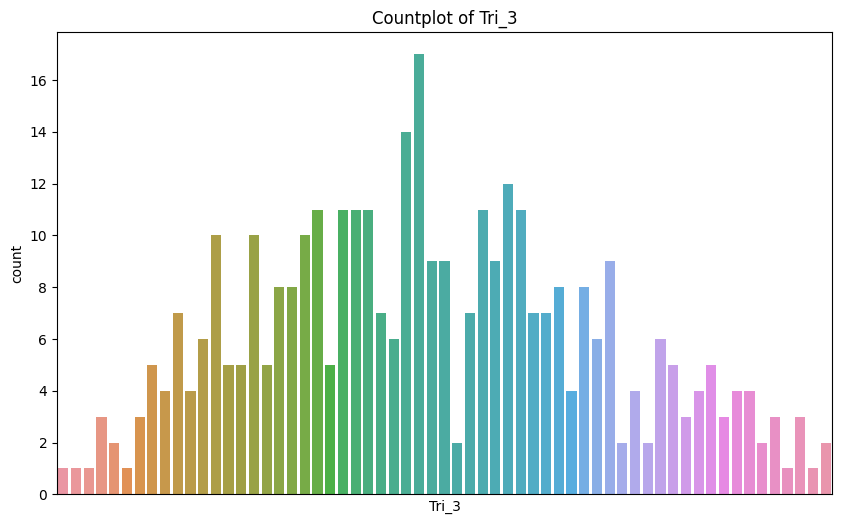

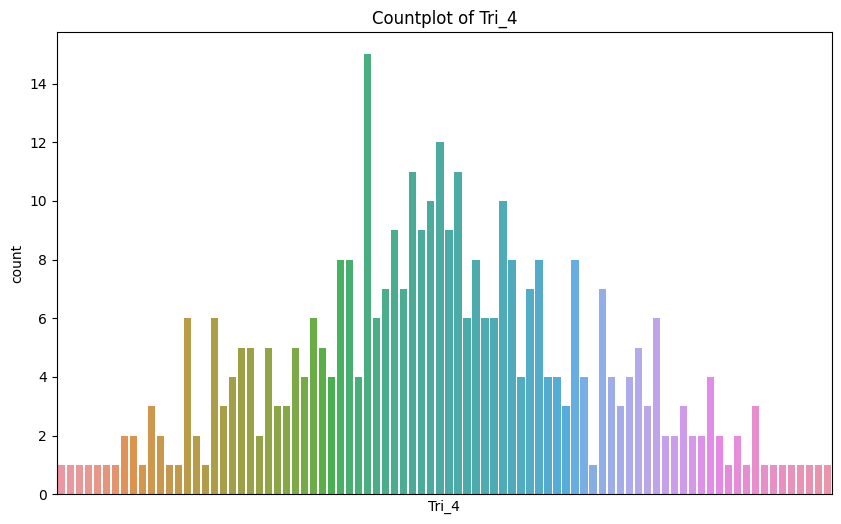

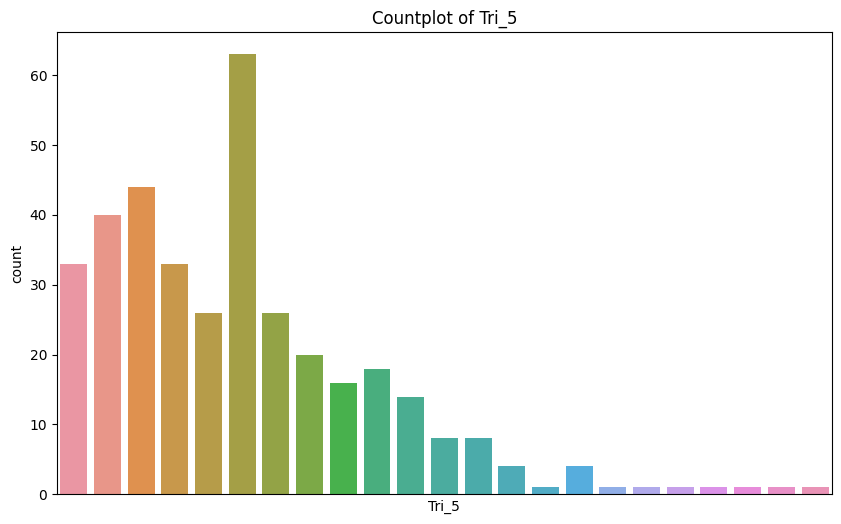

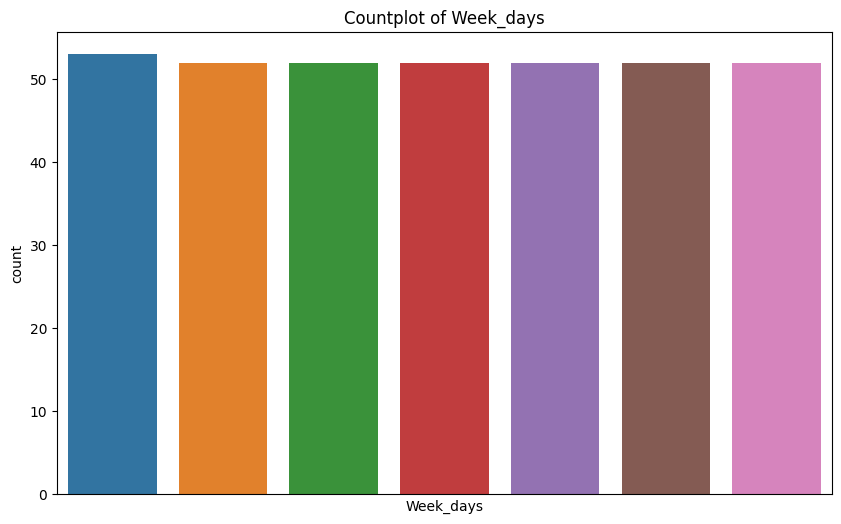

In [306]:
for column in Joondalup_health_campus.columns:
    plt.figure(figsize=(10, 6))  # optional: set the figure size
    sns.countplot(data=Joondalup_health_campus, x=column)  # Create a countplot
    plt.title(f'Countplot of {column}')
    plt.xticks([])  # Set the title of the plot
    plt.show()  # Show the plot

## Bi-variate Data

## Royal Perth Hospital

## Attendance vs Other Variables

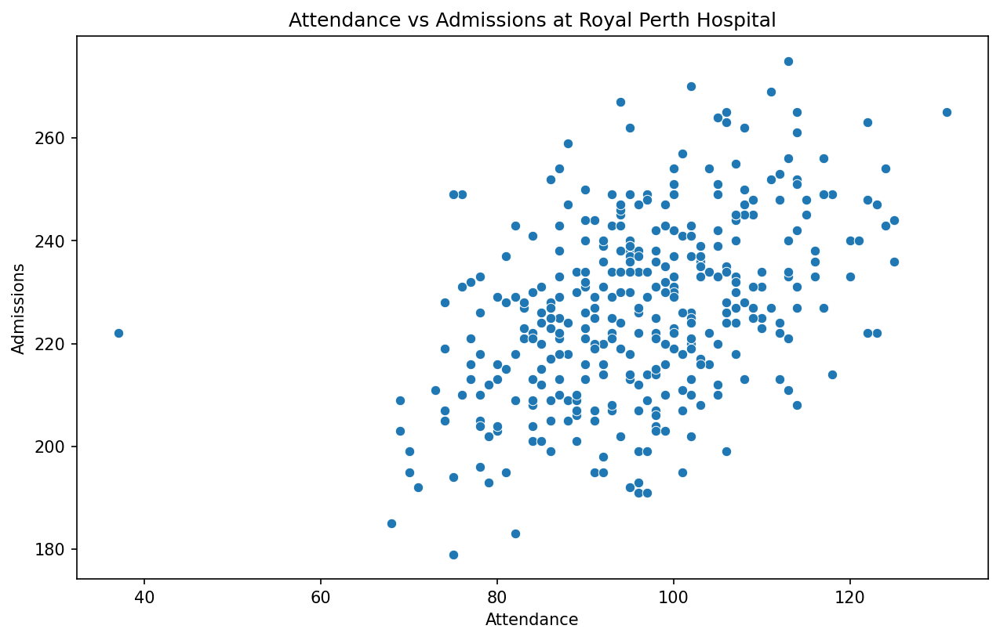

In [307]:
plt.figure(figsize=(10,6), dpi=150)
sns.scatterplot(x='Admissions', y='Attendance', data=royal_perth_hospital)
plt.title('Attendance vs Admissions at Royal Perth Hospital')
plt.xlabel('Attendance')
plt.ylabel('Admissions')
plt.show()

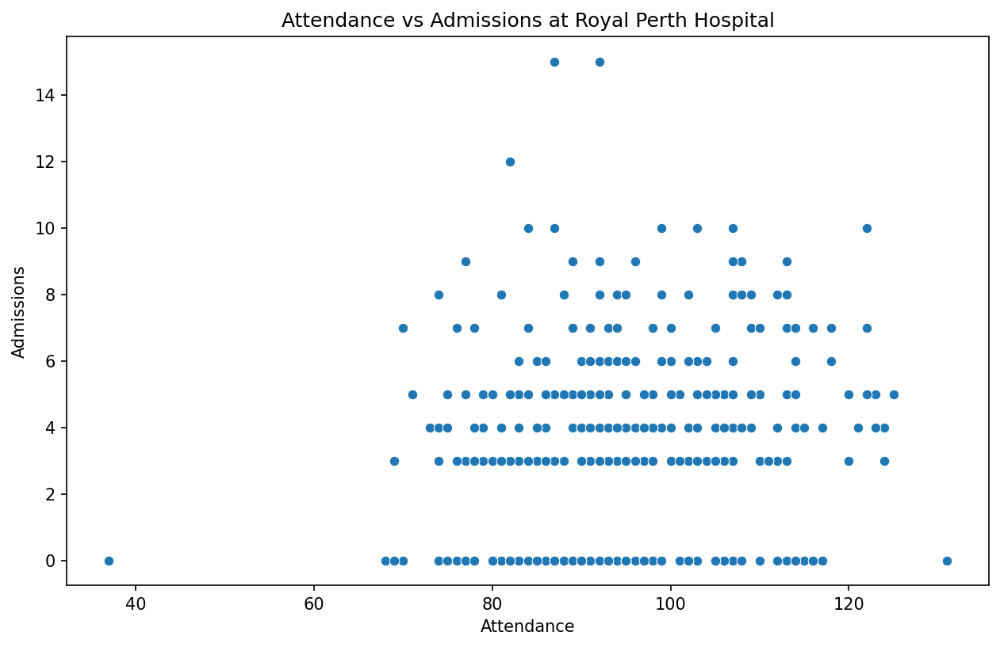

In [308]:
plt.figure(figsize=(10,6), dpi=150)
sns.scatterplot(x='Admissions', y='Tri_1', data=royal_perth_hospital)
plt.title('Attendance vs Admissions at Royal Perth Hospital')
plt.xlabel('Attendance')
plt.ylabel('Admissions')
plt.show()

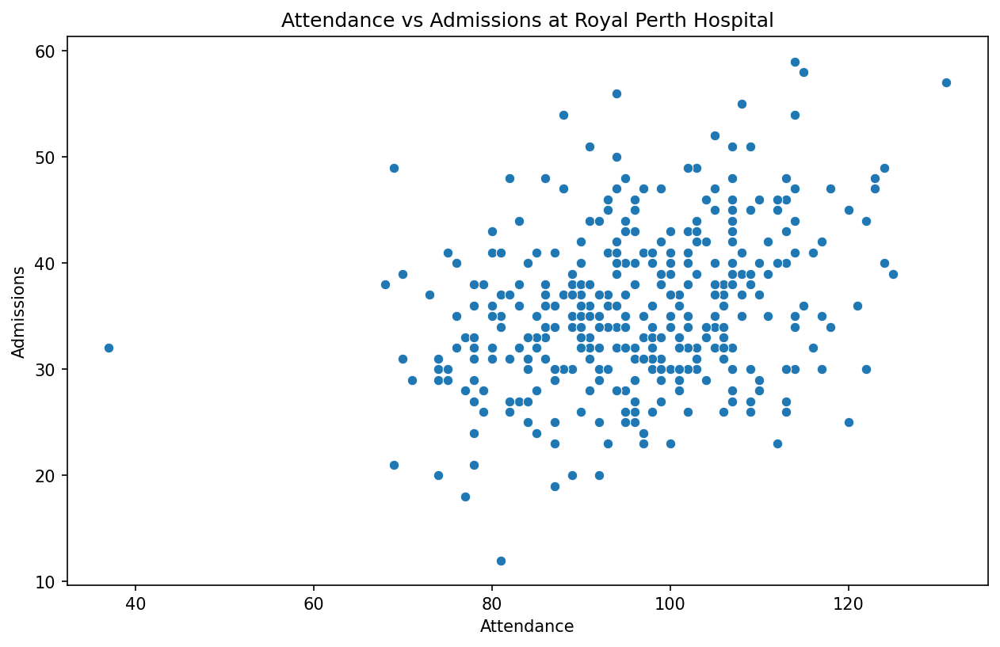

In [309]:
plt.figure(figsize=(10,6), dpi=150)
sns.scatterplot(x='Admissions', y='Tri_2', data=royal_perth_hospital)
plt.title('Attendance vs Admissions at Royal Perth Hospital')
plt.xlabel('Attendance')
plt.ylabel('Admissions')
plt.show()

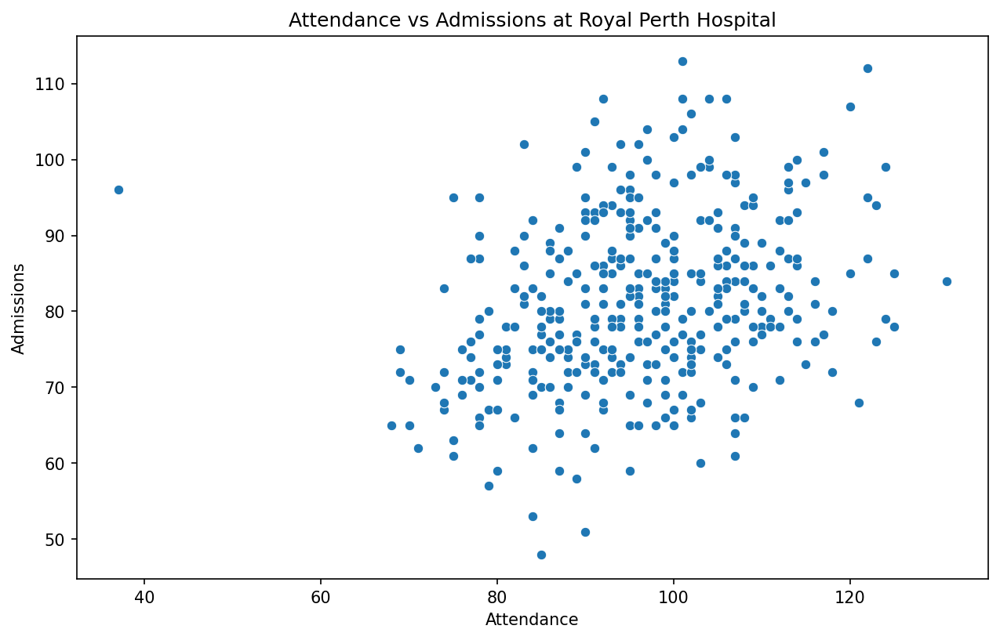

In [310]:
plt.figure(figsize=(10,6), dpi=150)
sns.scatterplot(x='Admissions', y='Tri_3', data=royal_perth_hospital)
plt.title('Attendance vs Admissions at Royal Perth Hospital')
plt.xlabel('Attendance')
plt.ylabel('Admissions')
plt.show()

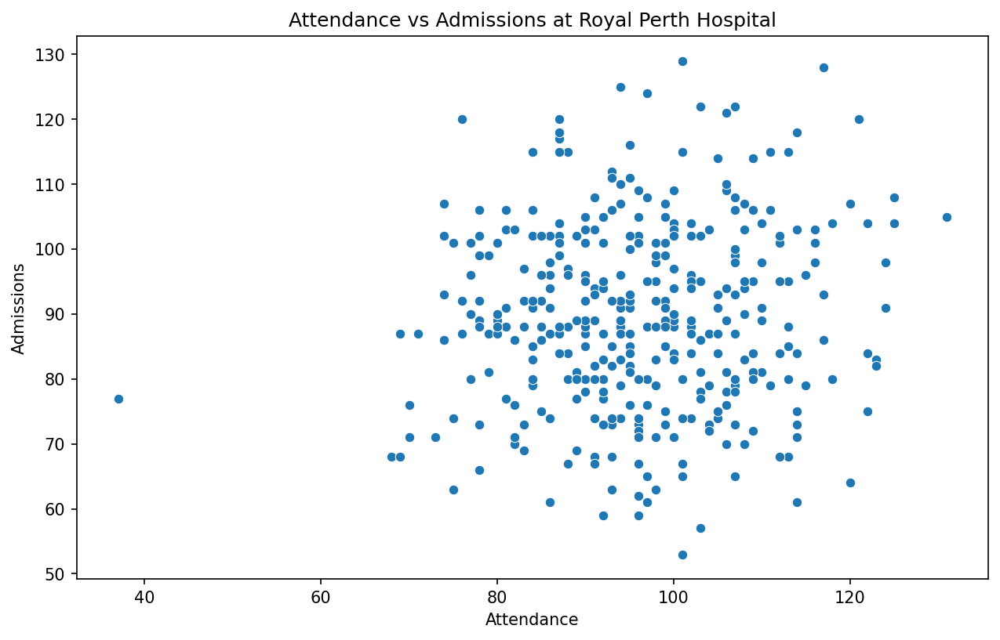

In [311]:
plt.figure(figsize=(10,6), dpi=150)
sns.scatterplot(x='Admissions', y='Tri_4', data=royal_perth_hospital)
plt.title('Attendance vs Admissions at Royal Perth Hospital')
plt.xlabel('Attendance')
plt.ylabel('Admissions')
plt.show()

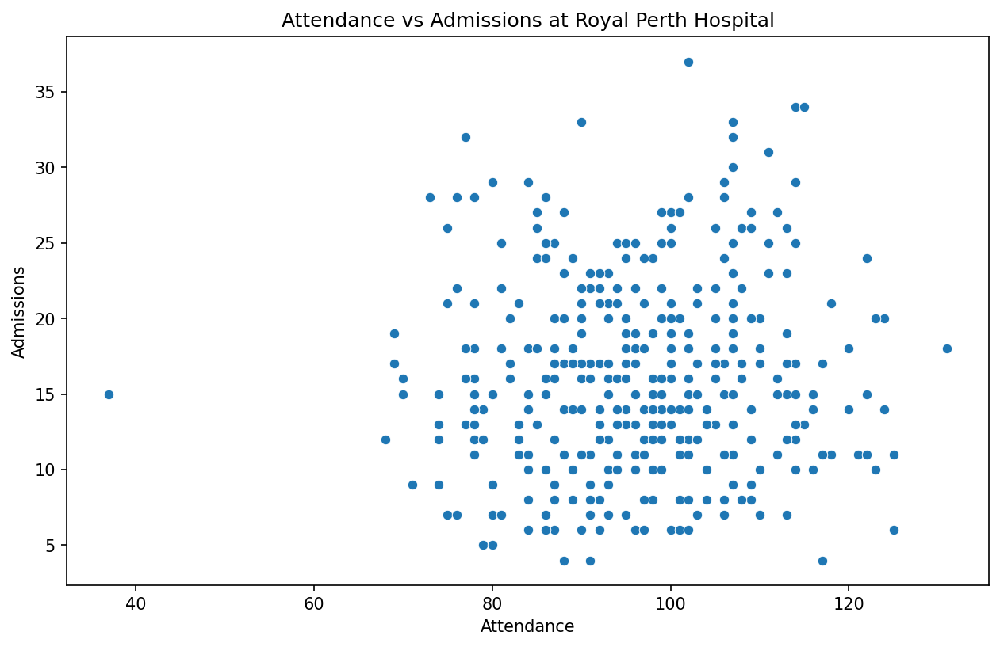

In [312]:
plt.figure(figsize=(10,6), dpi=150)
sns.scatterplot(x='Admissions', y='Tri_5', data=royal_perth_hospital)
plt.title('Attendance vs Admissions at Royal Perth Hospital')
plt.xlabel('Attendance')
plt.ylabel('Admissions')
plt.show()

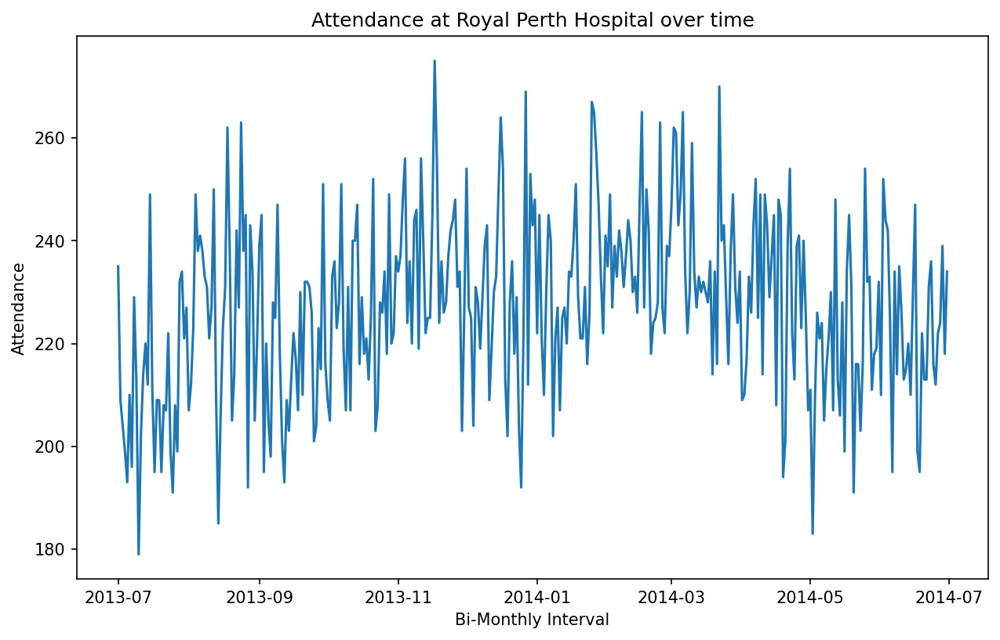

In [313]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=royal_perth_hospital)
plt.title('Attendance at Royal Perth Hospital over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

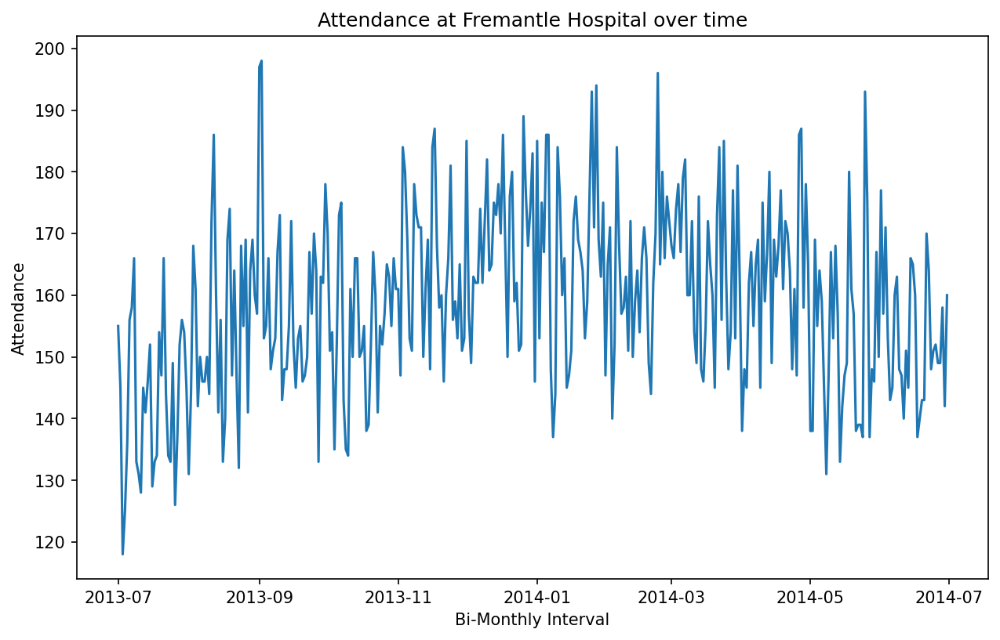

In [314]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=fremantle_hospital)
plt.title('Attendance at Fremantle Hospital over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

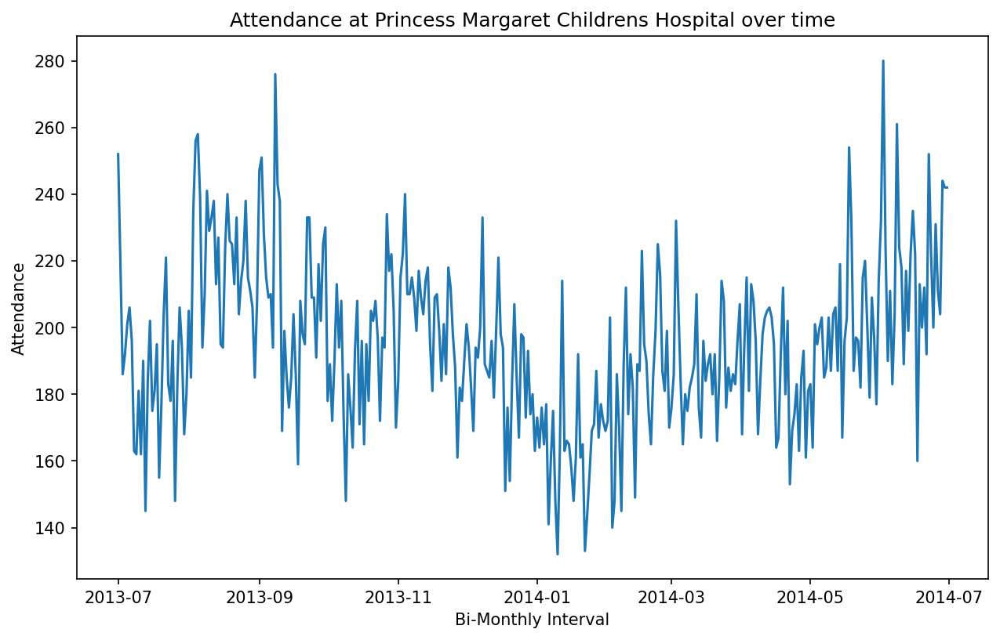

In [315]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=Princess_Marg_Child)
plt.title('Attendance at Princess Margaret Childrens Hospital over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

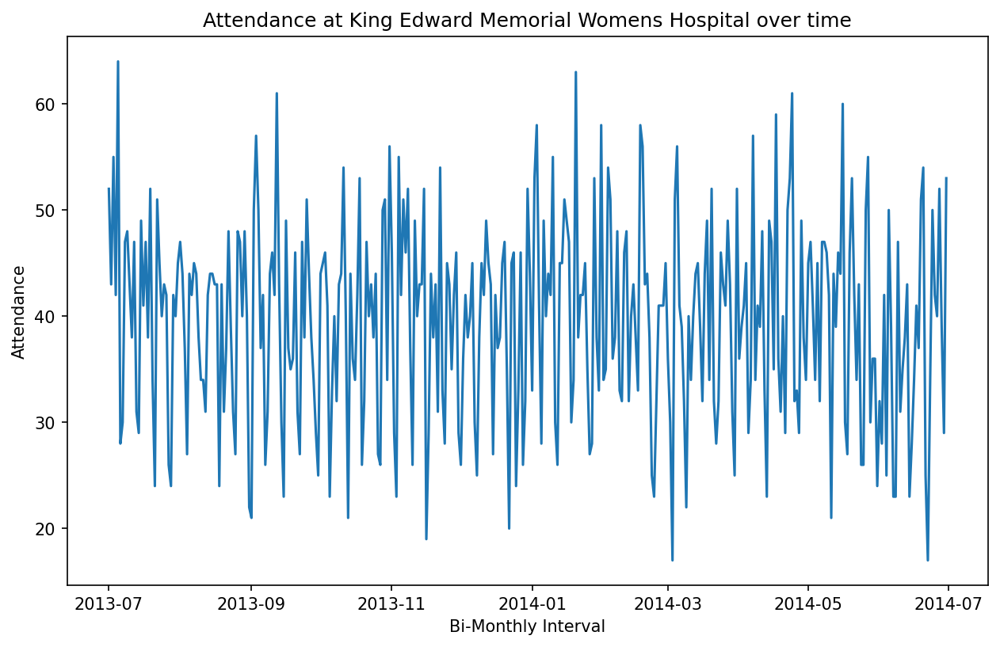

In [316]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=King_Ed_Memorial_Women)
plt.title('Attendance at King Edward Memorial Womens Hospital over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

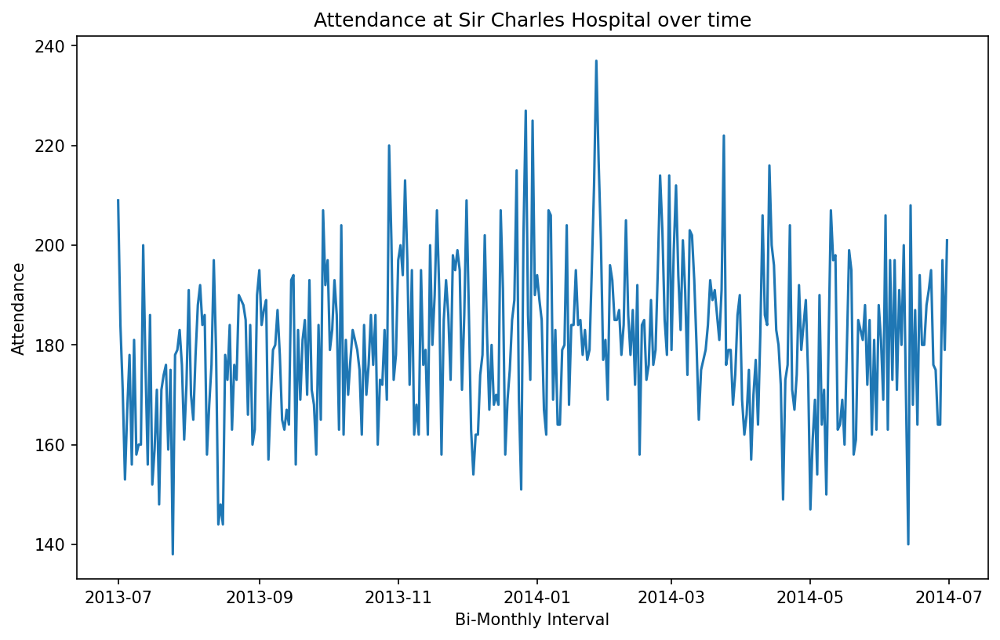

In [317]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=Sir_charles_hospital)
plt.title('Attendance at Sir Charles Hospital over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

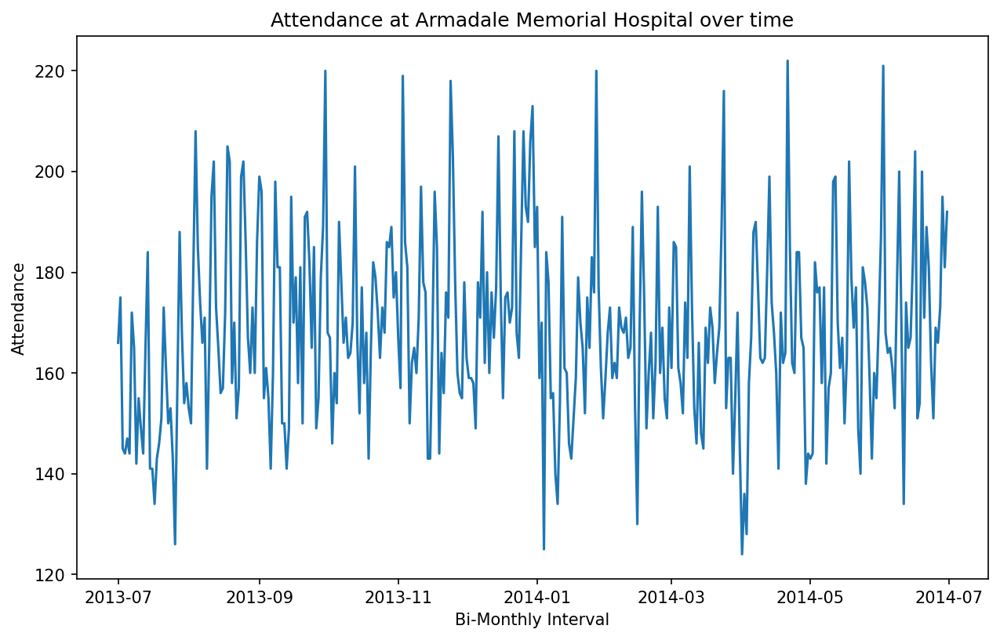

In [318]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=Armadale_memorial_hospital)
plt.title('Attendance at Armadale Memorial Hospital over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

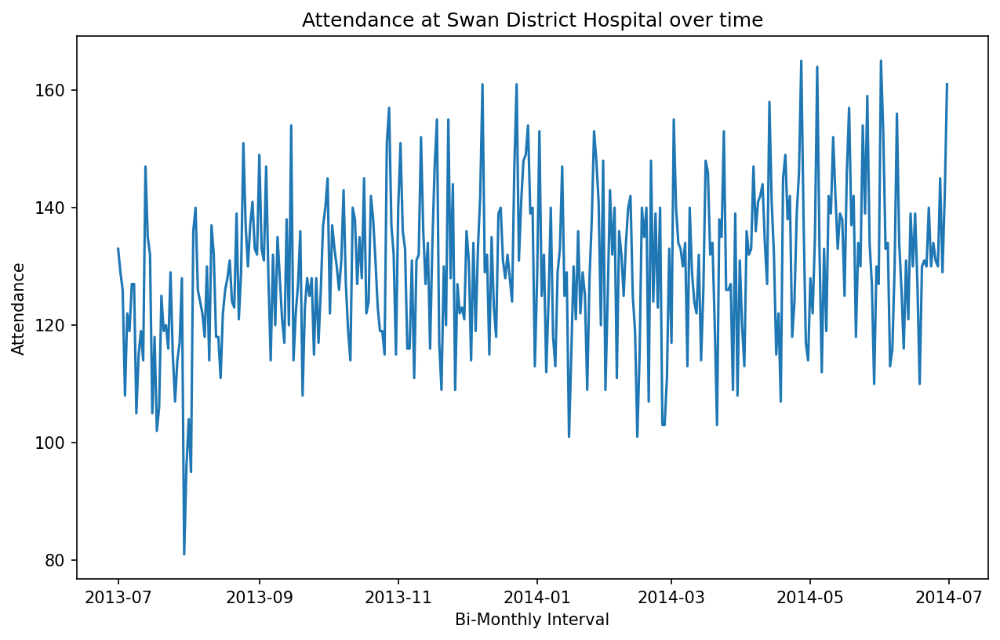

In [319]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=Swan_district_hospital)
plt.title('Attendance at Swan District Hospital over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

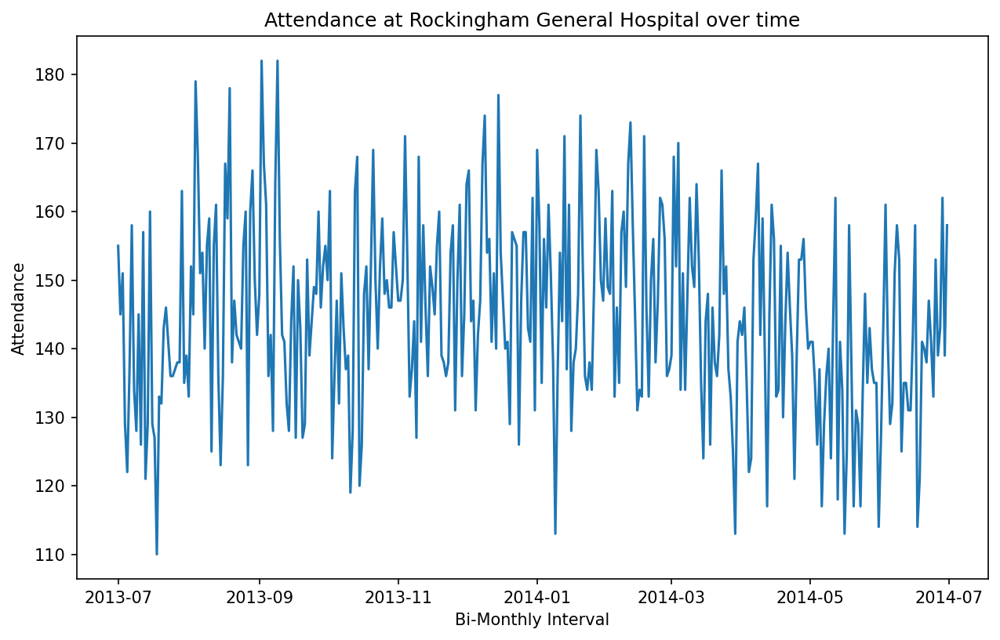

In [320]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=rockingham_general_hospital)
plt.title('Attendance at Rockingham General Hospital over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

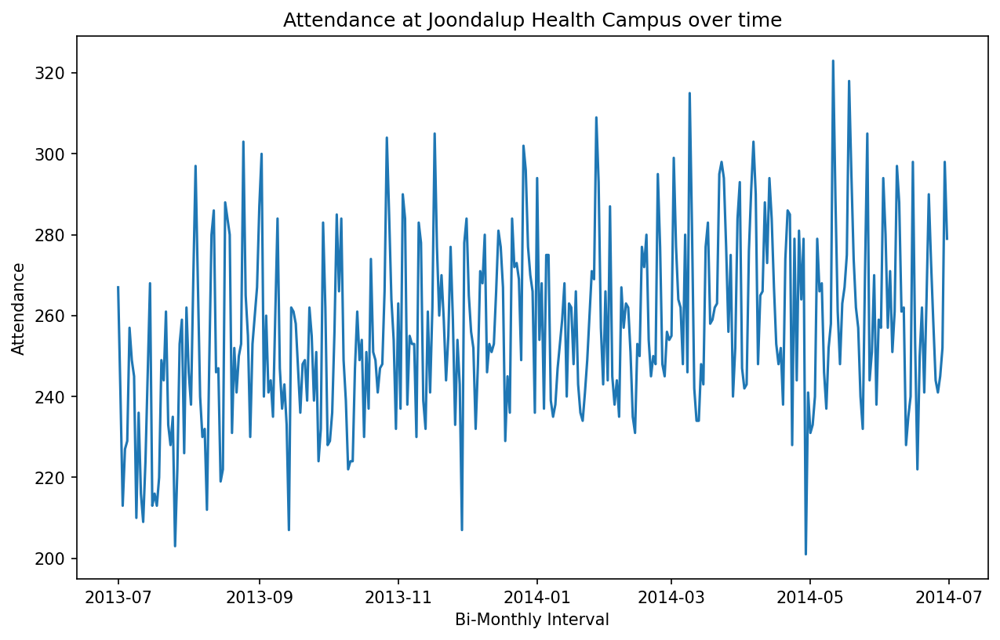

In [321]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='Attendance', data=Joondalup_health_campus)
plt.title('Attendance at Joondalup Health Campus over time')
plt.xlabel('Bi-Monthly Interval')
plt.ylabel('Attendance')
plt.show()

Attendance vs Weekday

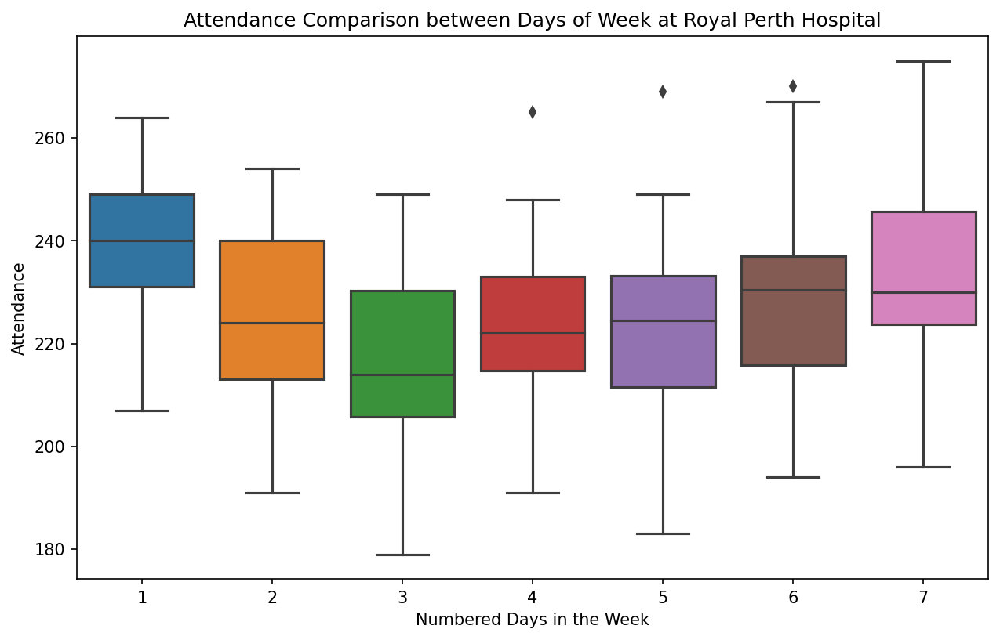

In [322]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=royal_perth_hospital, x="Week_days", y="Attendance")
plt.title('Attendance Comparison between Days of Week at Royal Perth Hospital')
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

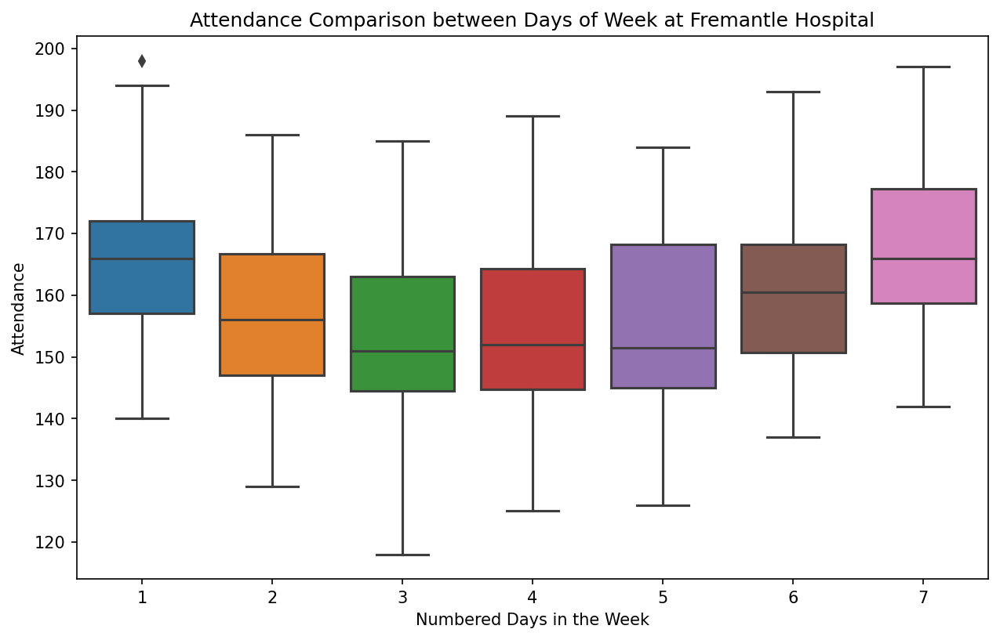

In [323]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=fremantle_hospital, x="Week_days", y="Attendance")
plt.title('Attendance Comparison between Days of Week at Fremantle Hospital')
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

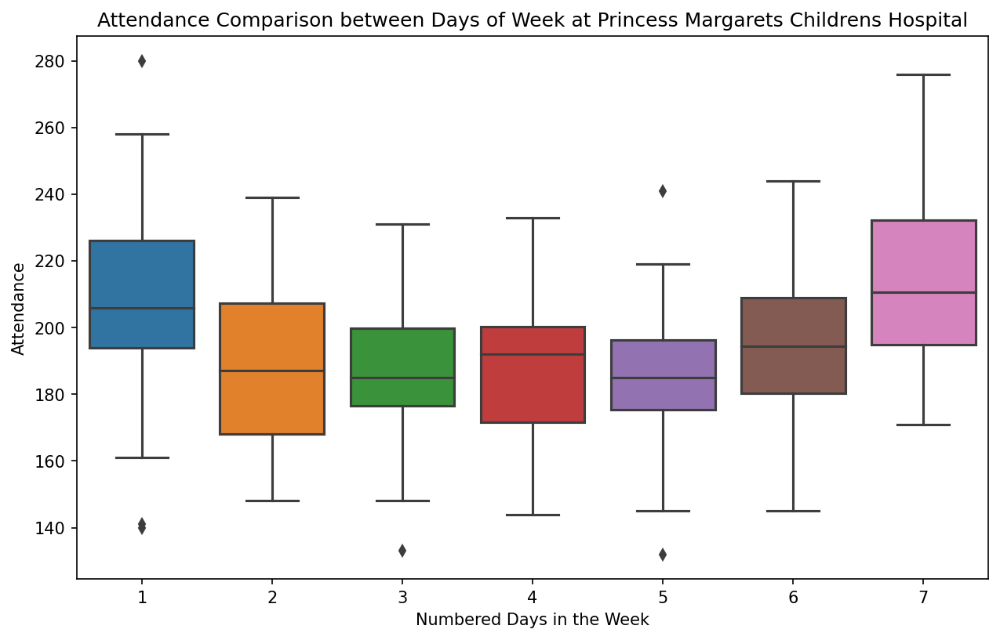

In [324]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=Princess_Marg_Child, x="Week_days", y="Attendance")
plt.title('Attendance Comparison between Days of Week at Princess Margarets Childrens Hospital')
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

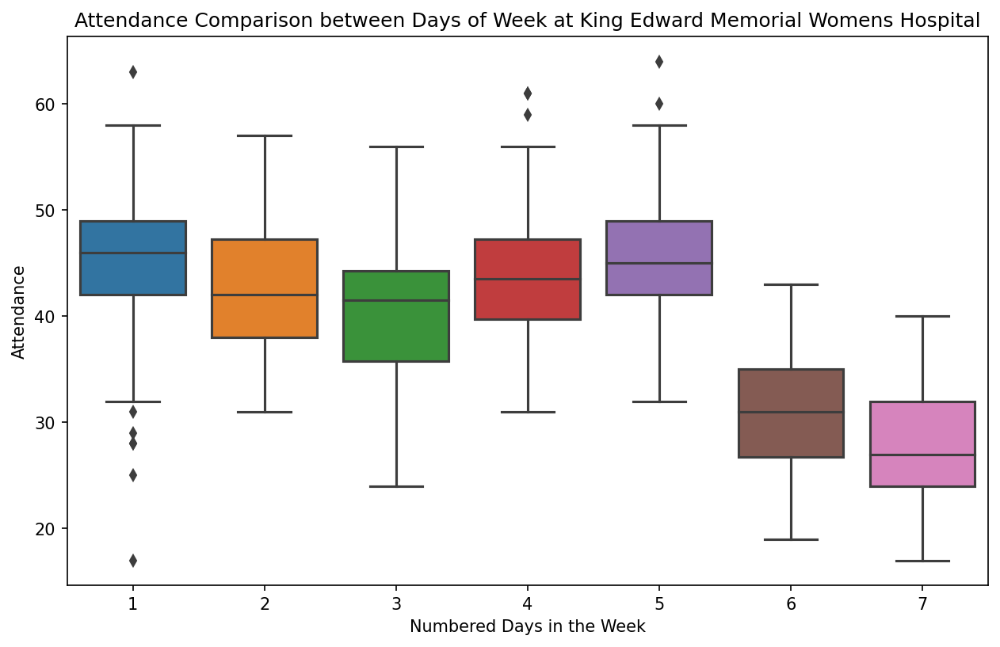

In [325]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=King_Ed_Memorial_Women, x="Week_days", y="Attendance")
plt.title('Attendance Comparison between Days of Week at King Edward Memorial Womens Hospital')
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

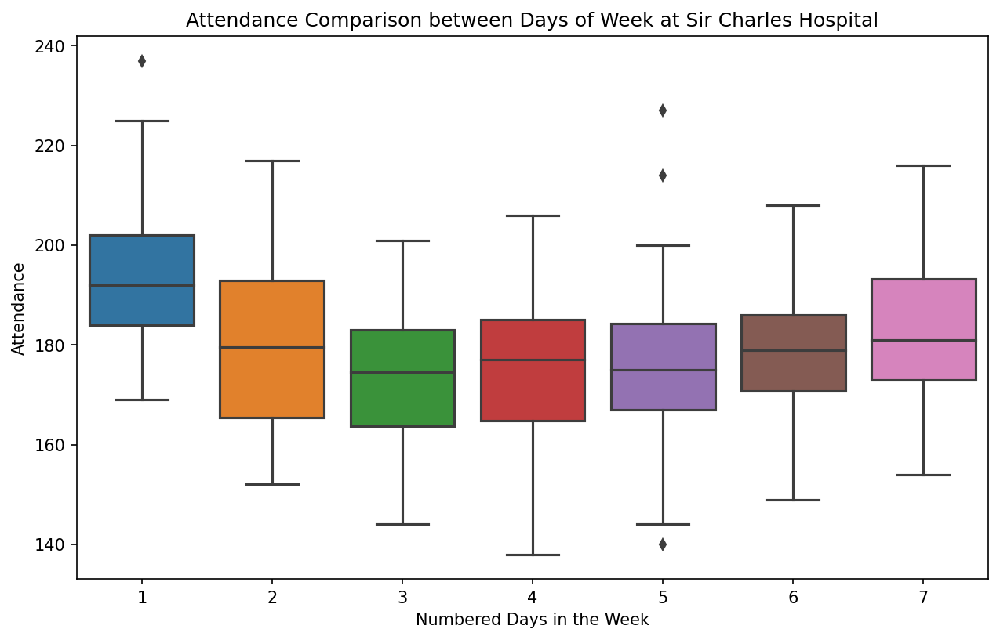

In [326]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=Sir_charles_hospital, x="Week_days", y="Attendance")
plt.title('Attendance Comparison between Days of Week at Sir Charles Hospital')
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

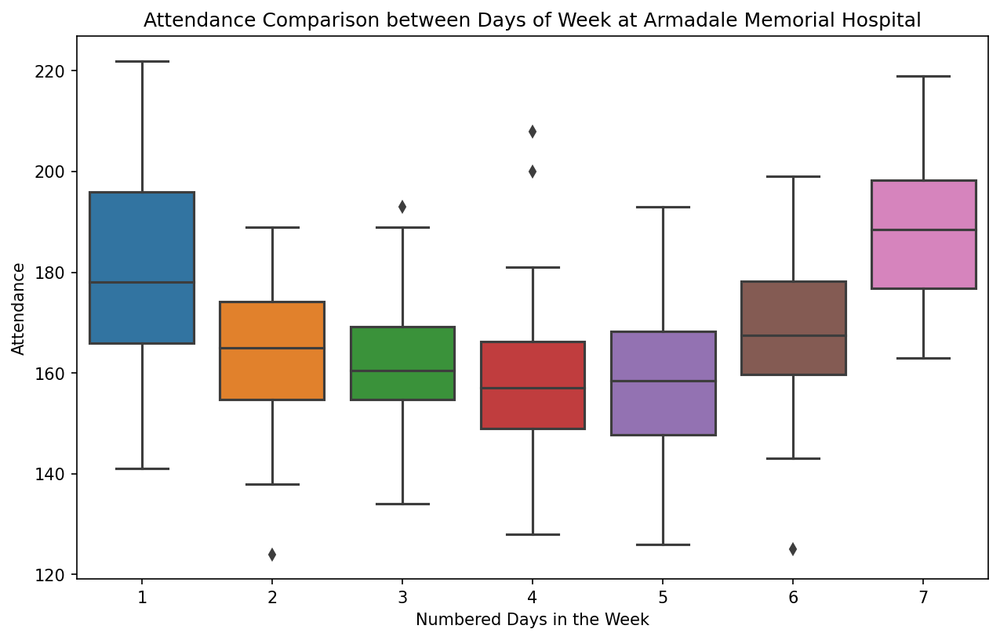

In [327]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=Armadale_memorial_hospital, x="Week_days", y="Attendance")
plt.title("Attendance Comparison between Days of Week at Armadale Memorial Hospital")
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

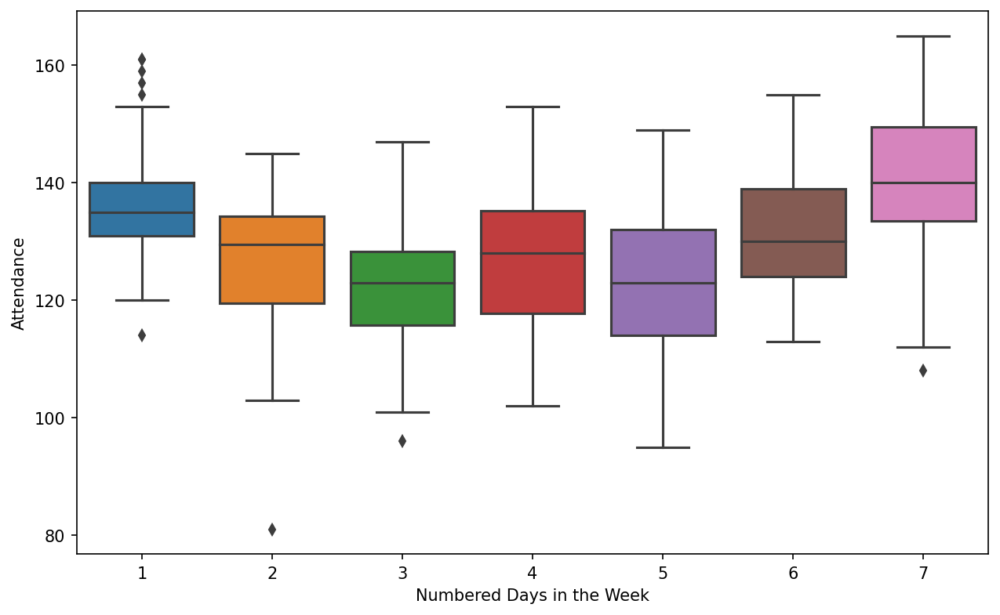

In [328]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=Swan_district_hospital, x="Week_days", y="Attendance")
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

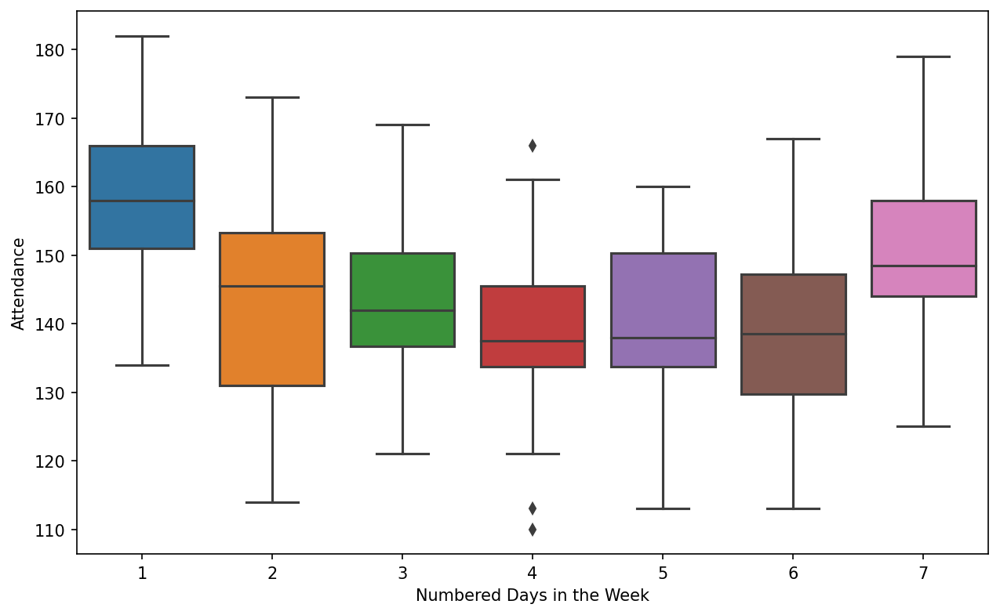

In [329]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=rockingham_general_hospital, x="Week_days", y="Attendance")
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

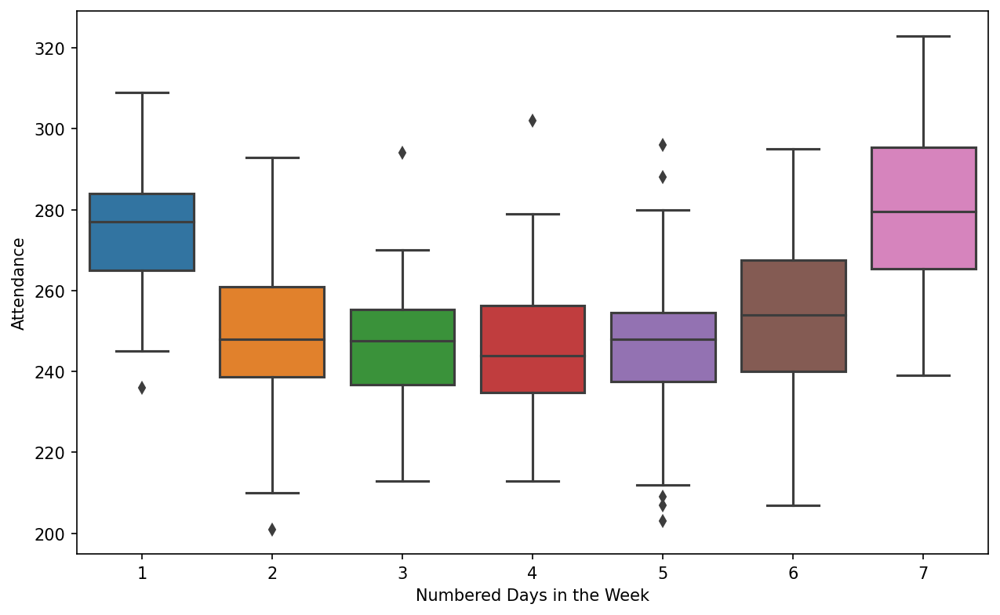

In [330]:
plt.figure(figsize=(10,6),dpi=150)
sns.boxplot(data=Joondalup_health_campus, x="Week_days", y="Attendance")
plt.xlabel("Numbered Days in the Week")
plt.ylabel('Attendance')
plt.show()

## Statistical Analysis

## Checking Distributions

### Descriptive Statistics (again)

In [331]:
for column in royal_perth_hospital:
  print(royal_perth_hospital[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count         365.0
mean     227.019178
std       17.276585
min           179.0
25%           215.0
50%           227.0
75%           239.0
max           275.0
Name: Attendance, dtype: Float64
count        365.0
mean     96.235616
std      12.514139
min           37.0
25%           88.0
50%           96.0
75%          105.0
max          131.0
Name: Admissions, dtype: Float64
count       365.0
mean     3.939726
std      2.743961
min           0.0
25%           3.0
50%           4.0
75%           5.0
max          15.0
Name: Tri_1, dtype: Float64
count        365.0
mean     35.646575
std       7.346489
min           12.0
25%           30.0
50%           35.0
75%           40.0
max           59.0
Name: Tri_2, dtype: Float64
count        365.0
mean          81.2
std      11.389025
min

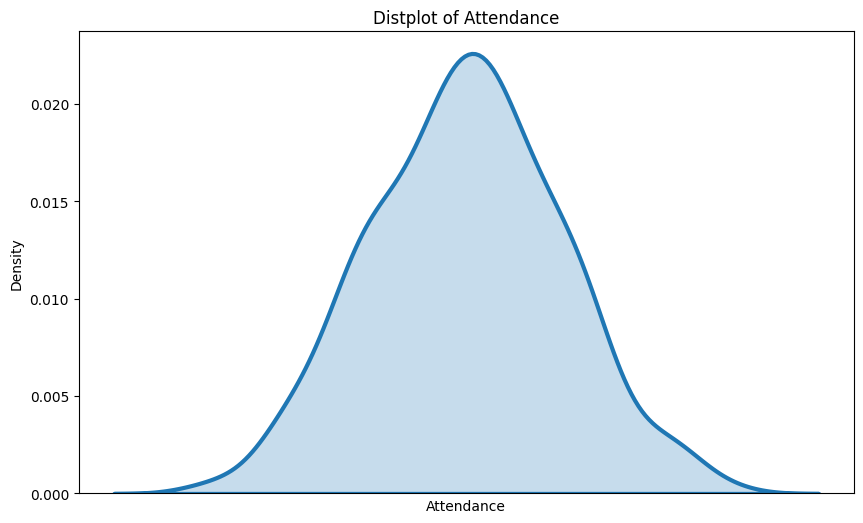

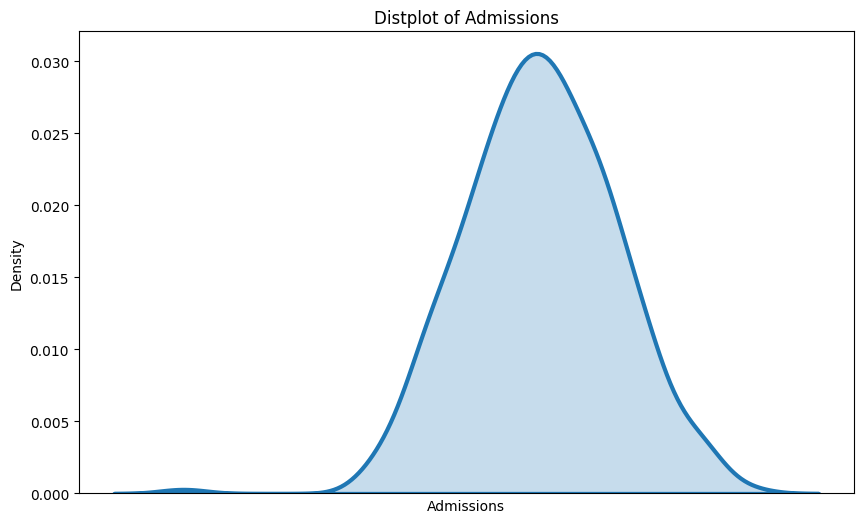

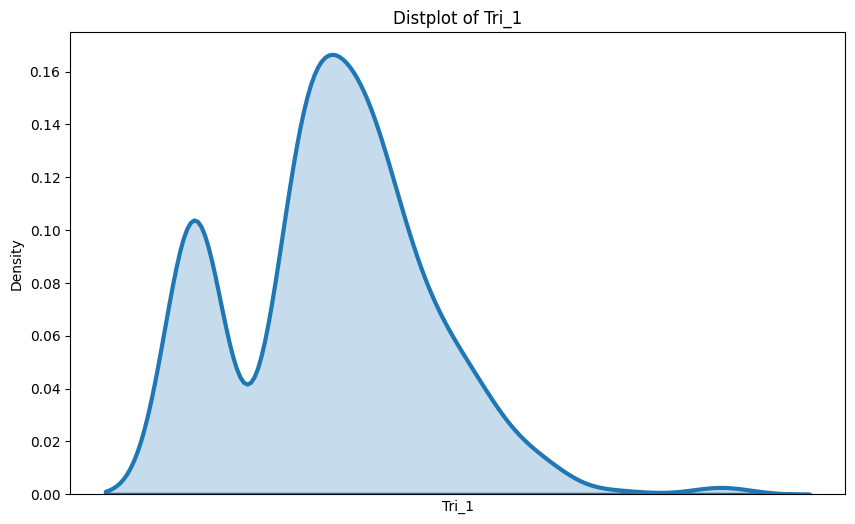

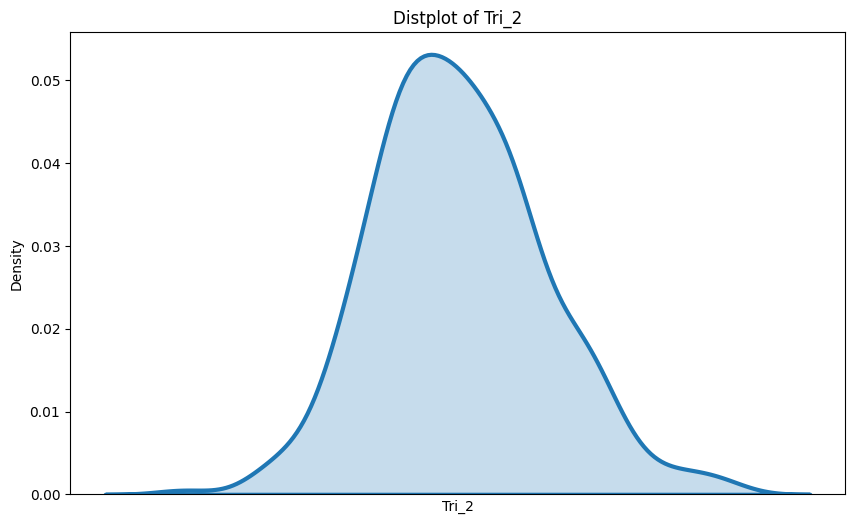

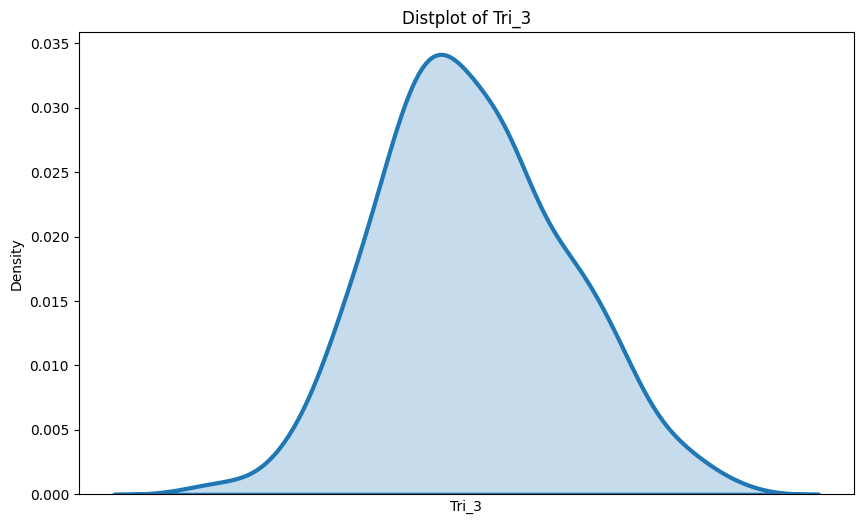

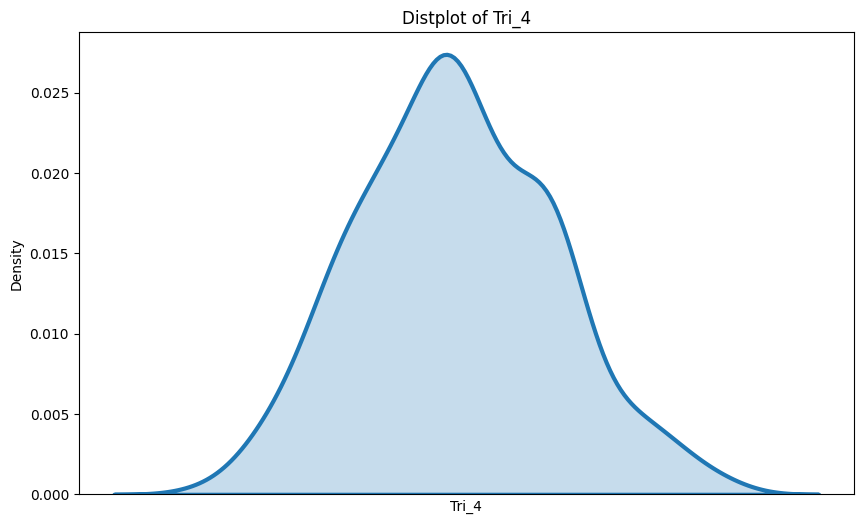

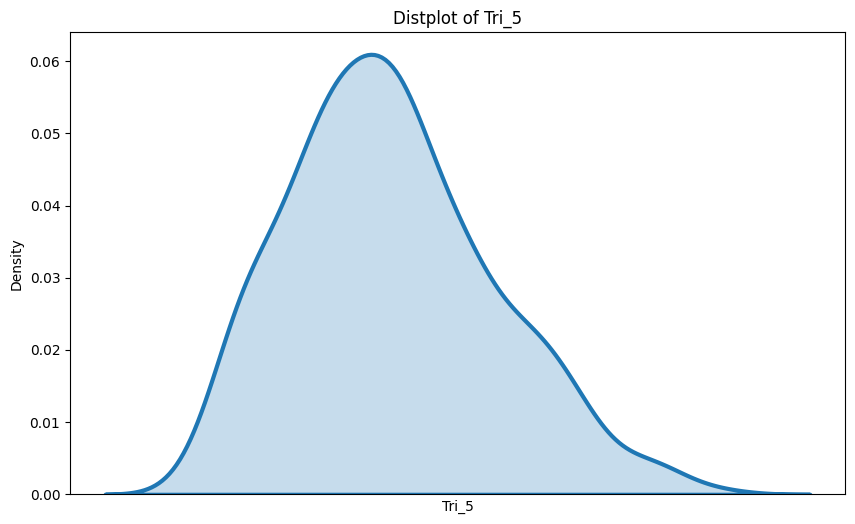

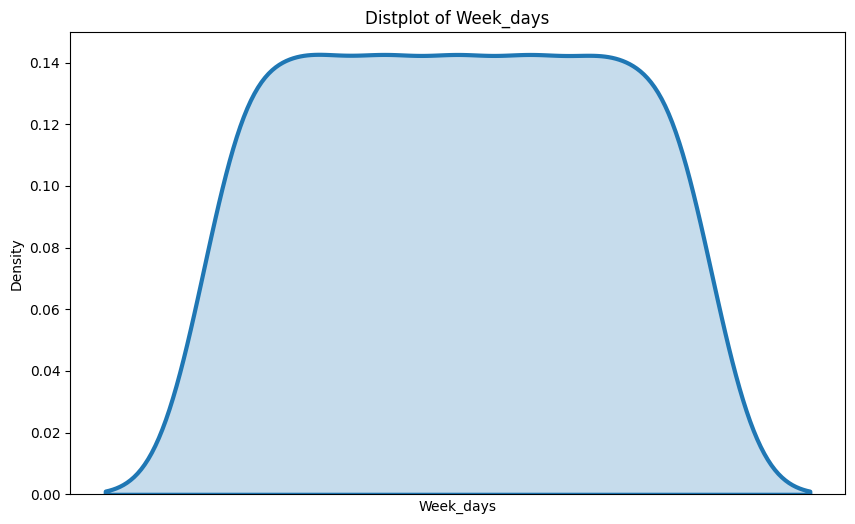

In [332]:
for column in royal_perth_hospital.columns:
    if pd.api.types.is_datetime64_any_dtype(royal_perth_hospital[column]):
        continue  # Skip this iteration if the column is datetime
    plt.figure(figsize=(10, 6))
    sns.distplot(royal_perth_hospital[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

In [333]:
for column in fremantle_hospital:
  print(fremantle_hospital[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count         365.0
mean     158.868493
std       14.617249
min           118.0
25%           148.0
50%           159.0
75%           169.0
max           198.0
Name: Attendance, dtype: Float64
count        365.0
mean     65.216438
std       8.069053
min           43.0
25%           59.0
50%           65.0
75%           71.0
max           89.0
Name: Admissions, dtype: Float64
count       365.0
mean     0.734247
std      1.449917
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           7.0
Name: Tri_1, dtype: Float64
count        365.0
mean     27.747945
std       5.666756
min           15.0
25%           24.0
50%           27.0
75%           31.0
max           45.0
Name: Tri_2, dtype: Float64
count        365.0
mean     57.657534
std       8.664407
min

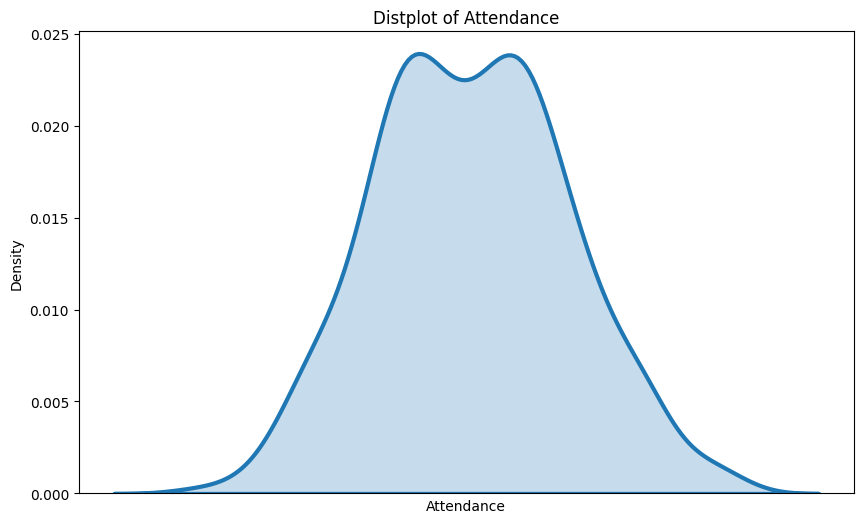

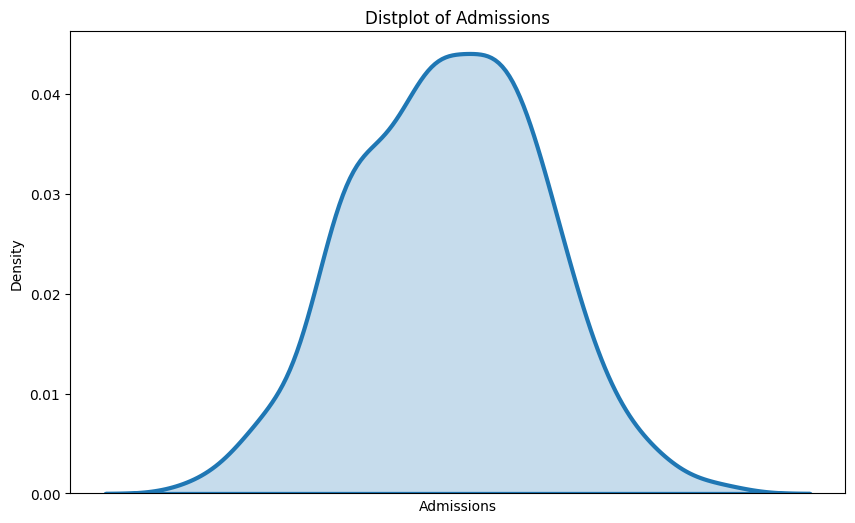

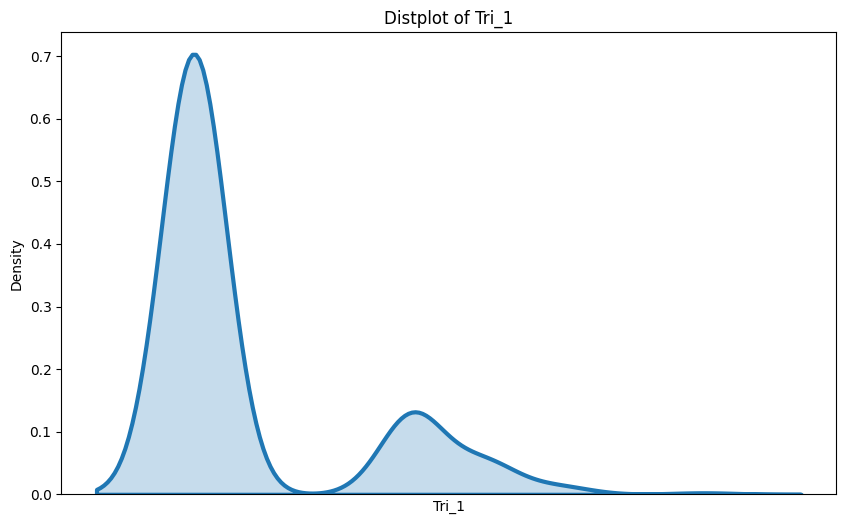

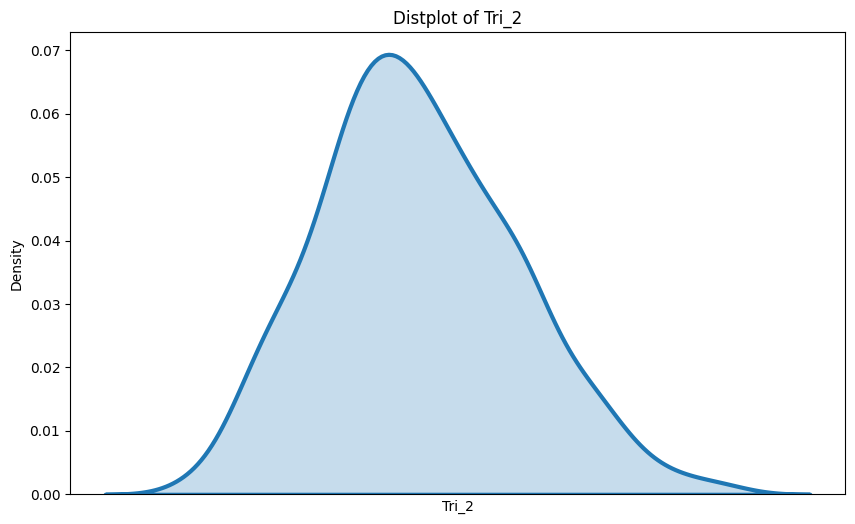

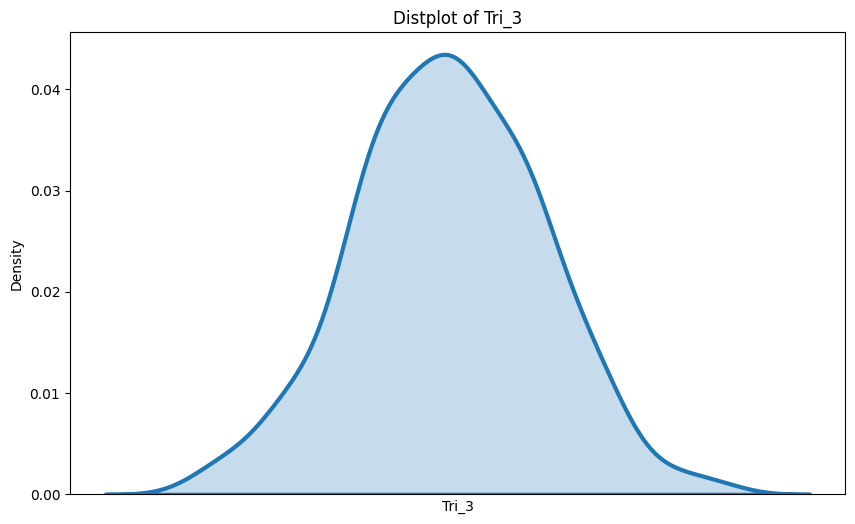

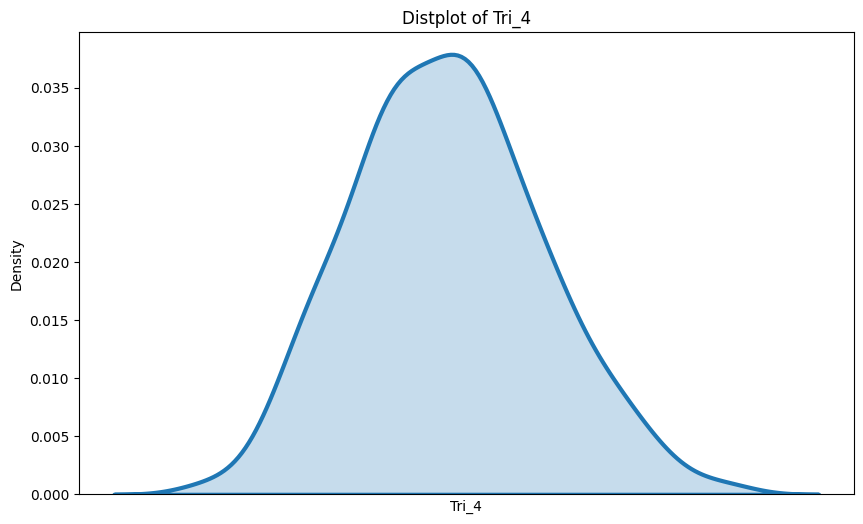

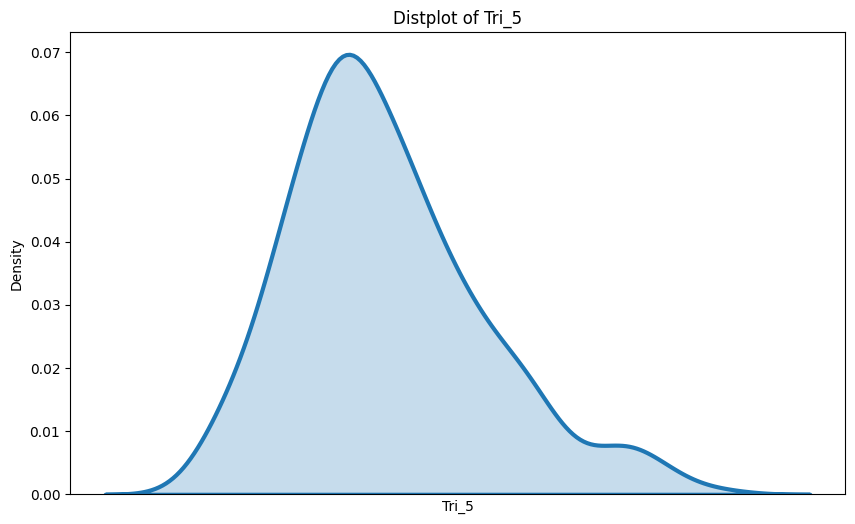

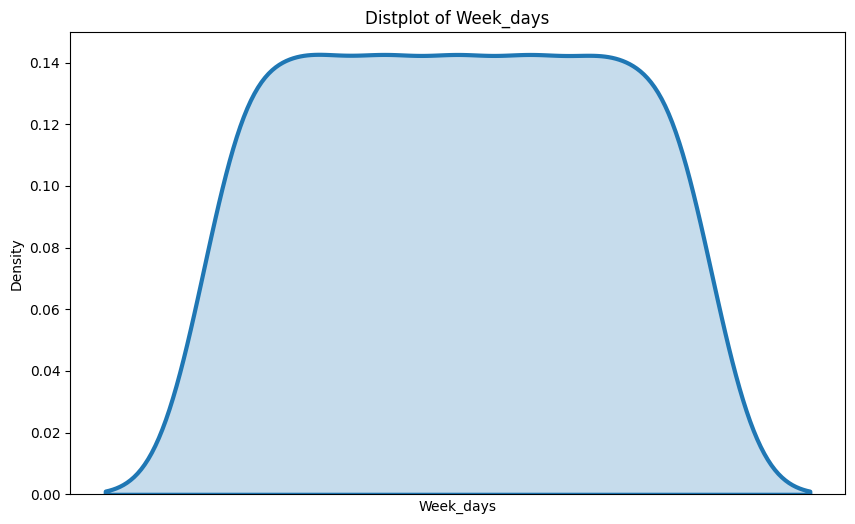

In [334]:
for column in fremantle_hospital.columns:
    if pd.api.types.is_datetime64_any_dtype(fremantle_hospital[column]):
        continue  # Skip this iteration if the column is datetime
    plt.figure(figsize=(10, 6))
    sns.distplot(fremantle_hospital[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

In [335]:
for column in Sir_charles_hospital:
  print(Sir_charles_hospital[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count         365.0
mean     180.468493
std       15.758557
min           138.0
25%           169.0
50%           180.0
75%           190.0
max           237.0
Name: Attendance, dtype: Float64
count         365.0
mean     107.945205
std       14.869663
min            65.0
25%            99.0
50%           107.0
75%           117.0
max           150.0
Name: Admissions, dtype: Float64
count       365.0
mean     2.145205
std      2.268577
min           0.0
25%           0.0
50%           3.0
75%           4.0
max           9.0
Name: Tri_1, dtype: Float64
count        365.0
mean     43.057534
std       7.413196
min           23.0
25%           38.0
50%           42.0
75%           48.0
max           64.0
Name: Tri_2, dtype: Float64
count        365.0
mean     84.041096
std      11.96

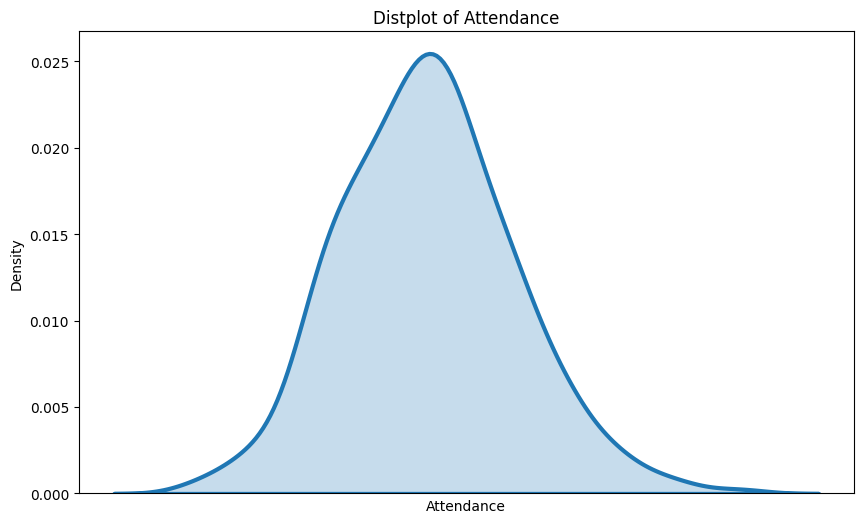

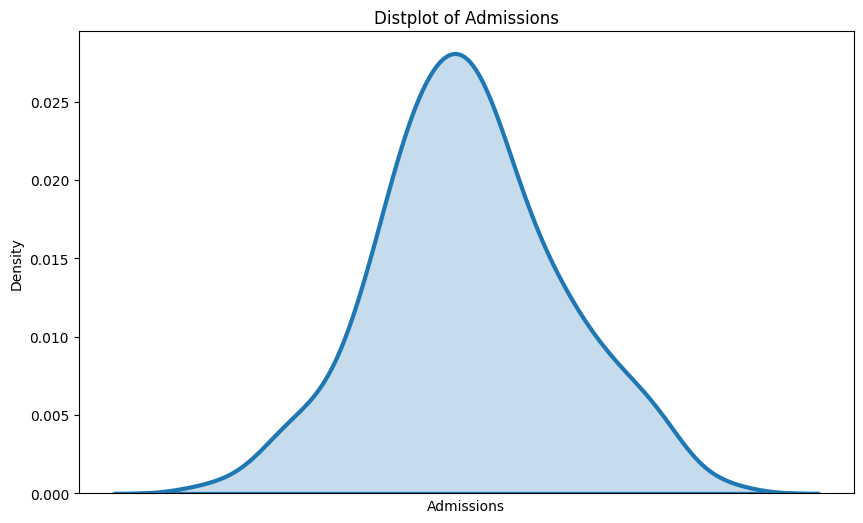

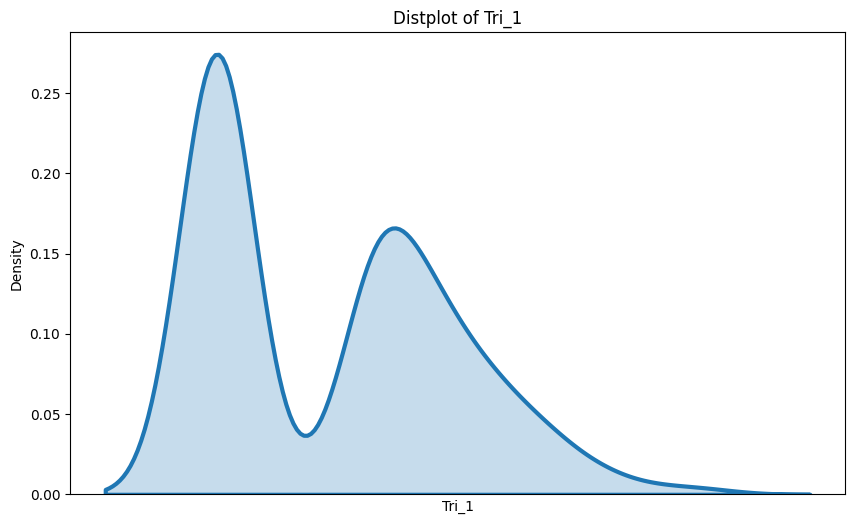

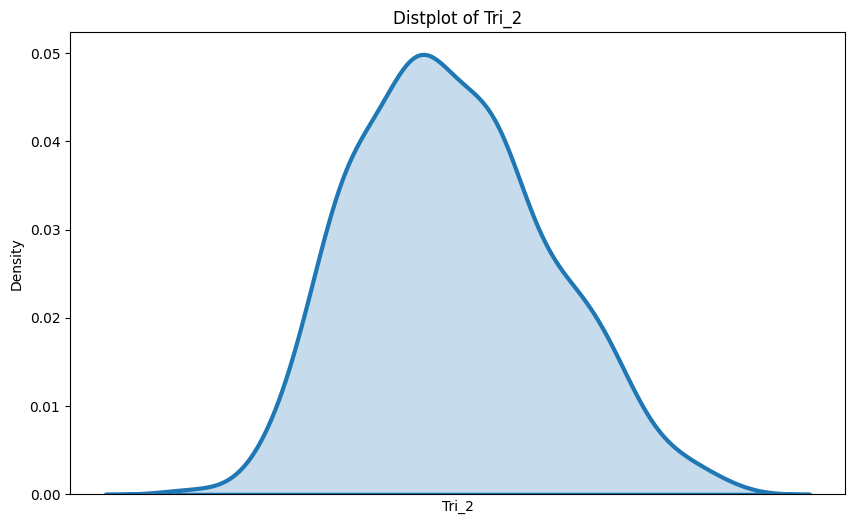

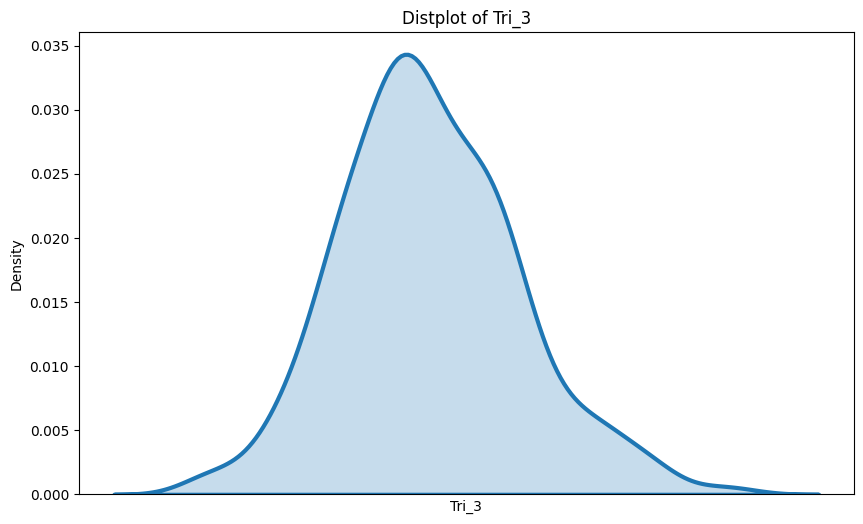

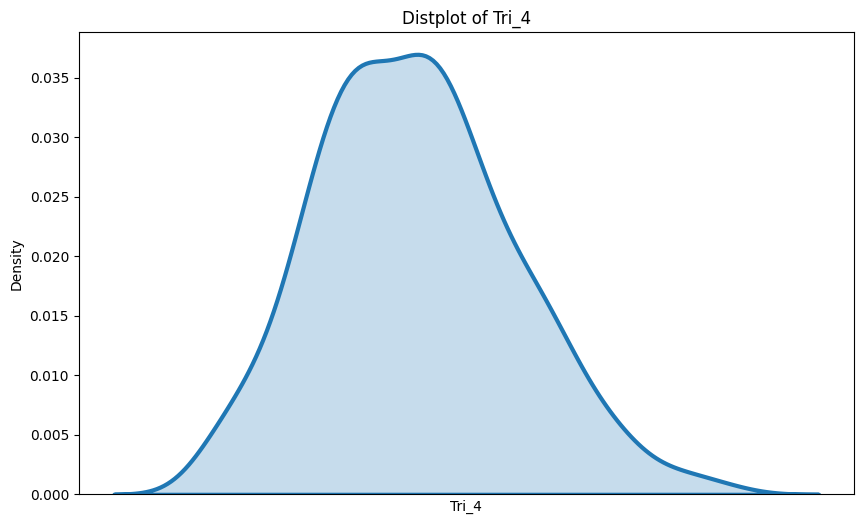

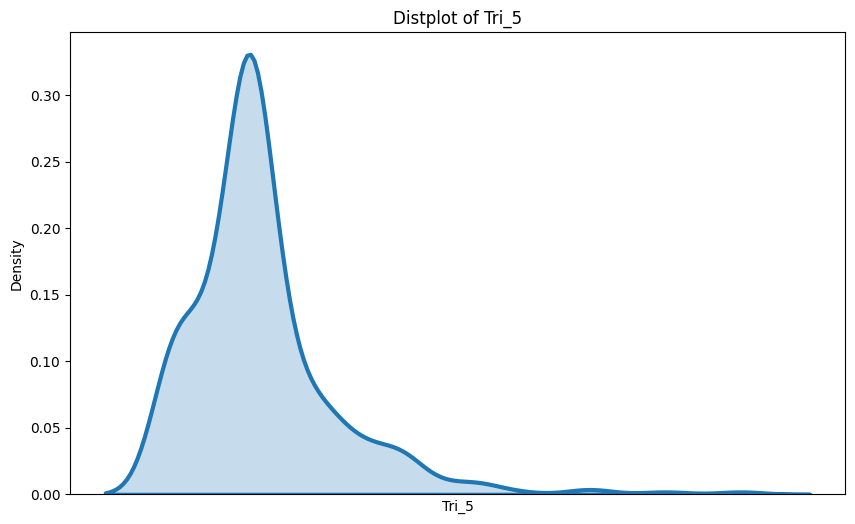

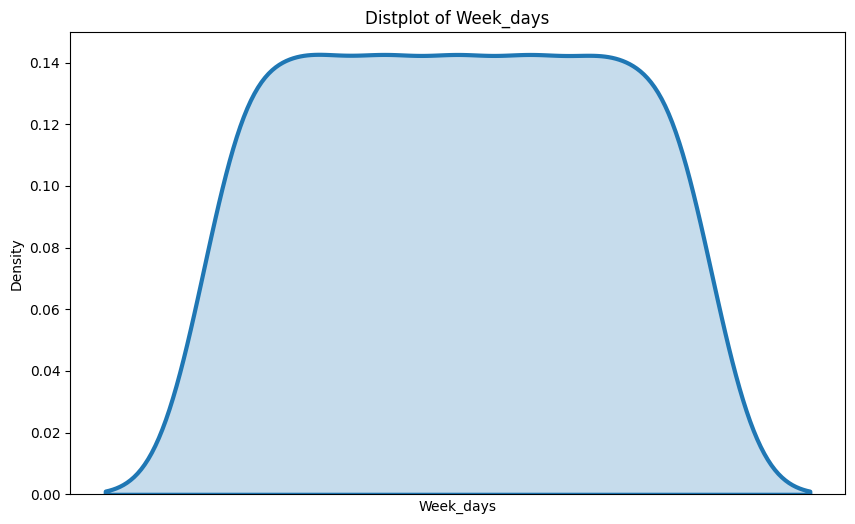

In [336]:
for column in Sir_charles_hospital.columns:
    if pd.api.types.is_datetime64_any_dtype(Sir_charles_hospital[column]):
        continue  # Skip this iteration if the column is datetime
    plt.figure(figsize=(10, 6))
    sns.distplot(Sir_charles_hospital[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

In [337]:
for column in Princess_Marg_Child:
  print(Princess_Marg_Child[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count         365.0
mean     194.846575
std       24.727604
min           132.0
25%           178.0
50%           194.0
75%           210.0
max           280.0
Name: Attendance, dtype: Float64
count        365.0
mean     33.493151
std       6.864311
min           16.0
25%           29.0
50%           33.0
75%           38.0
max           59.0
Name: Admissions, dtype: Float64
count       365.0
mean     0.219178
std      0.861996
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           5.0
Name: Tri_1, dtype: Float64
count       365.0
mean     8.046575
std       3.23197
min           3.0
25%           6.0
50%           8.0
75%          10.0
max          21.0
Name: Tri_2, dtype: Float64
count        365.0
mean     49.265753
std      10.195509
min        

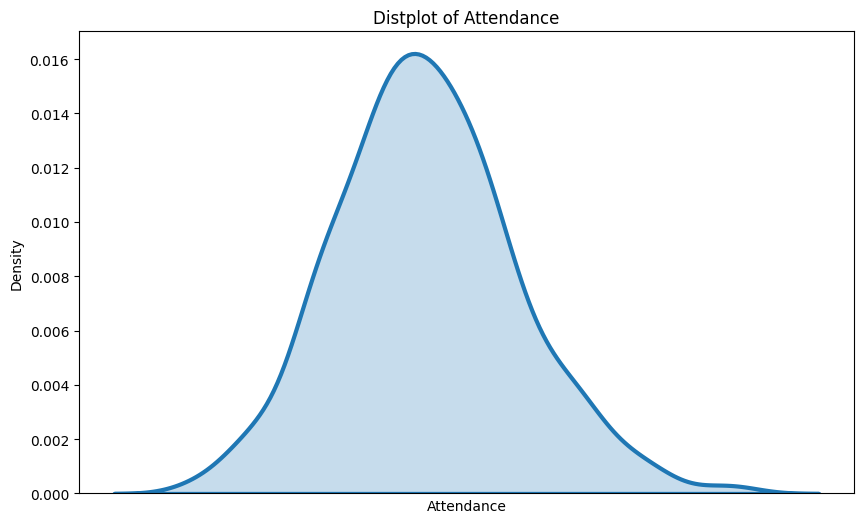

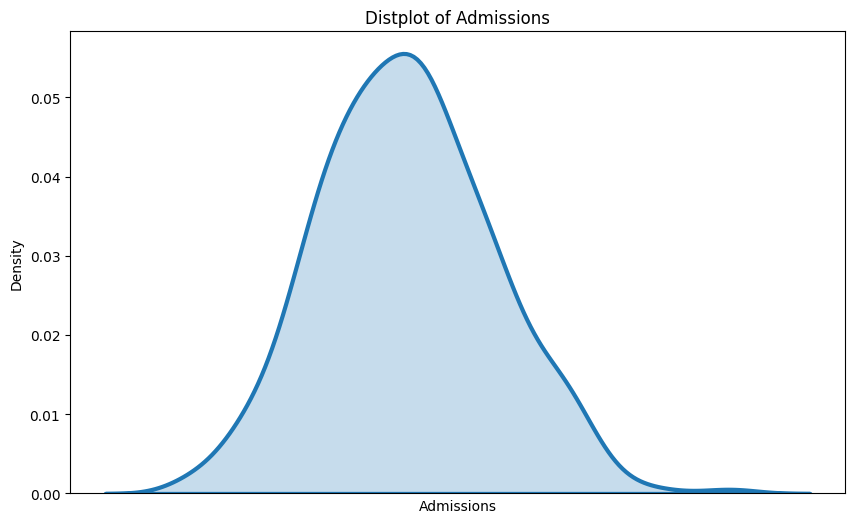

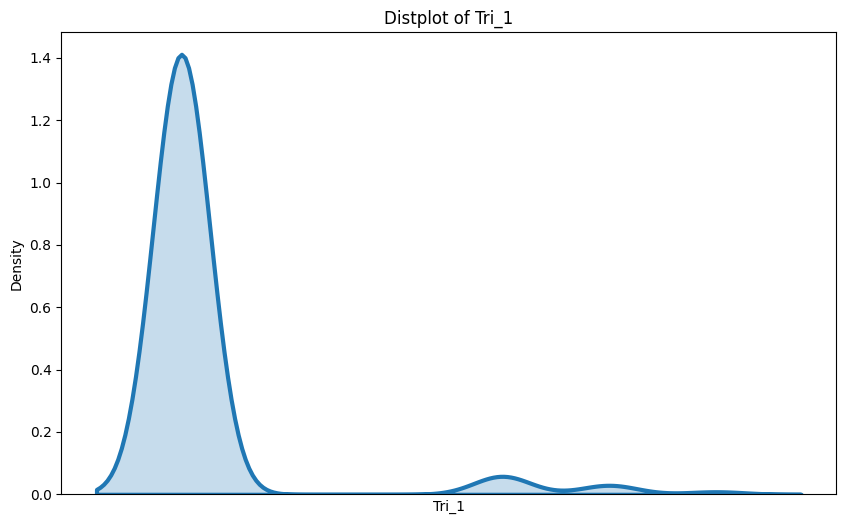

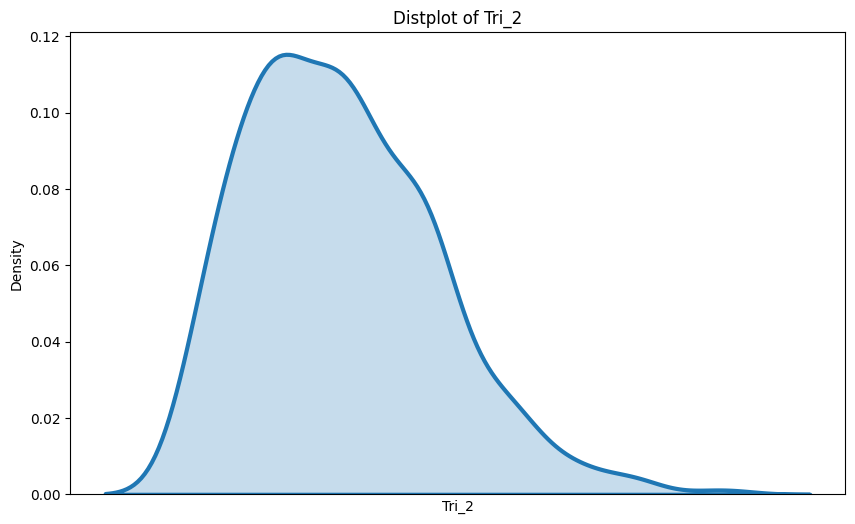

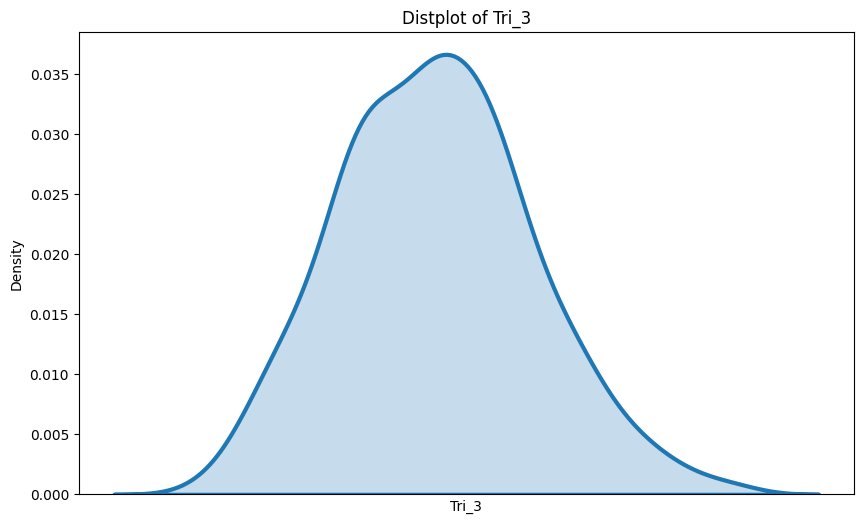

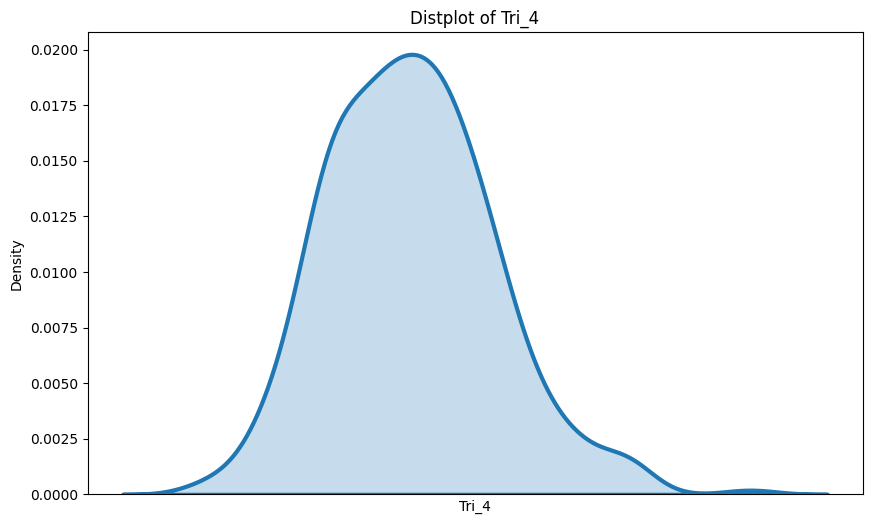

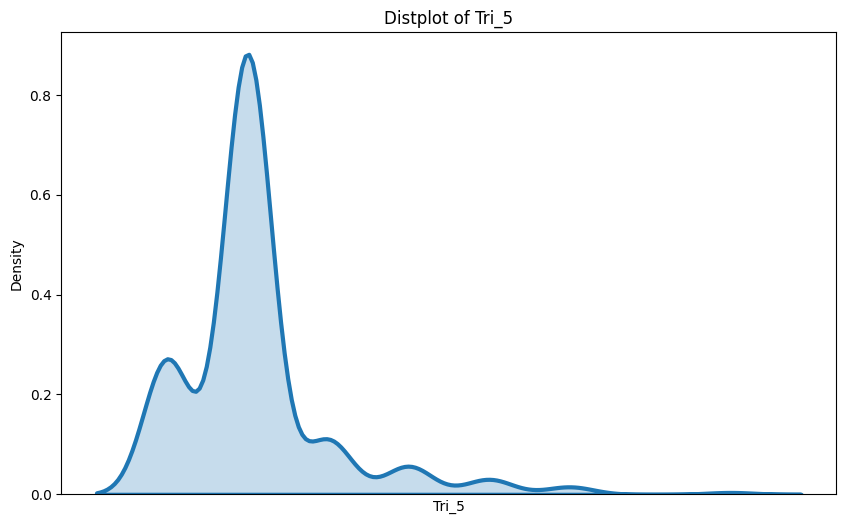

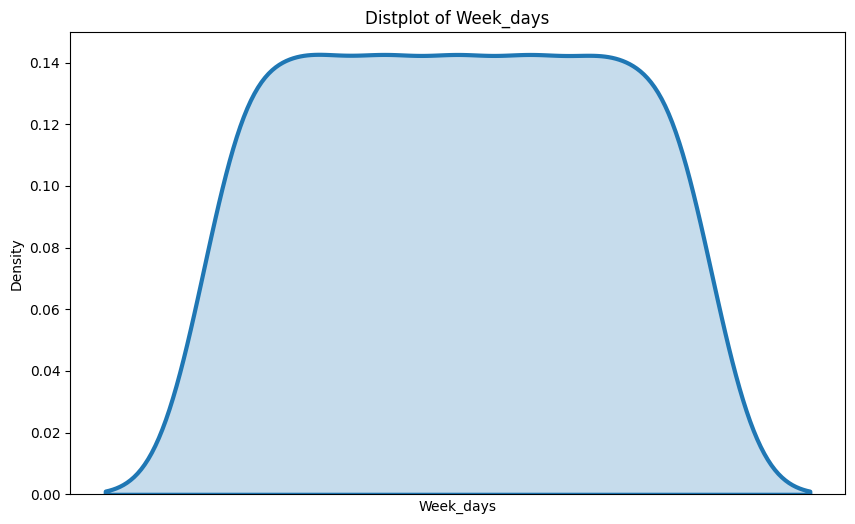

In [338]:
for column in Princess_Marg_Child.columns:
    if pd.api.types.is_datetime64_any_dtype(Princess_Marg_Child[column]):
        continue  # Skip this iteration if the column is datetime
    plt.figure(figsize=(10, 6))
    sns.distplot(Princess_Marg_Child[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

In [339]:
for column in Swan_district_hospital:
  print(Swan_district_hospital[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count         365.0
mean     129.717808
std       13.293799
min            81.0
25%           121.0
50%           130.0
75%           138.0
max           165.0
Name: Attendance, dtype: Float64
count        365.0
mean     24.638356
std       6.773466
min            5.0
25%           20.0
50%           25.0
75%           29.0
max           44.0
Name: Admissions, dtype: Float64
count       365.0
mean      0.29863
std      0.941196
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           4.0
Name: Tri_1, dtype: Float64
count        365.0
mean     22.008219
std       5.282403
min            8.0
25%           18.0
50%           22.0
75%           25.0
max           36.0
Name: Tri_2, dtype: Float64
count        365.0
mean     49.736986
std       8.794159
min

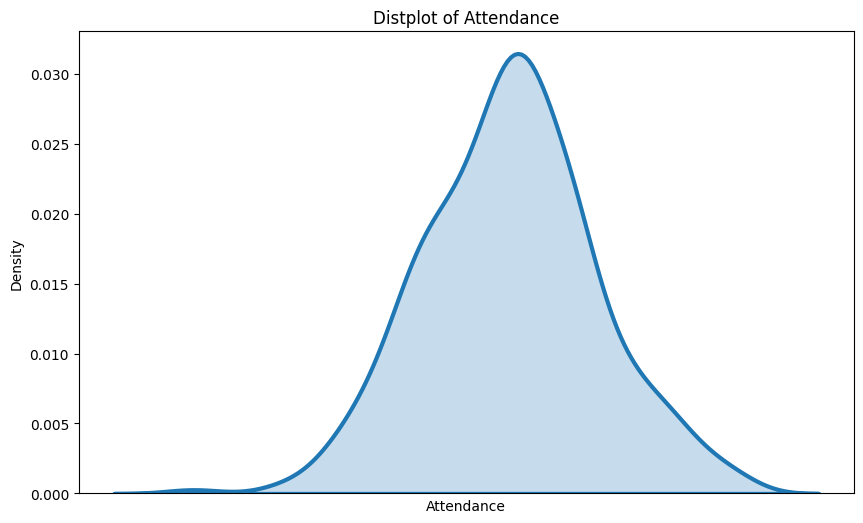

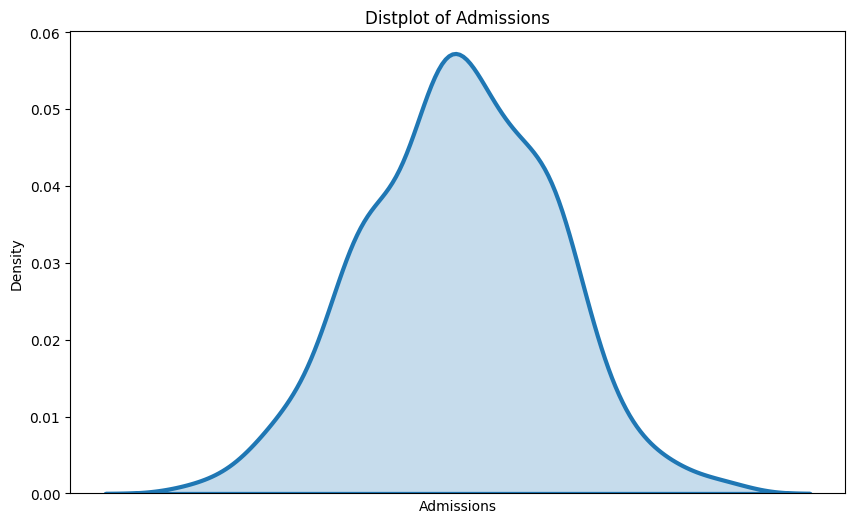

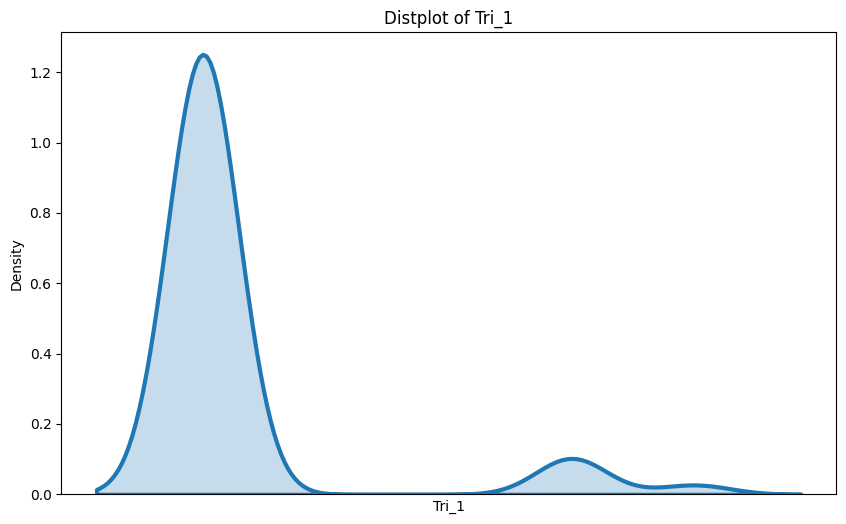

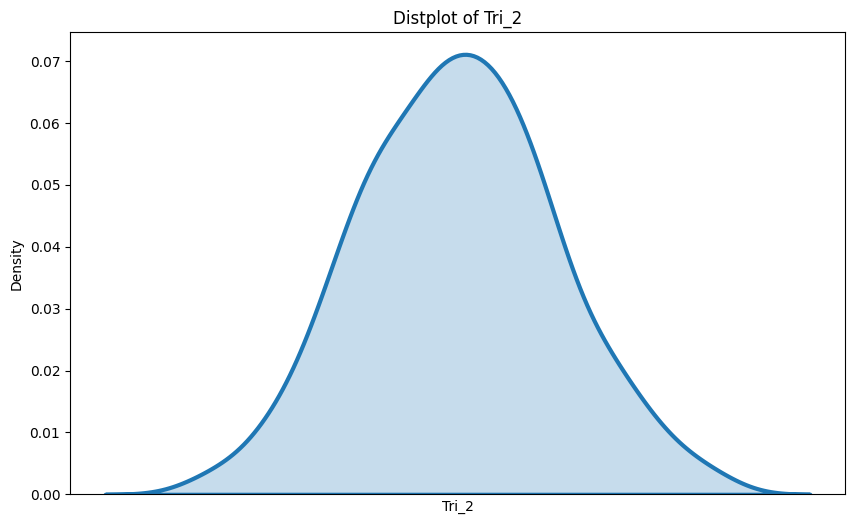

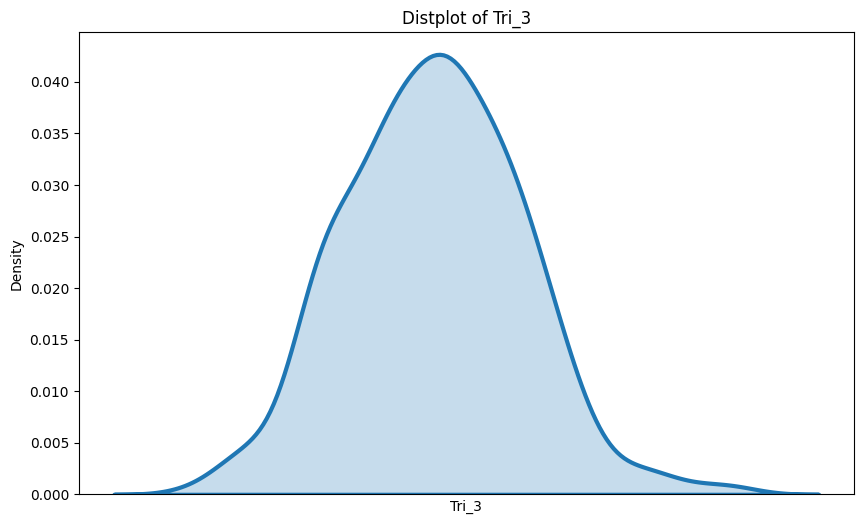

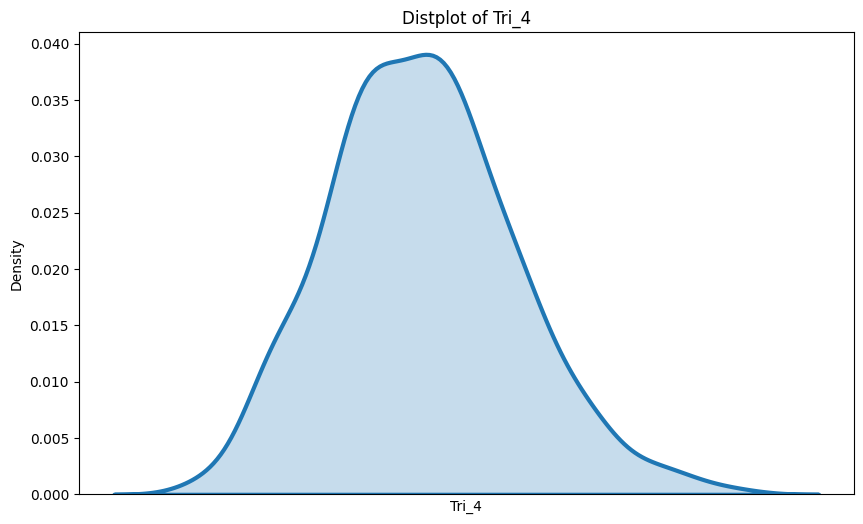

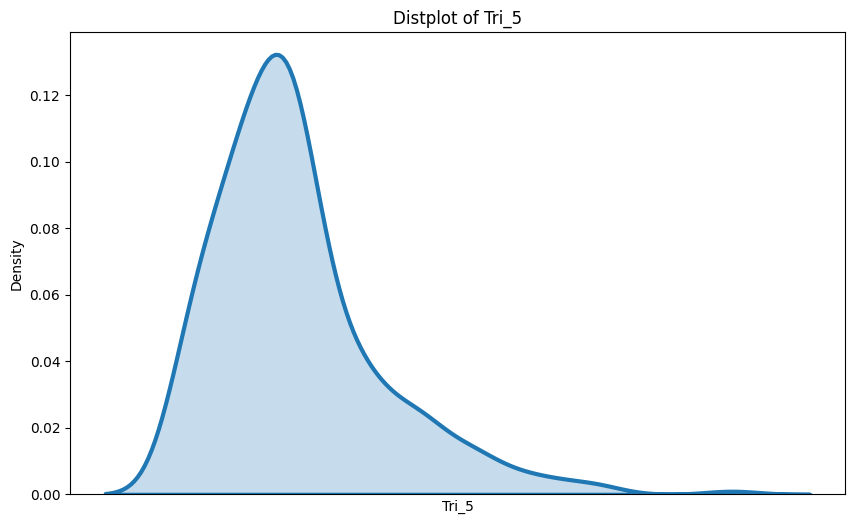

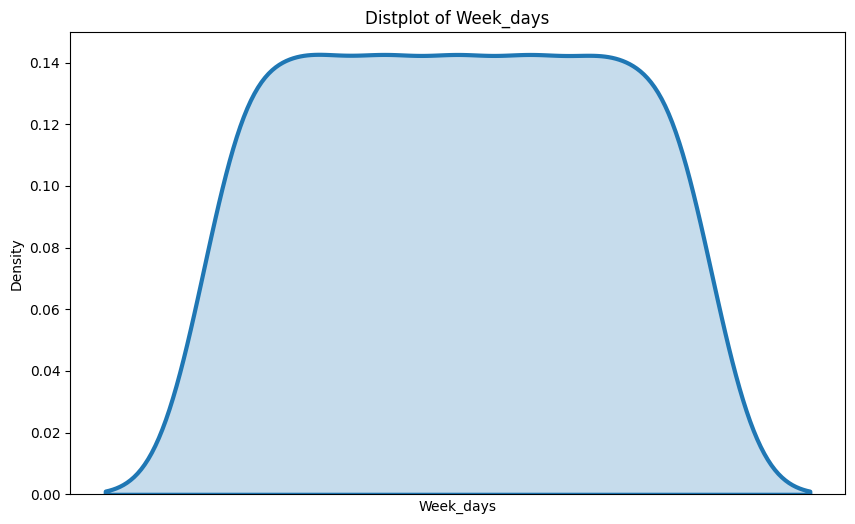

In [340]:
for column in Swan_district_hospital.columns:
    if pd.api.types.is_datetime64_any_dtype(Swan_district_hospital[column]):
        continue  # Skip this iteration if the column is datetime
    plt.figure(figsize=(10, 6))
    sns.distplot(Swan_district_hospital[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

In [341]:
for column in King_Ed_Memorial_Women:
  print(King_Ed_Memorial_Women[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count        365.0
mean     39.558904
std       9.334443
min           17.0
25%           32.0
50%           41.0
75%           46.0
max           64.0
Name: Attendance, dtype: Float64
count       365.0
mean     4.931507
std      1.554228
min           3.0
25%           4.0
50%           5.0
75%           5.0
max          13.0
Name: Admissions, dtype: Float64
count    365.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: Tri_1, dtype: Float64
count       365.0
mean     0.008219
std      0.157027
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           3.0
Name: Tri_2, dtype: Float64
count       365.0
mean     5.019178
std      1.654884
min           3.0
25%           4.0
50%           5.0


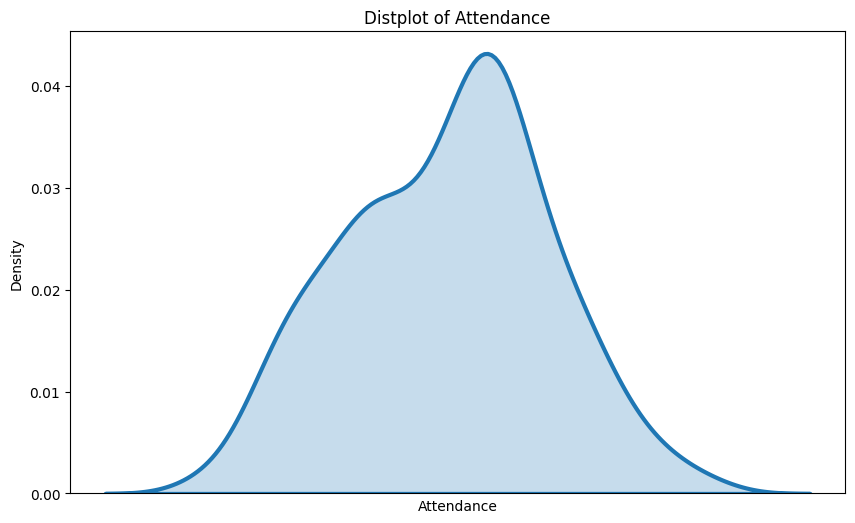

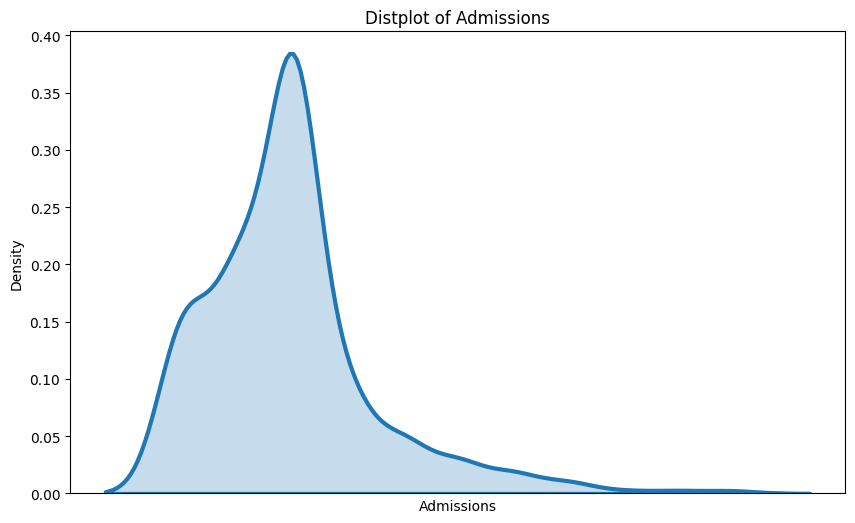

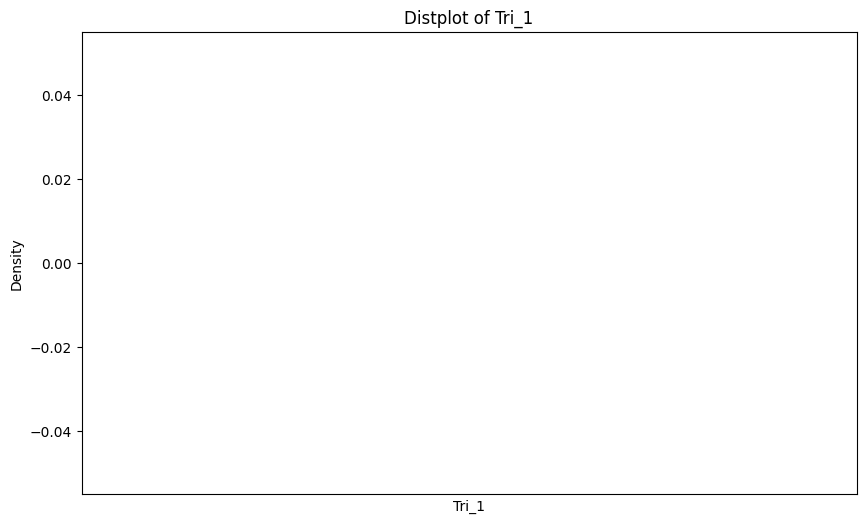

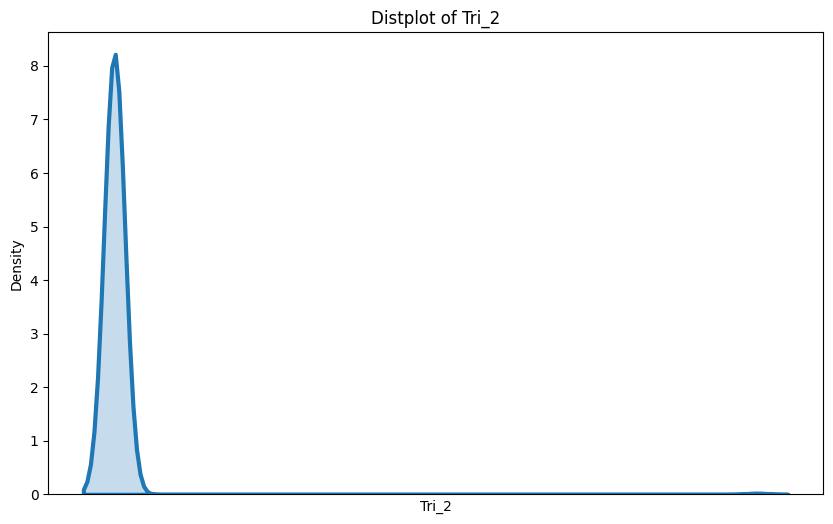

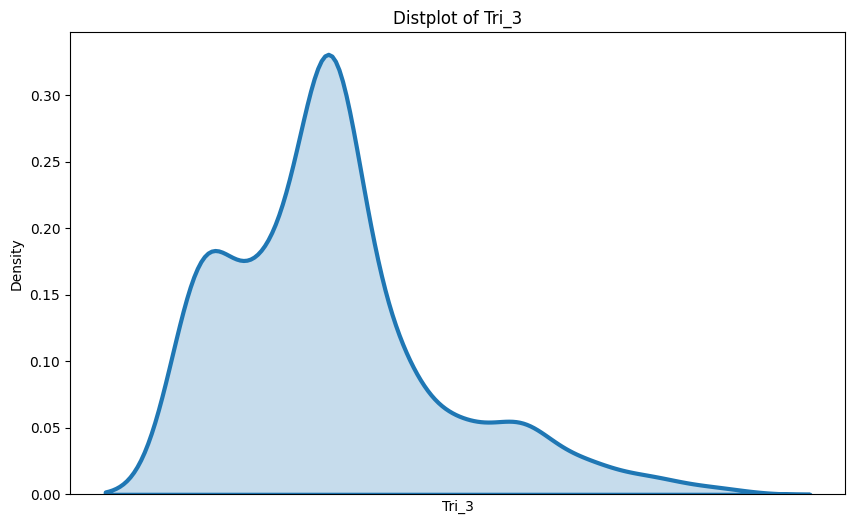

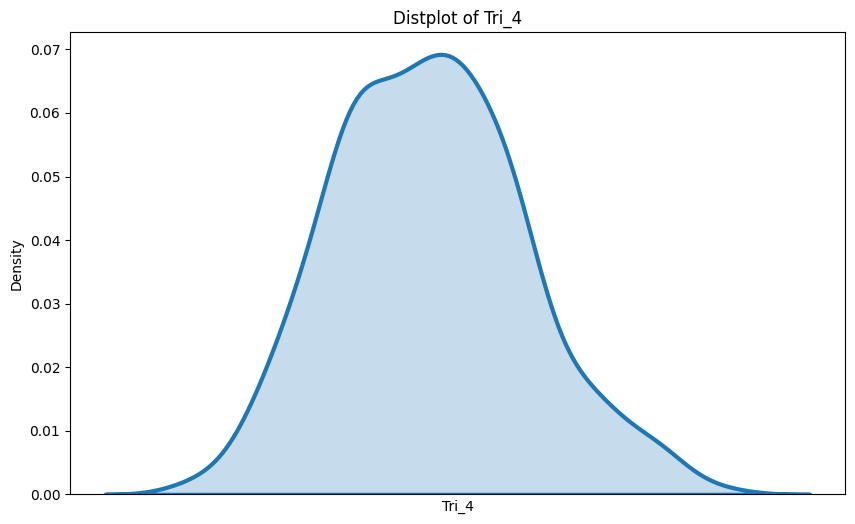

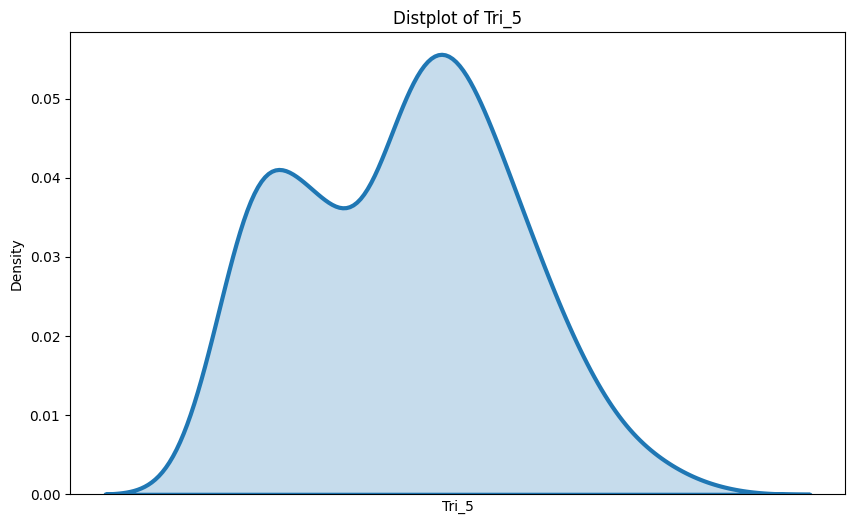

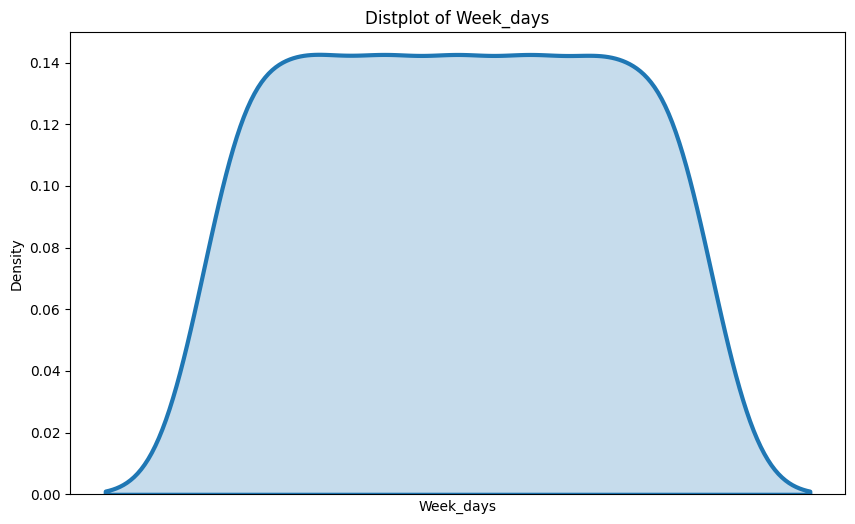

In [342]:
for column in King_Ed_Memorial_Women.columns:
    if pd.api.types.is_datetime64_any_dtype(King_Ed_Memorial_Women[column]):
        continue
    plt.figure(figsize=(10, 6))
    sns.distplot(King_Ed_Memorial_Women[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

In [343]:
for column in Armadale_memorial_hospital:
  print(Armadale_memorial_hospital[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count        365.0
mean     168.50411
std       18.42532
min          124.0
25%          156.0
50%          167.0
75%          179.0
max          222.0
Name: Attendance, dtype: Float64
count        365.0
mean     20.805479
std       5.010755
min            9.0
25%           17.0
50%           21.0
75%           24.0
max           36.0
Name: Admissions, dtype: Float64
count       365.0
mean     0.189041
std      0.755849
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           5.0
Name: Tri_1, dtype: Float64
count        365.0
mean     22.312329
std       5.089419
min           10.0
25%           19.0
50%           22.0
75%           26.0
max           40.0
Name: Tri_2, dtype: Float64
count        365.0
mean     64.328767
std      10.335917
min        

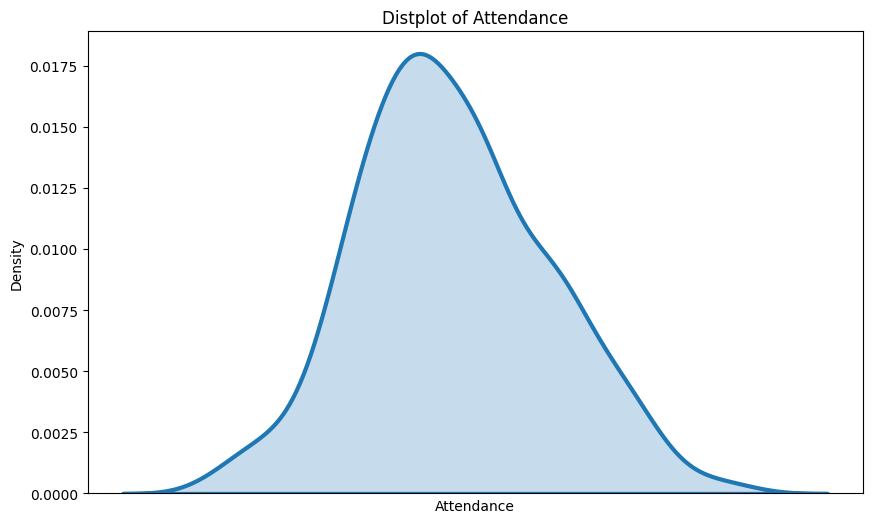

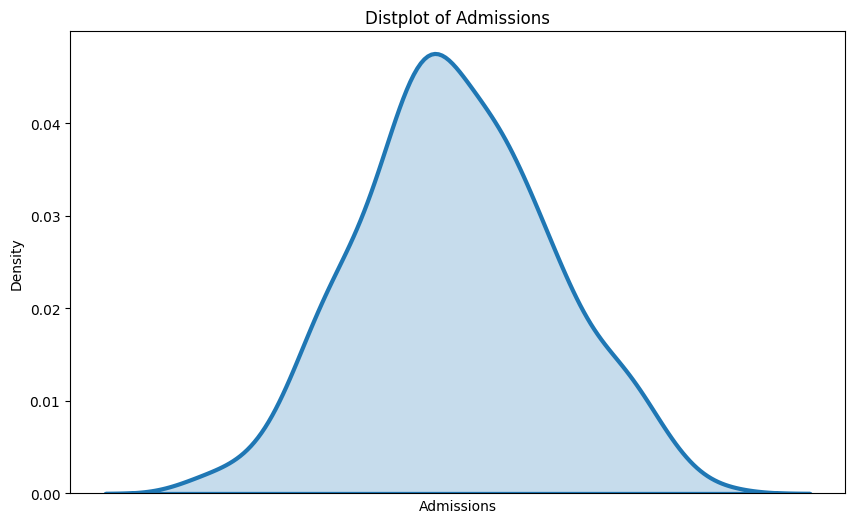

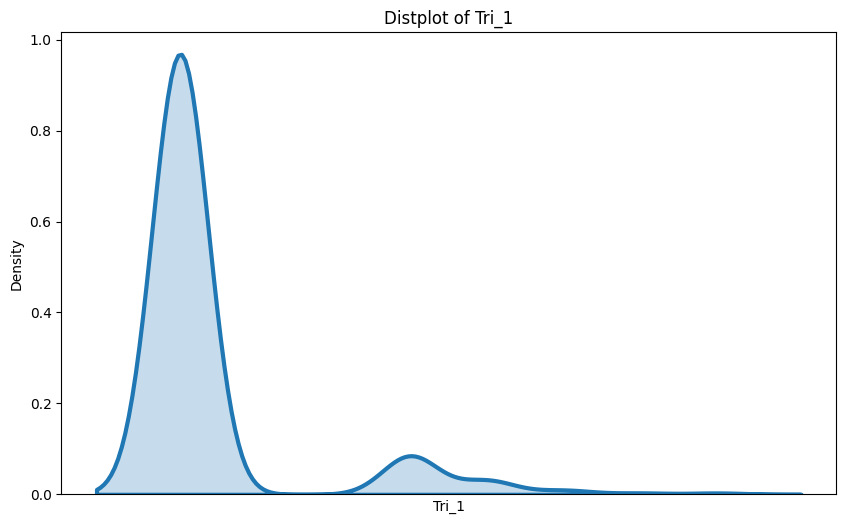

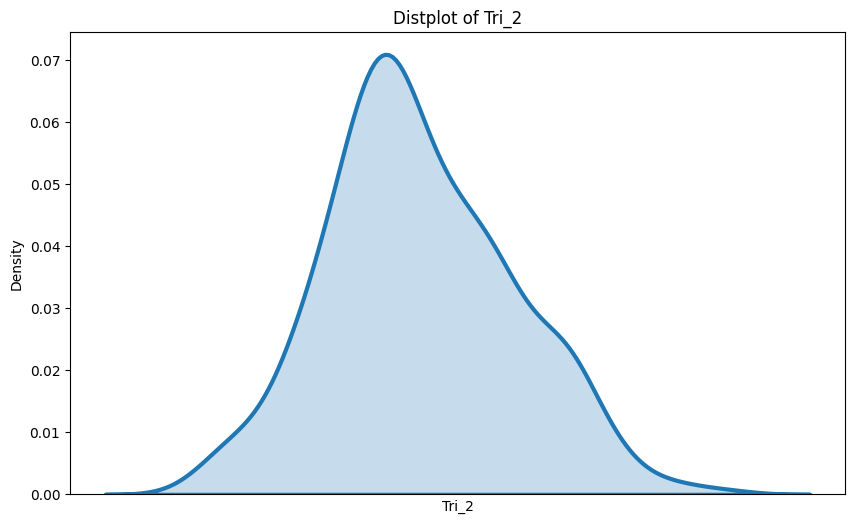

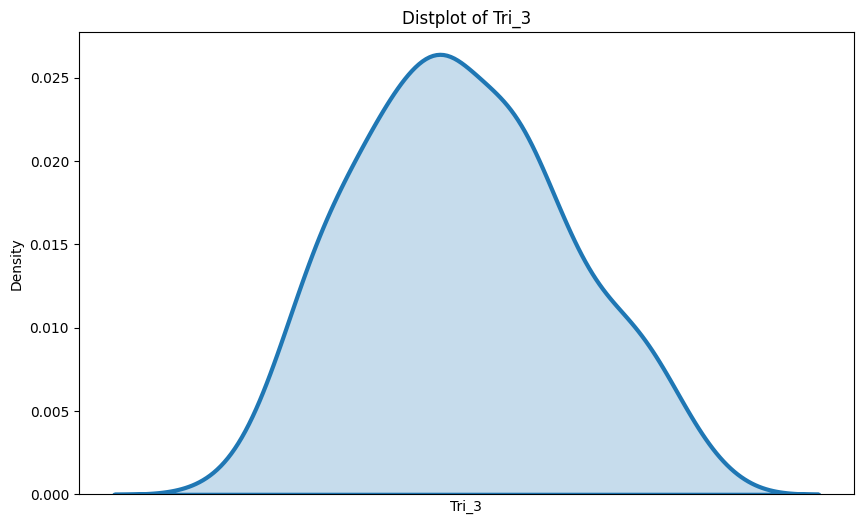

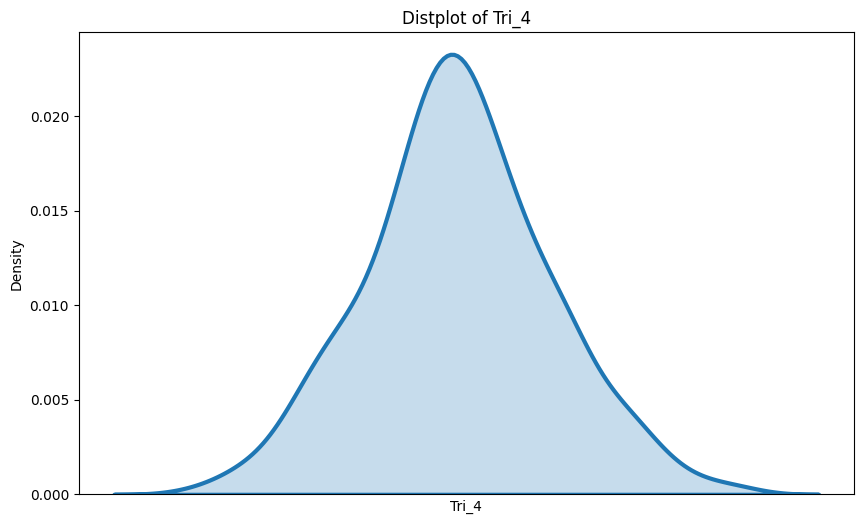

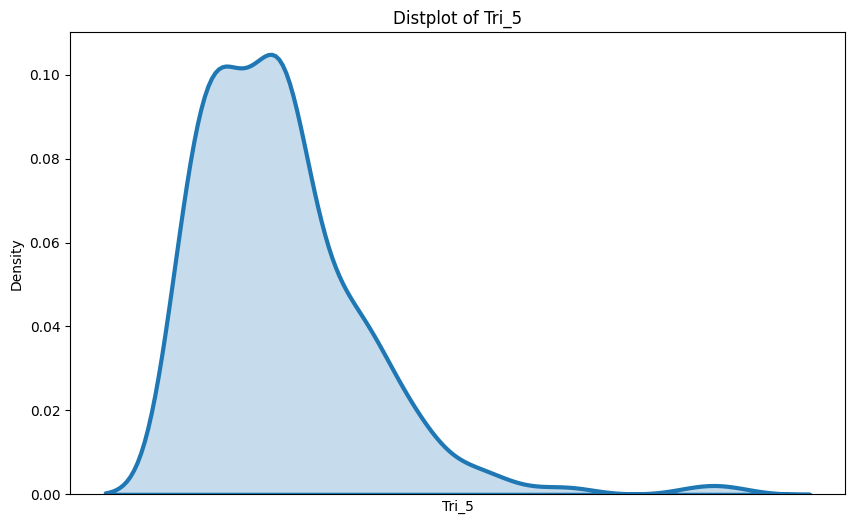

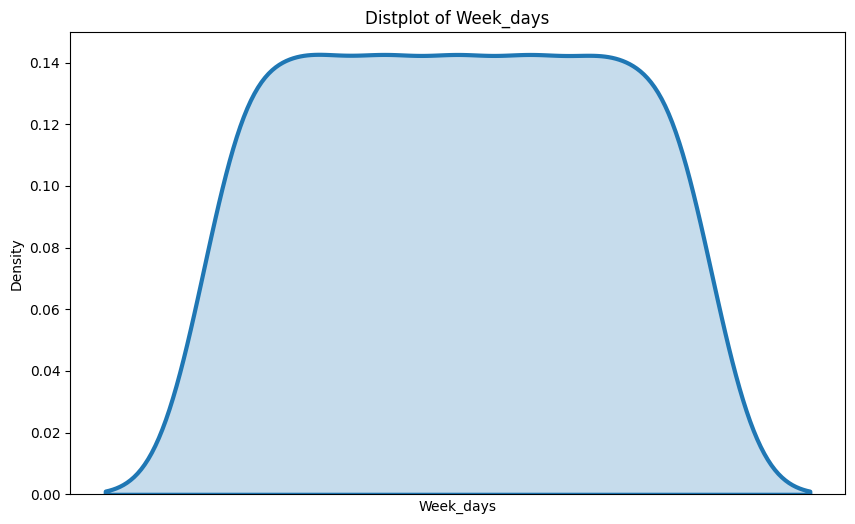

In [344]:
for column in Armadale_memorial_hospital.columns:
    if pd.api.types.is_datetime64_any_dtype(Armadale_memorial_hospital[column]):
        continue
    plt.figure(figsize=(10, 6))
    sns.distplot(Joondalup_health_campus[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

In [345]:
for column in rockingham_general_hospital:
  print(rockingham_general_hospital[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count         365.0
mean     144.665753
std        13.70161
min           110.0
25%           135.0
50%           144.0
75%           154.0
max           182.0
Name: Attendance, dtype: Float64
count        365.0
mean     15.887671
std       5.126529
min            4.0
25%           12.0
50%           16.0
75%           19.0
max           31.0
Name: Admissions, dtype: Float64
count       365.0
mean     0.087671
std      0.527264
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           4.0
Name: Tri_1, dtype: Float64
count        365.0
mean     16.810959
std       4.261364
min            7.0
25%           14.0
50%           17.0
75%           20.0
max           32.0
Name: Tri_2, dtype: Float64
count        365.0
mean     49.709589
std       9.060726
min

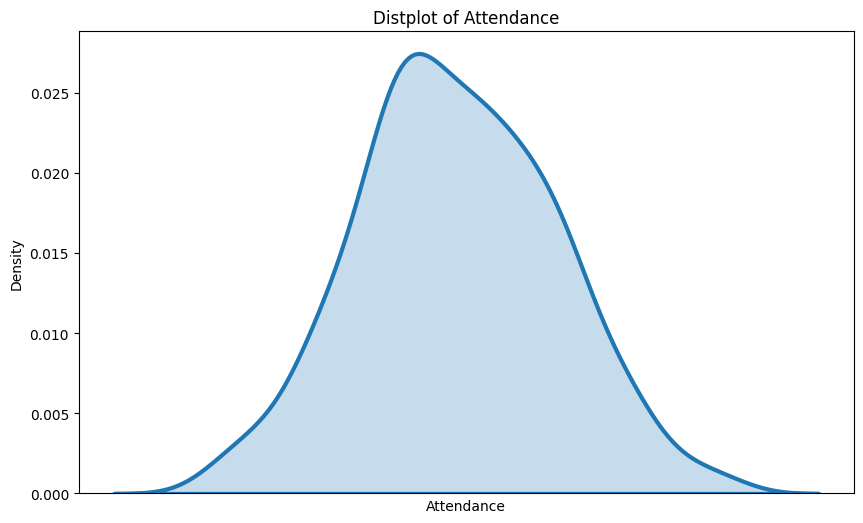

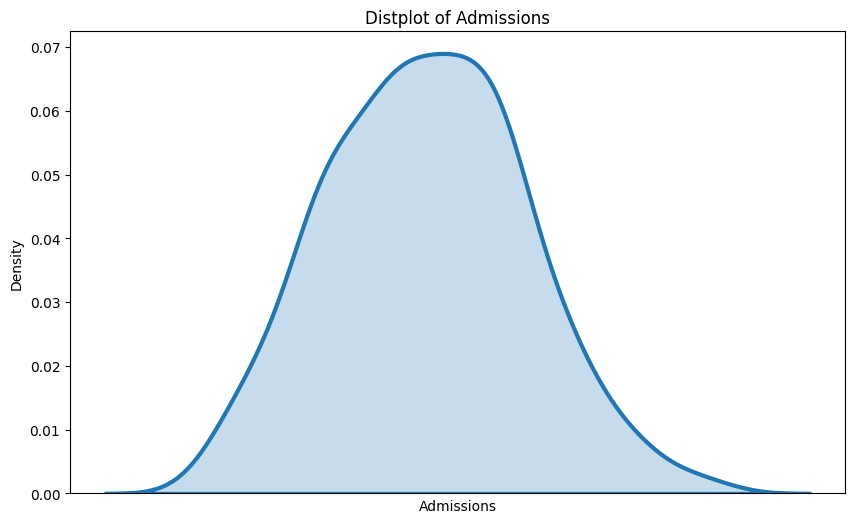

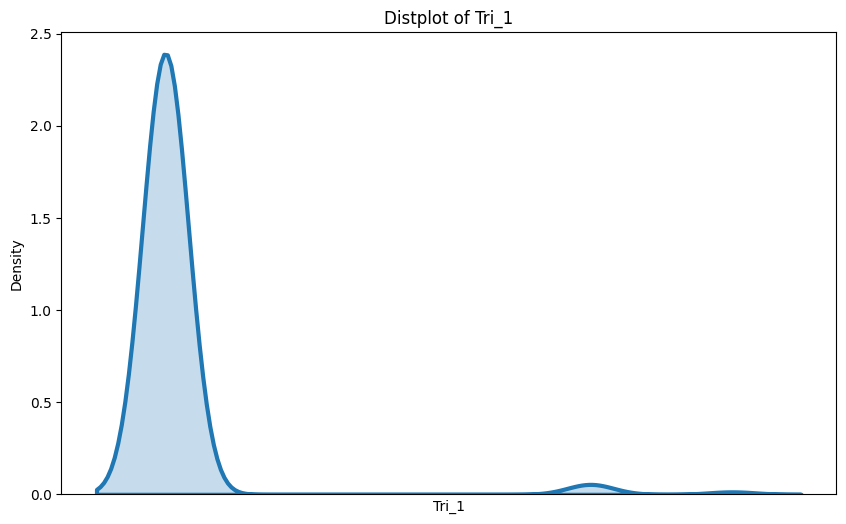

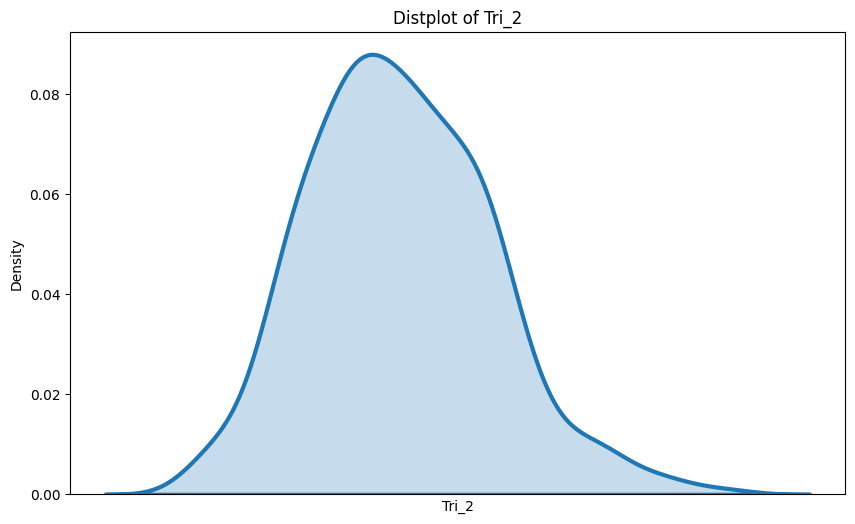

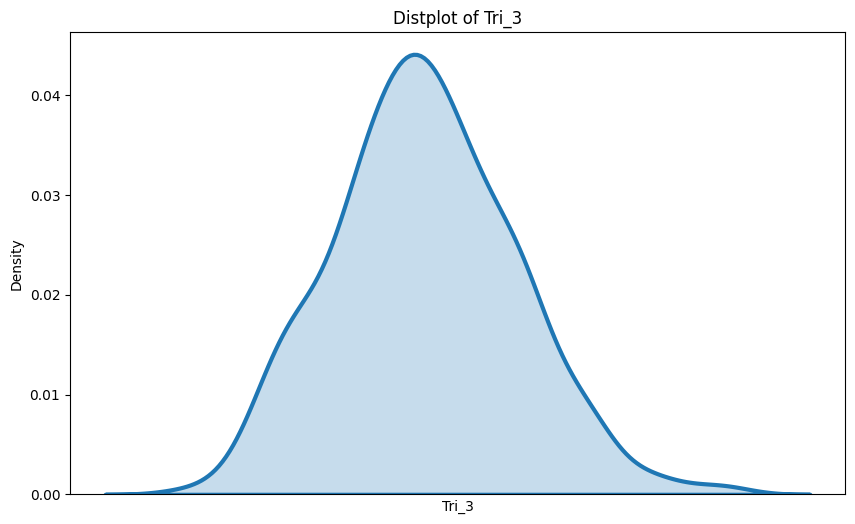

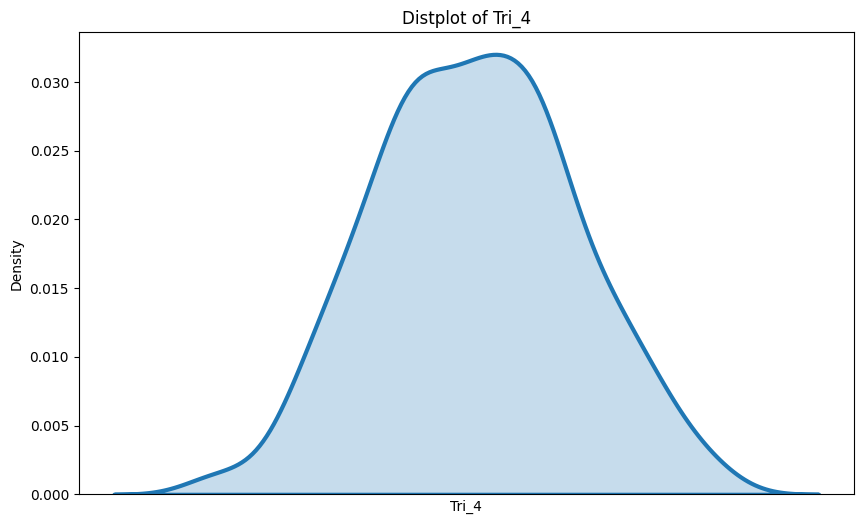

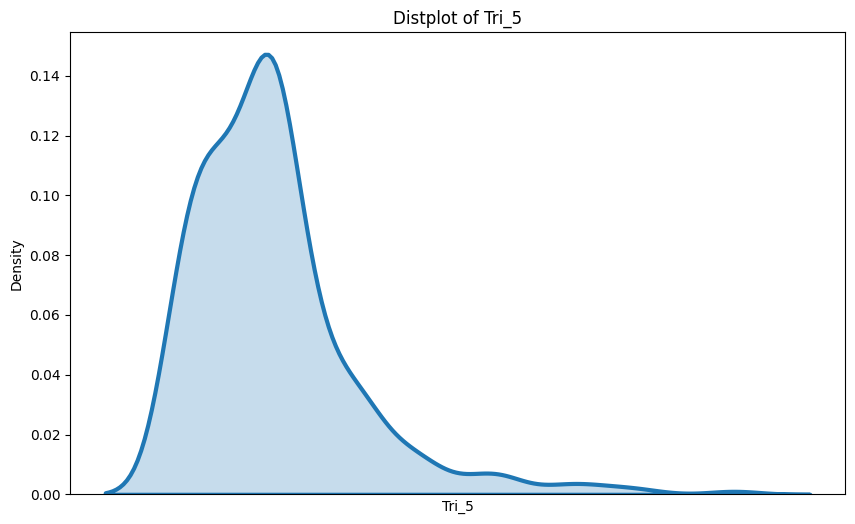

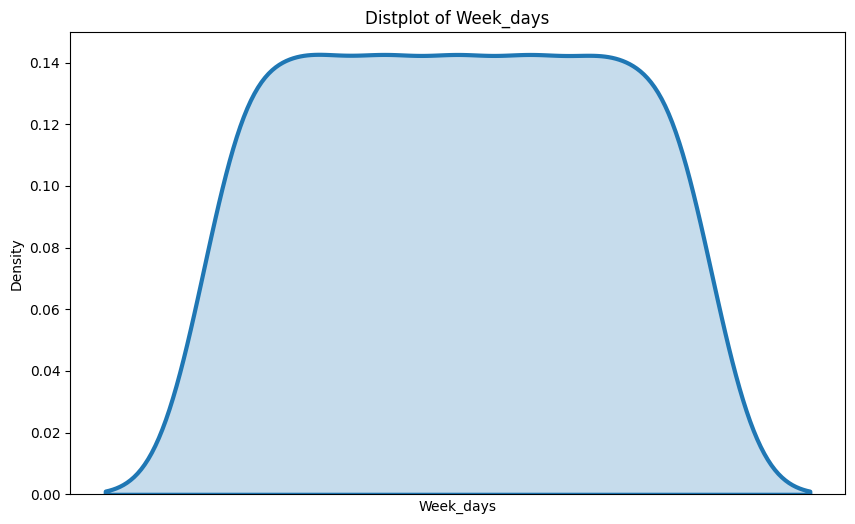

In [346]:
for column in rockingham_general_hospital.columns:
    if pd.api.types.is_datetime64_any_dtype(rockingham_general_hospital[column]):
        continue
    plt.figure(figsize=(10, 6))
    sns.distplot(rockingham_general_hospital[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

In [347]:
for column in Joondalup_health_campus:
  print(Joondalup_health_campus[column].describe())

count                     365
unique                    365
top       2013-07-01 00:00:00
freq                        1
first     2013-07-01 00:00:00
last      2014-06-30 00:00:00
Name: datetime, dtype: object
count         365.0
mean     256.810959
std       22.059233
min           201.0
25%           241.0
50%           254.0
75%           271.0
max           323.0
Name: Attendance, dtype: Float64
count       365.0
mean     73.30411
std      8.239753
min          51.0
25%          68.0
50%          73.0
75%          79.0
max          96.0
Name: Admissions, dtype: Float64
count       365.0
mean     0.416438
std      1.182172
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           7.0
Name: Tri_1, dtype: Float64
count        365.0
mean     30.583562
std       5.973545
min           16.0
25%           27.0
50%           30.0
75%           35.0
max           50.0
Name: Tri_2, dtype: Float64
count        365.0
mean     90.838356
std      13.619583
min        

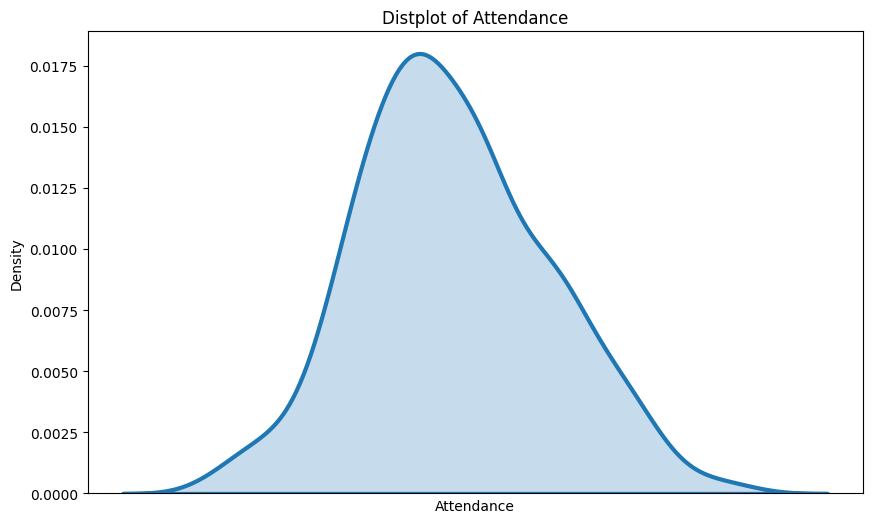

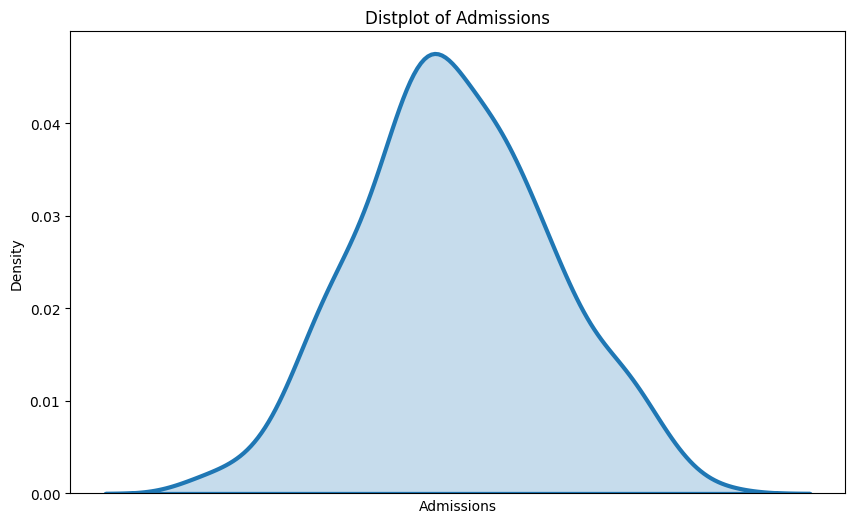

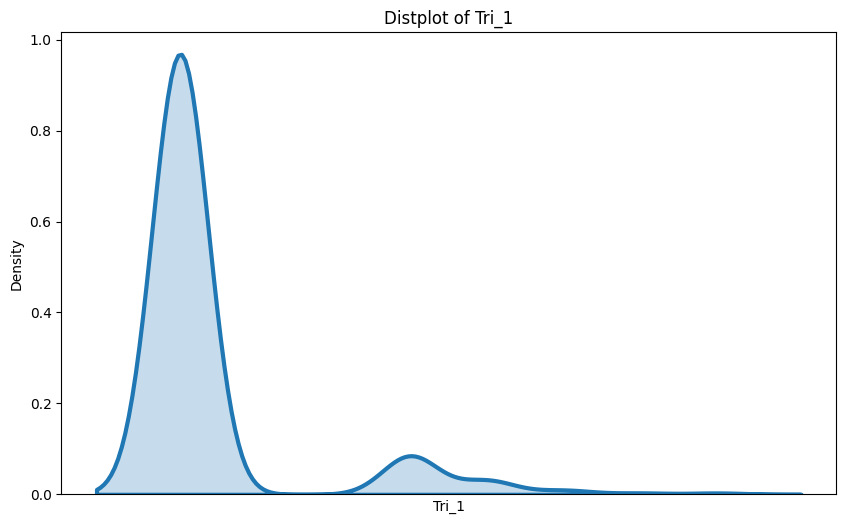

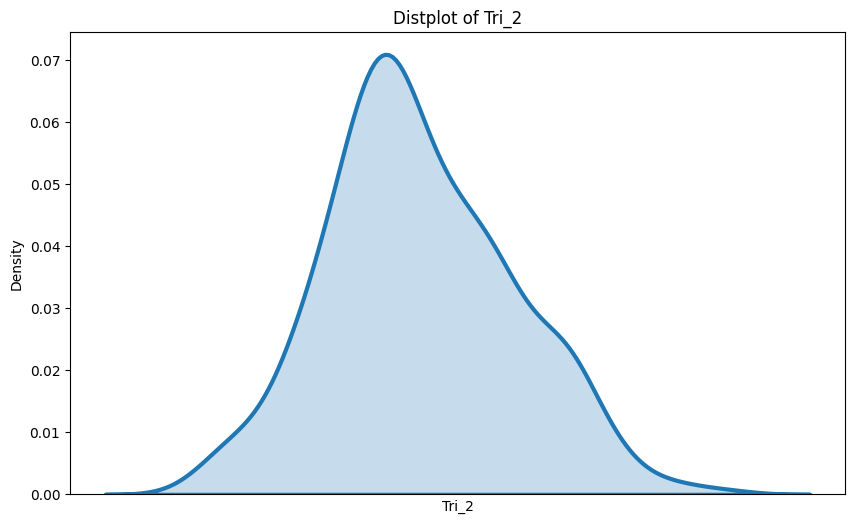

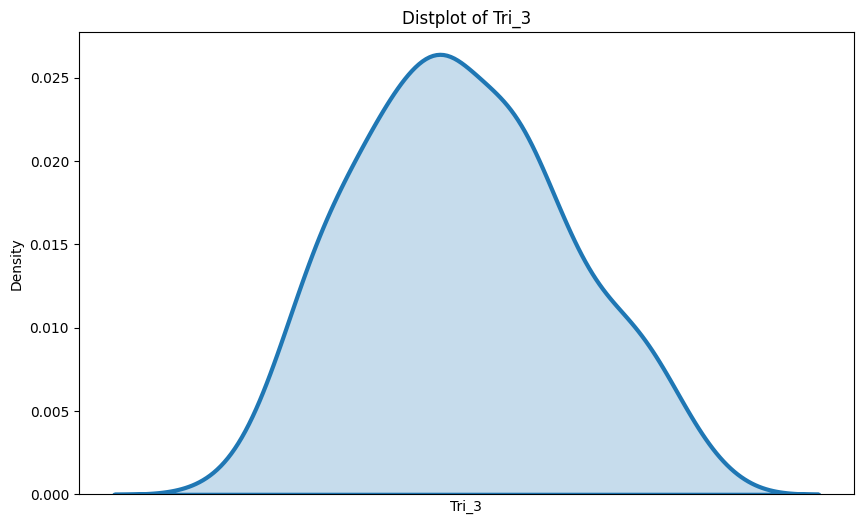

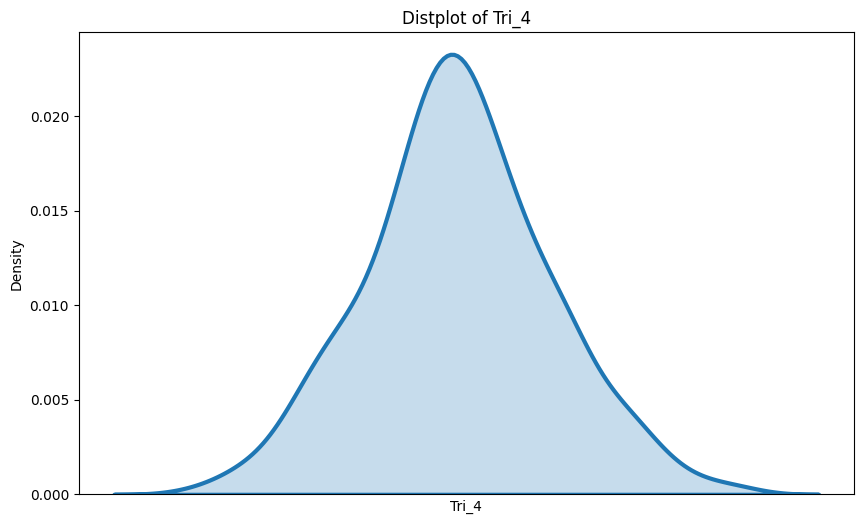

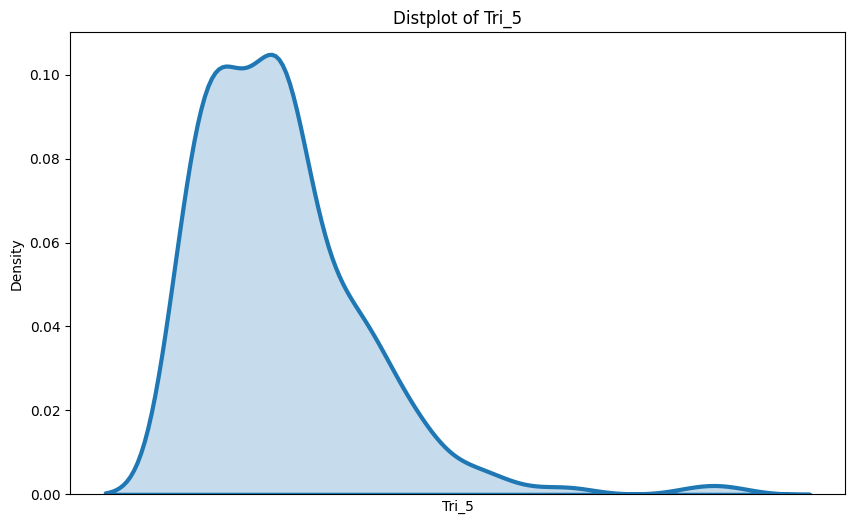

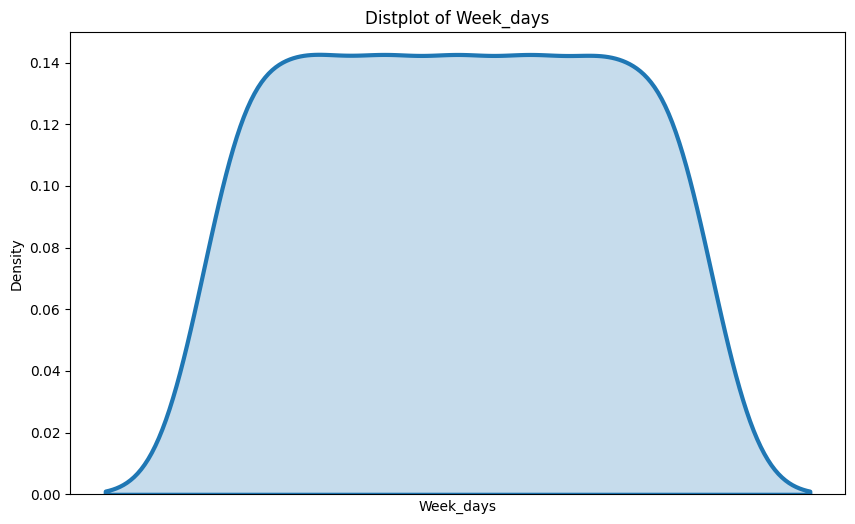

In [348]:
for column in Joondalup_health_campus.columns:
    if pd.api.types.is_datetime64_any_dtype(Joondalup_health_campus[column]):
        continue
    plt.figure(figsize=(10, 6))
    sns.distplot(Joondalup_health_campus[column], hist = False, kde= True,
                 kde_kws = {'shade': True, 'linewidth': 3})
    plt.title(f'Distplot of {column}')
    plt.xticks([])
    plt.show()

## The Approximate rate of attendance in ED per Hospital per Day

In [349]:
from scipy.stats import poisson


for hospital, df in dataframes.items():
    mu = df['Attendance'].mean()
    poisson_estimate = poisson(mu)
    print(f"Poisson estimate for attendance in {hospital}: mu = {mu}")

Poisson estimate for attendance in Royal Perth Hospital: mu = 227.0191780821918
Poisson estimate for attendance in Fremantle Hospital: mu = 158.86849315068494
Poisson estimate for attendance in Princess Margaret Hospital For Children: mu = 194.84657534246574
Poisson estimate for attendance in King Edward Memorial Hospital For Women: mu = 39.558904109589044
Poisson estimate for attendance in Sir Charles Gairdner Hospital: mu = 180.46849315068494
Poisson estimate for attendance in Armadale/Kelmscott District Memorial Hospital: mu = 168.5041095890411
Poisson estimate for attendance in Swan District Hospital: mu = 129.7178082191781
Poisson estimate for attendance in Rockingham General Hospital: mu = 144.66575342465754
Poisson estimate for attendance in Joondalup Health Campus: mu = 256.8109589041096


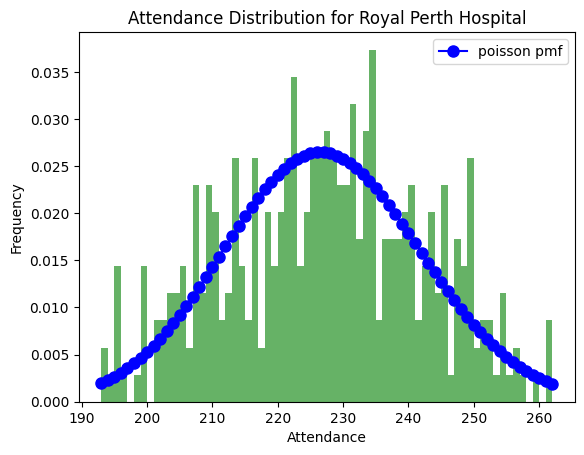

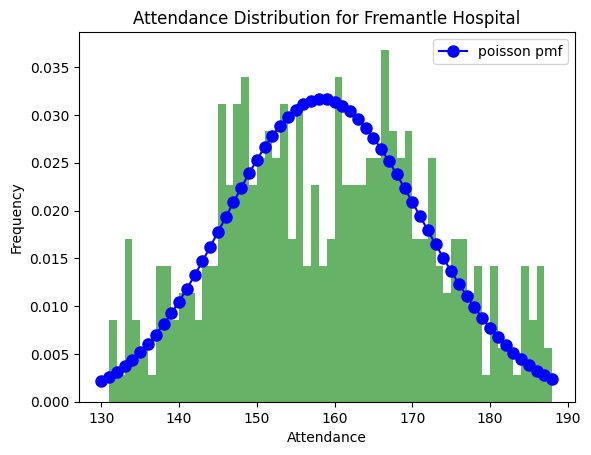

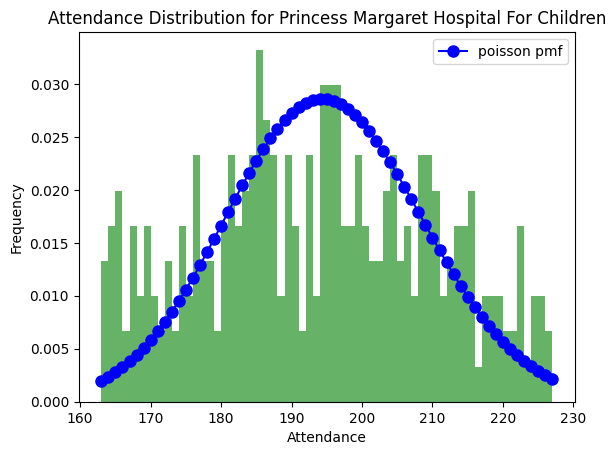

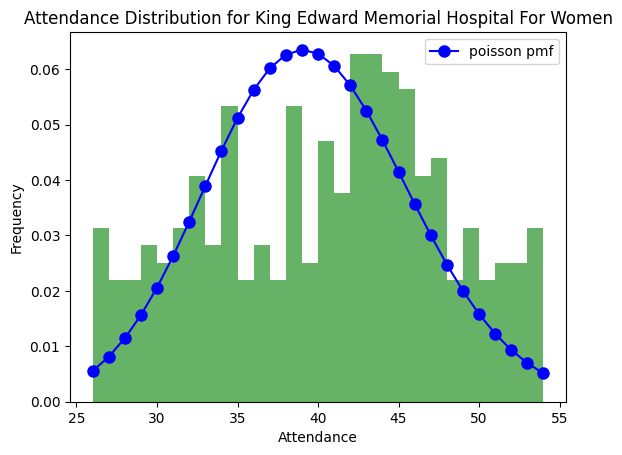

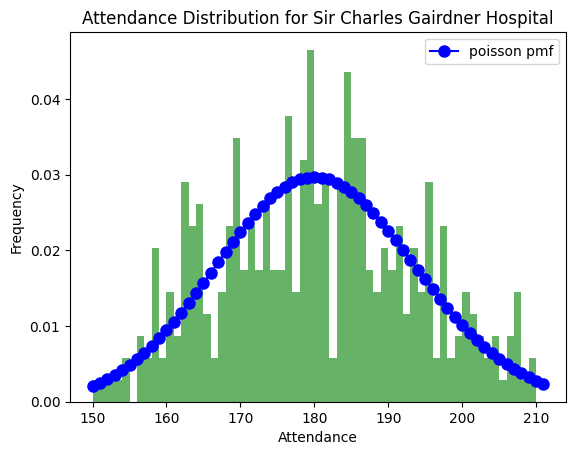

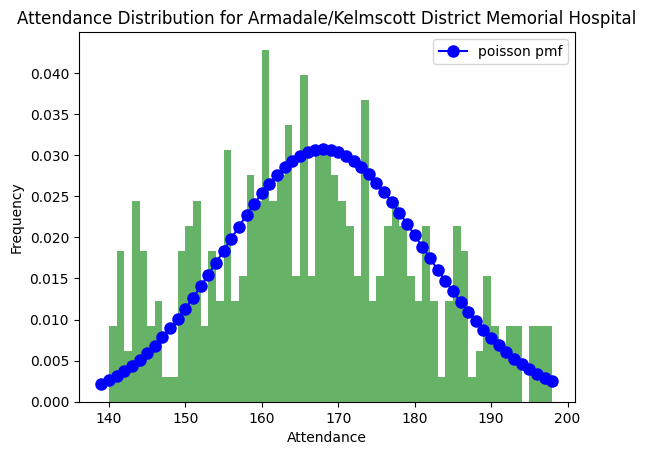

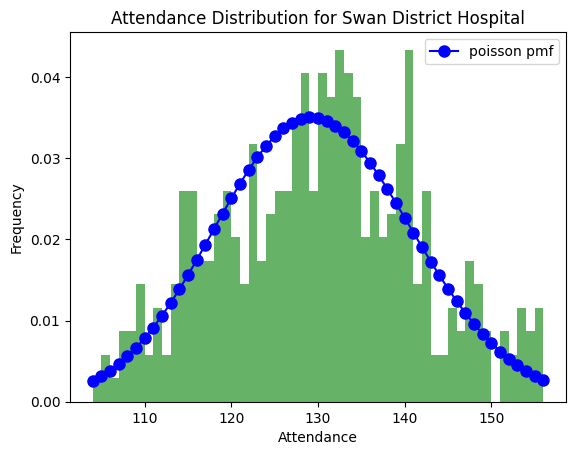

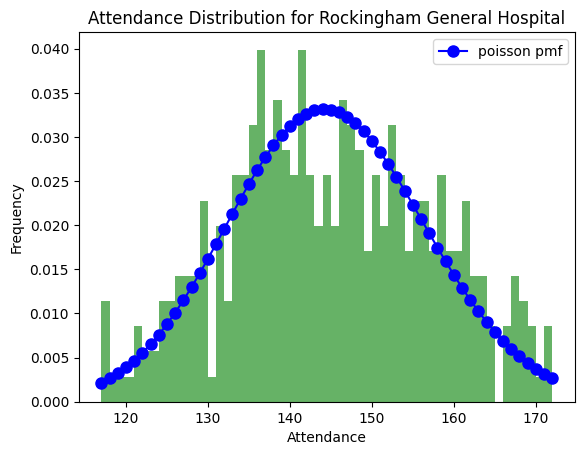

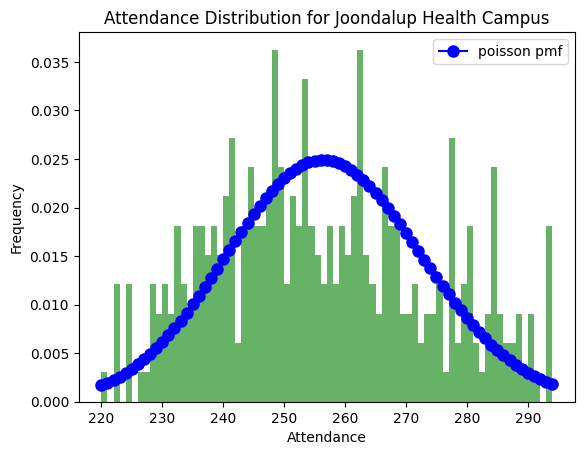

In [350]:
for hospital, df in dataframes.items():
    mu = df['Attendance'].mean()
    poisson_estimate = poisson(mu)

    # Calculate poisson PMF for range of values
    x = np.arange(poisson.ppf(0.01, mu), poisson.ppf(0.99, mu))
    y = poisson_estimate.pmf(x)

    # Plot histogram of data
    plt.hist(df['Attendance'], bins=x, density=True, alpha=0.6, color='g')

    # Plot estimated Poisson distribution
    plt.plot(x, y, 'bo-', ms=8, label='poisson pmf')

    # Title and labels
    plt.title(f'Attendance Distribution for {hospital}')
    plt.xlabel('Attendance')
    plt.ylabel('Frequency')

    # Show legend and plot
    plt.legend()
    plt.show()

In [351]:
for hospital, df in dataframes.items():
    mu = df['Admissions'].mean()
    poisson_estimate = poisson(mu)
    print(f"Poisson estimate for admissions in {hospital}: mu = {mu}")

Poisson estimate for admissions in Royal Perth Hospital: mu = 96.23561643835616
Poisson estimate for admissions in Fremantle Hospital: mu = 65.21643835616439
Poisson estimate for admissions in Princess Margaret Hospital For Children: mu = 33.49315068493151
Poisson estimate for admissions in King Edward Memorial Hospital For Women: mu = 4.931506849315069
Poisson estimate for admissions in Sir Charles Gairdner Hospital: mu = 107.94520547945206
Poisson estimate for admissions in Armadale/Kelmscott District Memorial Hospital: mu = 20.805479452054794
Poisson estimate for admissions in Swan District Hospital: mu = 24.638356164383563
Poisson estimate for admissions in Rockingham General Hospital: mu = 15.887671232876713
Poisson estimate for admissions in Joondalup Health Campus: mu = 73.30410958904109


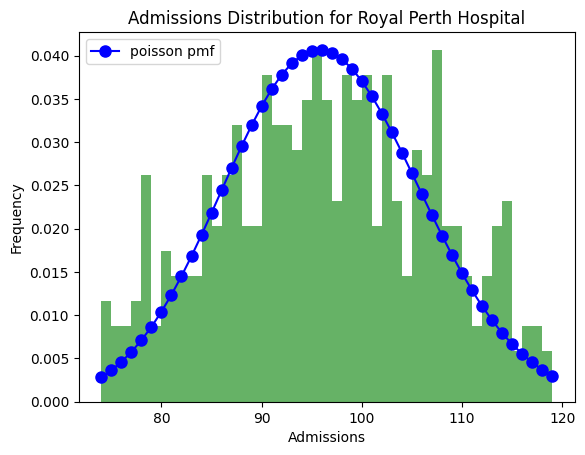

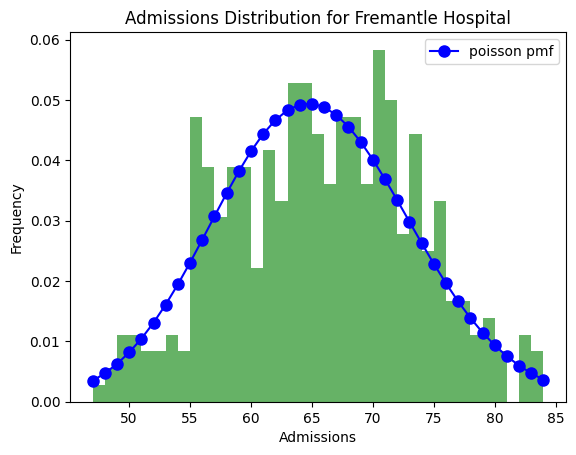

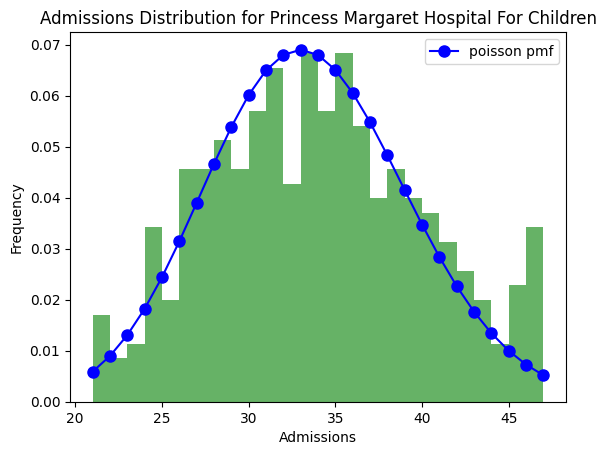

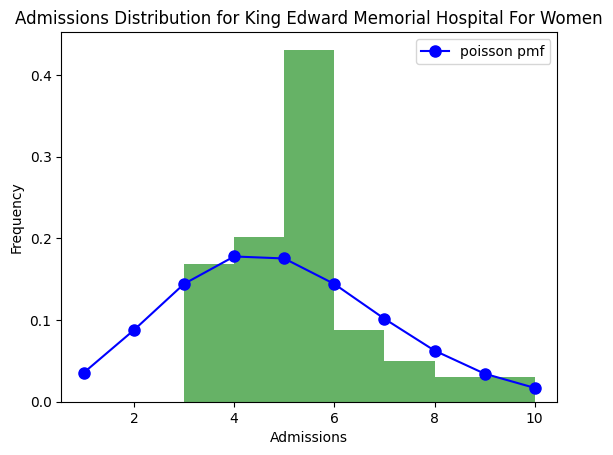

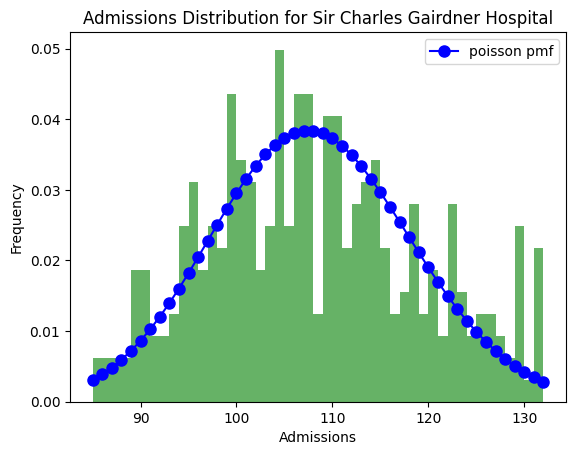

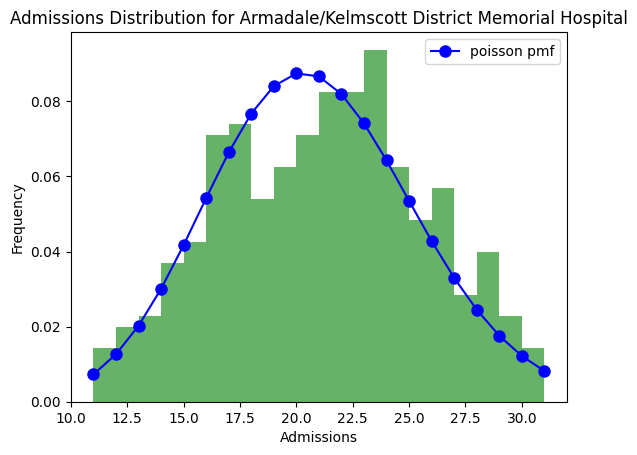

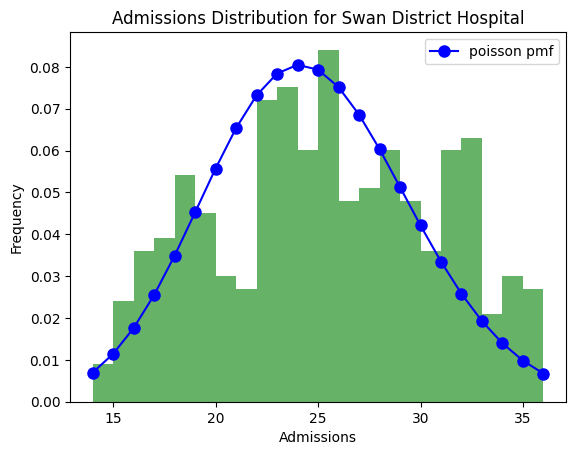

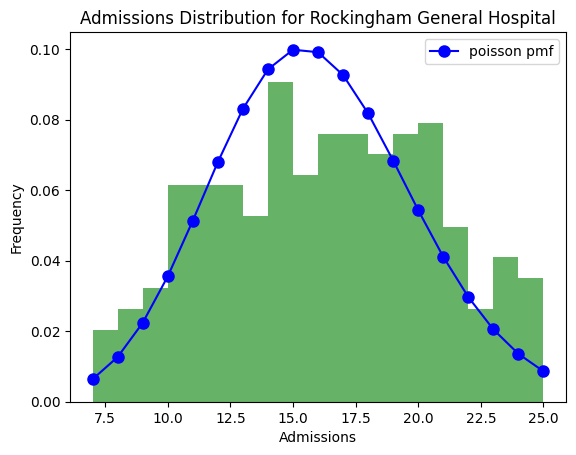

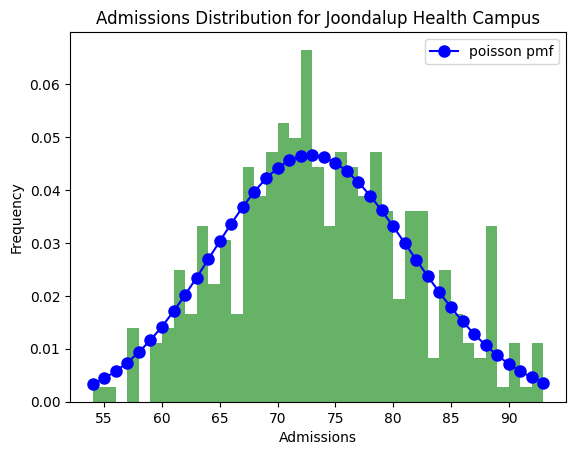

In [352]:
for hospital, df in dataframes.items():
    mu = df['Admissions'].mean()
    poisson_estimate = poisson(mu)

    # Calculate poisson PMF for range of values
    x = np.arange(poisson.ppf(0.01, mu), poisson.ppf(0.99, mu))
    y = poisson_estimate.pmf(x)

    # Plot histogram of data
    plt.hist(df['Admissions'], bins=x, density=True, alpha=0.6, color='g')

    # Plot estimated Poisson distribution
    plt.plot(x, y, 'bo-', ms=8, label='poisson pmf')

    # Title and labels
    plt.title(f'Admissions Distribution for {hospital}')
    plt.xlabel('Admissions')
    plt.ylabel('Frequency')

    # Show legend and plot
    plt.legend()
    plt.show()

In [353]:
for hospital, df in dataframes.items():
    mu = df['Tri_1'].mean()
    poisson_estimate = poisson(mu)
    print(f"Poisson estimate for Triage 1 in {hospital}: mu = {mu}")

Poisson estimate for Triage 1 in Royal Perth Hospital: mu = 3.9397260273972603
Poisson estimate for Triage 1 in Fremantle Hospital: mu = 0.7342465753424657
Poisson estimate for Triage 1 in Princess Margaret Hospital For Children: mu = 0.2191780821917808
Poisson estimate for Triage 1 in King Edward Memorial Hospital For Women: mu = 0.0
Poisson estimate for Triage 1 in Sir Charles Gairdner Hospital: mu = 2.1452054794520548
Poisson estimate for Triage 1 in Armadale/Kelmscott District Memorial Hospital: mu = 0.18904109589041096
Poisson estimate for Triage 1 in Swan District Hospital: mu = 0.29863013698630136
Poisson estimate for Triage 1 in Rockingham General Hospital: mu = 0.08767123287671233
Poisson estimate for Triage 1 in Joondalup Health Campus: mu = 0.41643835616438357


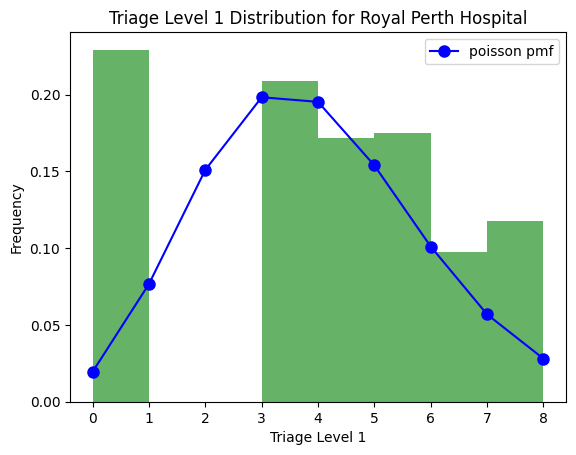

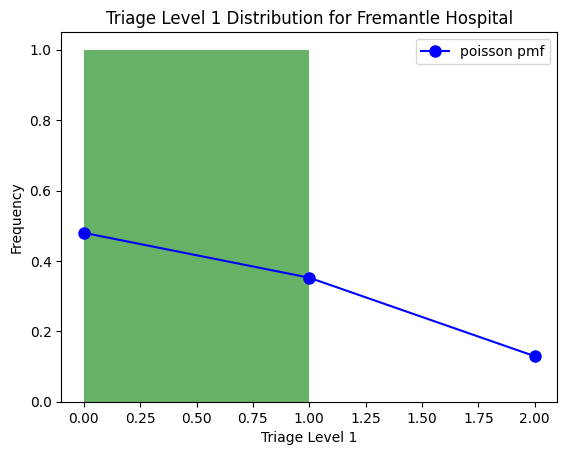

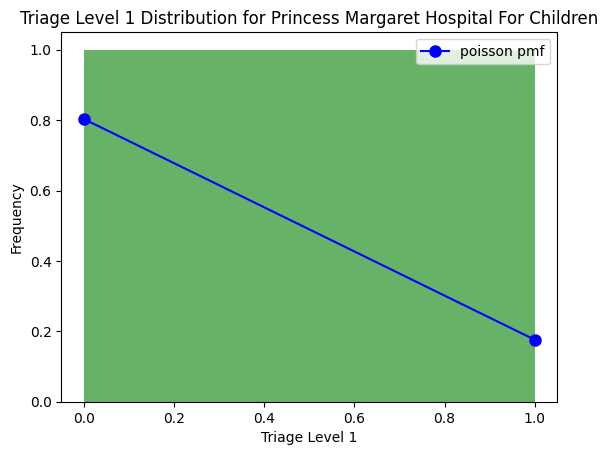

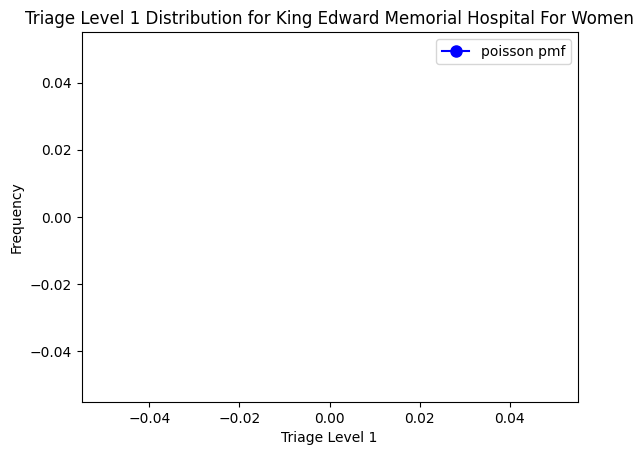

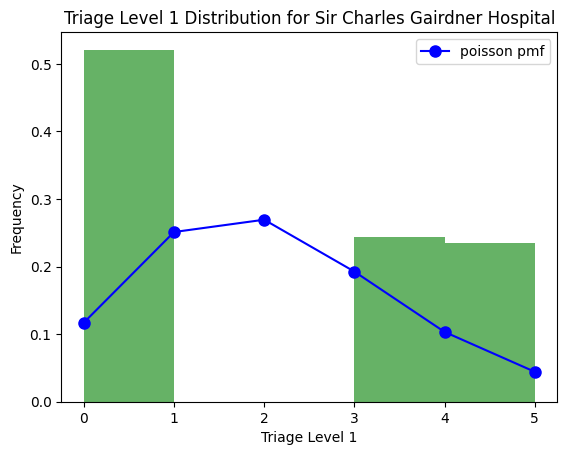

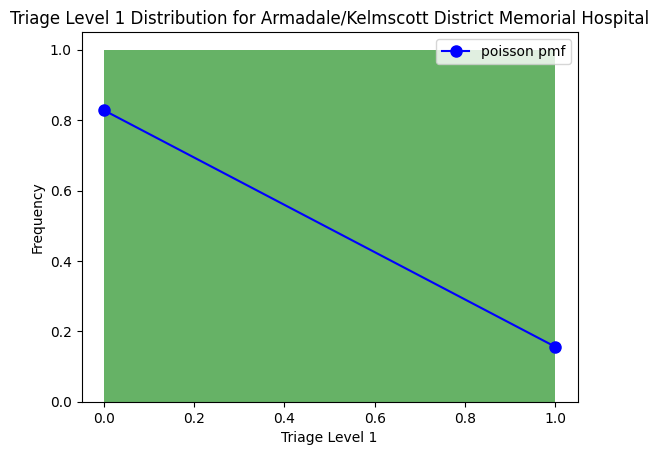

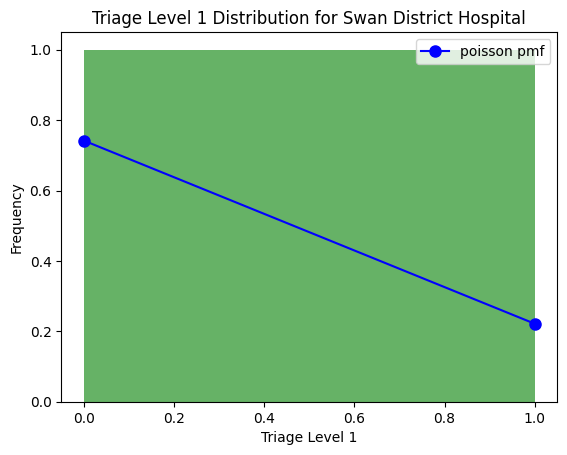

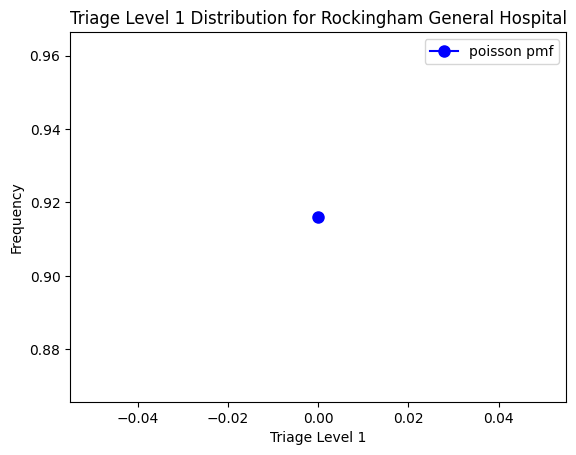

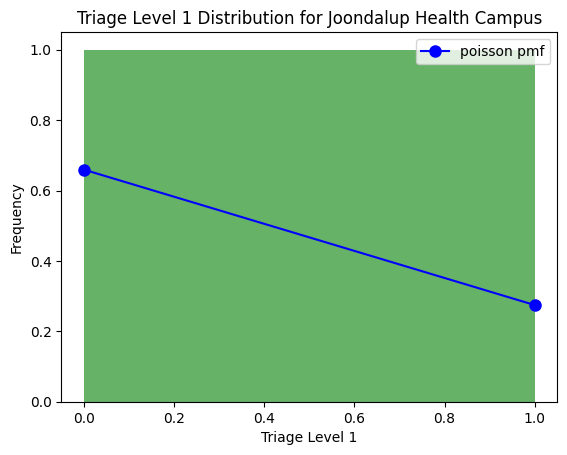

In [354]:
for hospital, df in dataframes.items():
    mu = df['Tri_1'].mean()
    poisson_estimate = poisson(mu)

    # Calculate poisson PMF for range of values
    x = np.arange(poisson.ppf(0.01, mu), poisson.ppf(0.99, mu))
    y = poisson_estimate.pmf(x)

    # Plot histogram of data
    plt.hist(df['Tri_1'], bins=x, density=True, alpha=0.6, color='g')

    # Plot estimated Poisson distribution
    plt.plot(x, y, 'bo-', ms=8, label='poisson pmf')

    # Title and labels
    plt.title(f'Triage Level 1 Distribution for {hospital}')
    plt.xlabel('Triage Level 1')
    plt.ylabel('Frequency')

    # Show legend and plot
    plt.legend()
    plt.show()

In [355]:
for hospital, df in dataframes.items():
    mu = df['Tri_2'].mean()
    poisson_estimate = poisson(mu)
    print(f"Poisson estimate for Triage 2 in {hospital}: mu = {mu}")

Poisson estimate for Triage 2 in Royal Perth Hospital: mu = 35.64657534246575
Poisson estimate for Triage 2 in Fremantle Hospital: mu = 27.747945205479454
Poisson estimate for Triage 2 in Princess Margaret Hospital For Children: mu = 8.046575342465754
Poisson estimate for Triage 2 in King Edward Memorial Hospital For Women: mu = 0.00821917808219178
Poisson estimate for Triage 2 in Sir Charles Gairdner Hospital: mu = 43.057534246575344
Poisson estimate for Triage 2 in Armadale/Kelmscott District Memorial Hospital: mu = 22.312328767123287
Poisson estimate for Triage 2 in Swan District Hospital: mu = 22.008219178082193
Poisson estimate for Triage 2 in Rockingham General Hospital: mu = 16.81095890410959
Poisson estimate for Triage 2 in Joondalup Health Campus: mu = 30.583561643835615


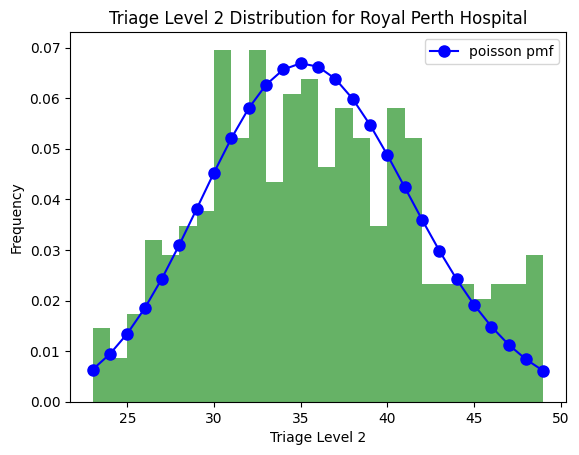

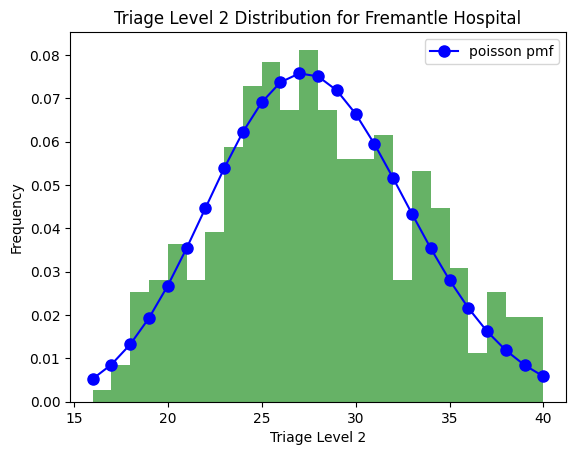

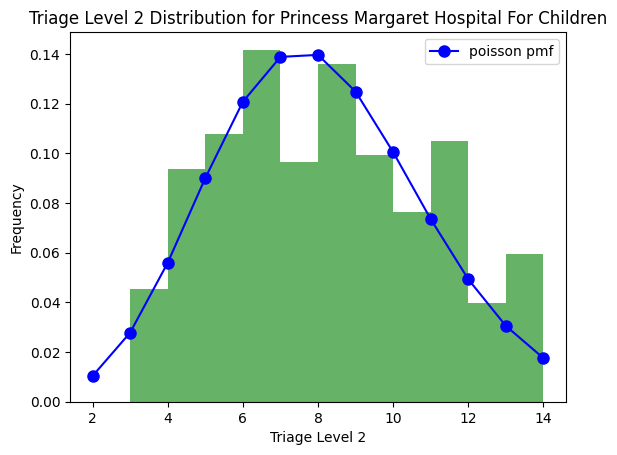

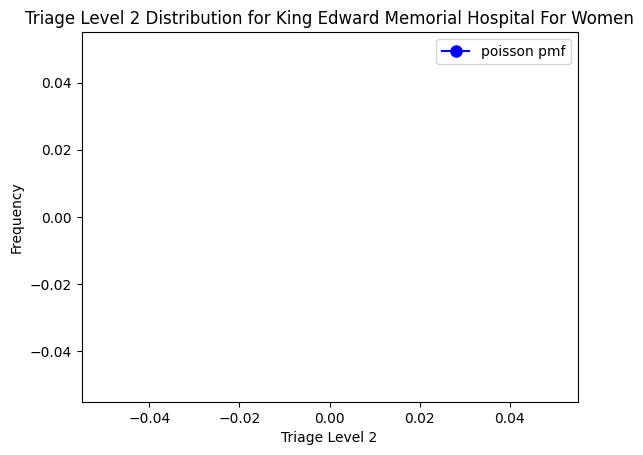

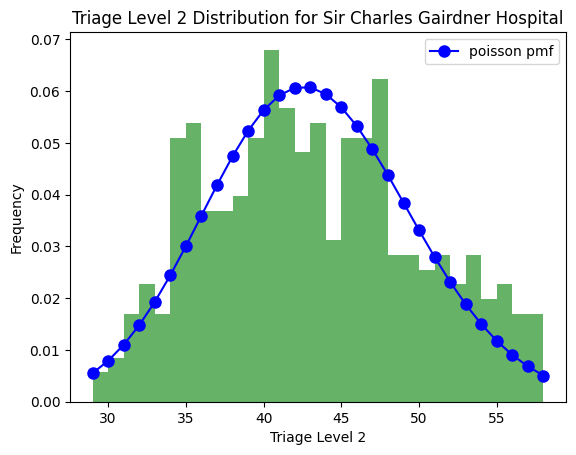

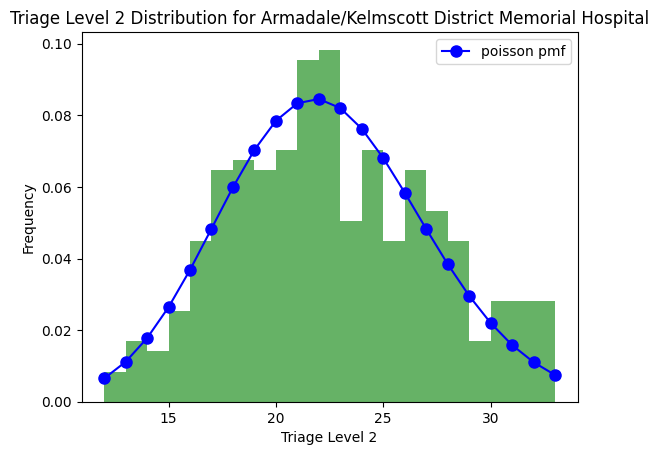

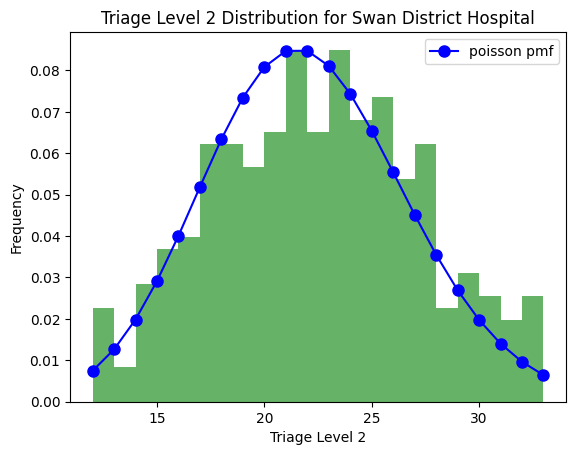

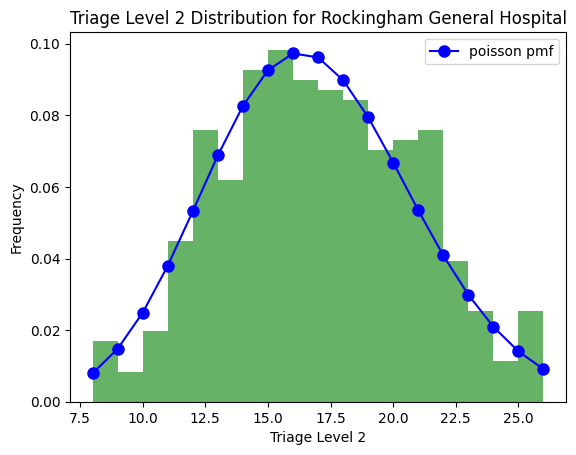

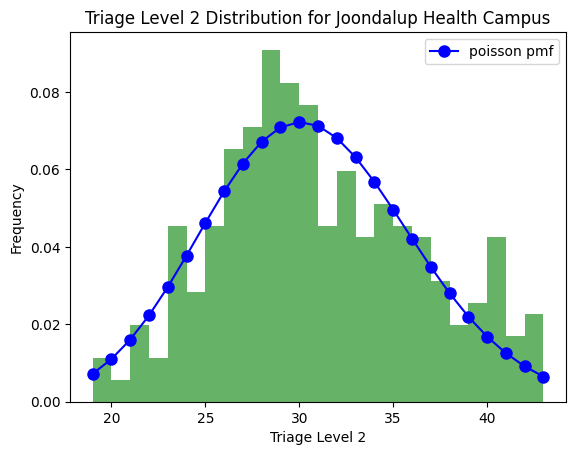

In [356]:
for hospital, df in dataframes.items():
    mu = df['Tri_2'].mean()
    poisson_estimate = poisson(mu)

    # Calculate poisson PMF for range of values
    x = np.arange(poisson.ppf(0.01, mu), poisson.ppf(0.99, mu))
    y = poisson_estimate.pmf(x)

    # Plot histogram of data
    plt.hist(df['Tri_2'], bins=x, density=True, alpha=0.6, color='g')

    # Plot estimated Poisson distribution
    plt.plot(x, y, 'bo-', ms=8, label='poisson pmf')

    # Title and labels
    plt.title(f'Triage Level 2 Distribution for {hospital}')
    plt.xlabel('Triage Level 2')
    plt.ylabel('Frequency')

    # Show legend and plot
    plt.legend()
    plt.show()

In [357]:
for hospital, df in dataframes.items():
    mu = df['Tri_3'].mean()
    poisson_estimate = poisson(mu)
    print(f"Poisson estimate for Triage 3 in {hospital}: mu = {mu}")

Poisson estimate for Triage 3 in Royal Perth Hospital: mu = 81.2
Poisson estimate for Triage 3 in Fremantle Hospital: mu = 57.657534246575345
Poisson estimate for Triage 3 in Princess Margaret Hospital For Children: mu = 49.26575342465753
Poisson estimate for Triage 3 in King Edward Memorial Hospital For Women: mu = 5.019178082191781
Poisson estimate for Triage 3 in Sir Charles Gairdner Hospital: mu = 84.04109589041096
Poisson estimate for Triage 3 in Armadale/Kelmscott District Memorial Hospital: mu = 64.32876712328768
Poisson estimate for Triage 3 in Swan District Hospital: mu = 49.73698630136986
Poisson estimate for Triage 3 in Rockingham General Hospital: mu = 49.70958904109589
Poisson estimate for Triage 3 in Joondalup Health Campus: mu = 90.83835616438355


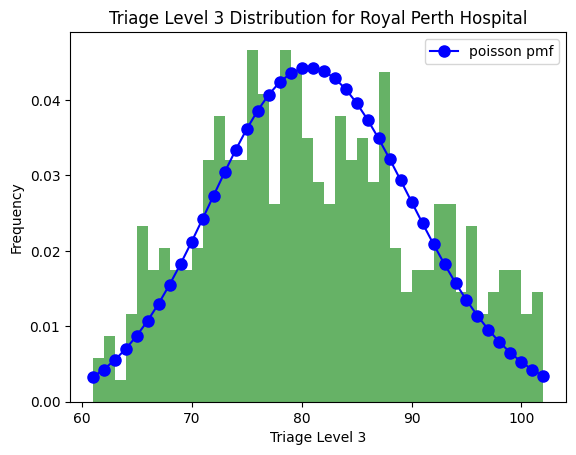

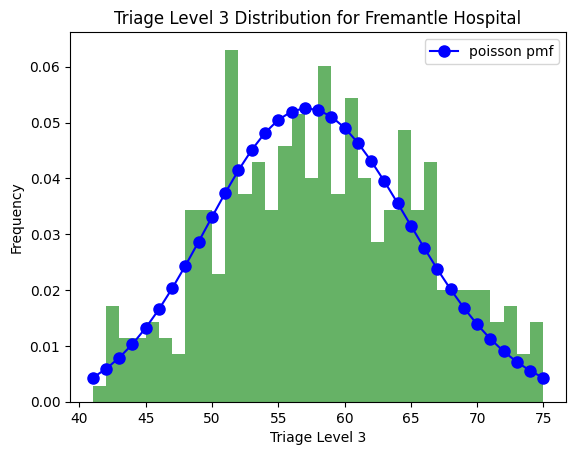

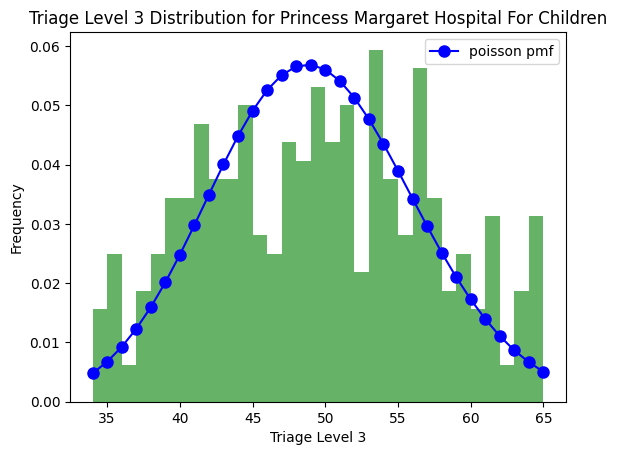

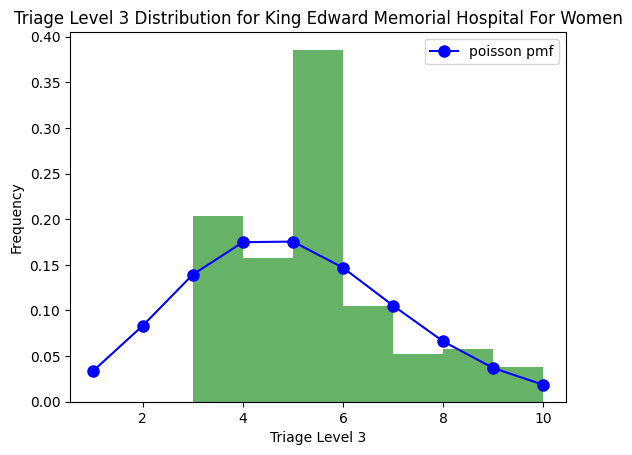

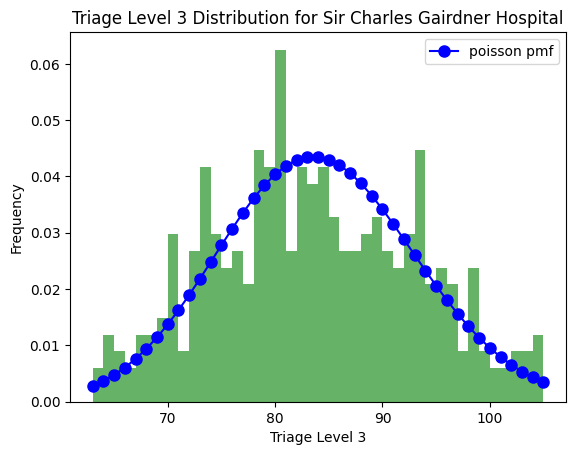

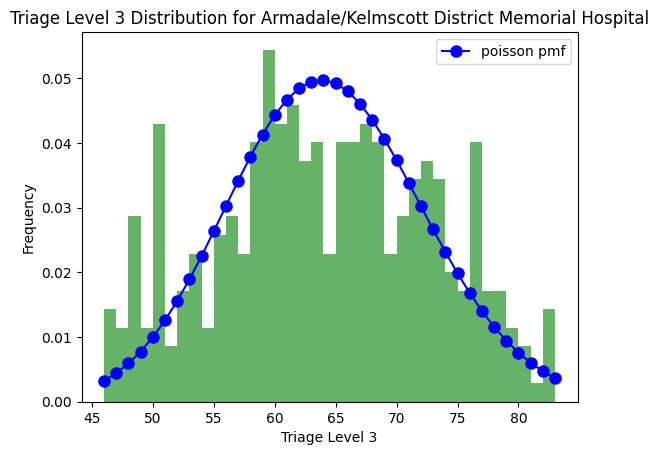

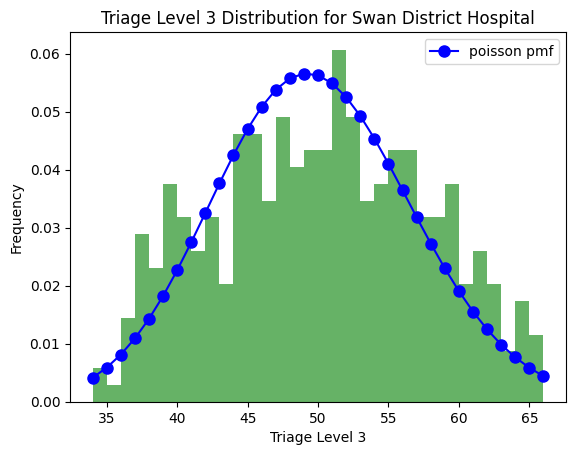

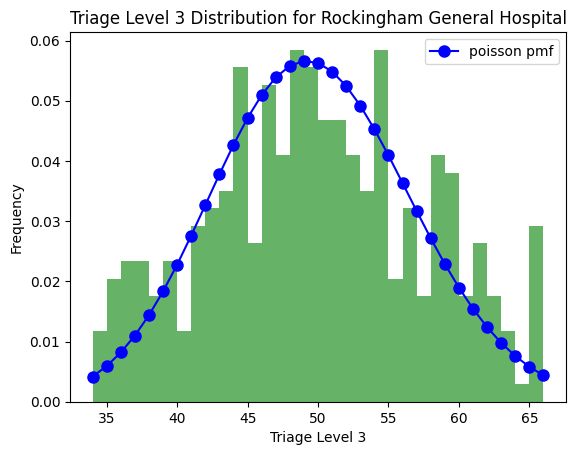

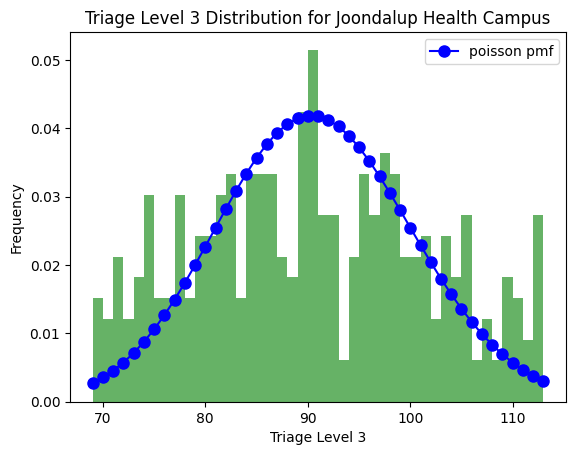

In [358]:
for hospital, df in dataframes.items():
    mu = df['Tri_3'].mean()
    poisson_estimate = poisson(mu)

    # Calculate poisson PMF for range of values
    x = np.arange(poisson.ppf(0.01, mu), poisson.ppf(0.99, mu))
    y = poisson_estimate.pmf(x)

    # Plot histogram of data
    plt.hist(df['Tri_3'], bins=x, density=True, alpha=0.6, color='g')

    # Plot estimated Poisson distribution
    plt.plot(x, y, 'bo-', ms=8, label='poisson pmf')

    # Title and labels
    plt.title(f'Triage Level 3 Distribution for {hospital}')
    plt.xlabel('Triage Level 3')
    plt.ylabel('Frequency')

    # Show legend and plot
    plt.legend()
    plt.show()

In [359]:
for hospital, df in dataframes.items():
    mu = df['Tri_4'].mean()
    poisson_estimate = poisson(mu)
    print(f"Poisson estimate for Triage 4 in {hospital}: mu = {mu}")

Poisson estimate for Triage 4 in Royal Perth Hospital: mu = 89.44657534246575
Poisson estimate for Triage 4 in Fremantle Hospital: mu = 56.487671232876714
Poisson estimate for Triage 4 in Princess Margaret Hospital For Children: mu = 133.9753424657534
Poisson estimate for Triage 4 in King Edward Memorial Hospital For Women: mu = 19.964383561643835
Poisson estimate for Triage 4 in Sir Charles Gairdner Hospital: mu = 46.367123287671234
Poisson estimate for Triage 4 in Armadale/Kelmscott District Memorial Hospital: mu = 69.8986301369863
Poisson estimate for Triage 4 in Swan District Hospital: mu = 49.345205479452055
Poisson estimate for Triage 4 in Rockingham General Hospital: mu = 71.42191780821918
Poisson estimate for Triage 4 in Joondalup Health Campus: mu = 126.93424657534247


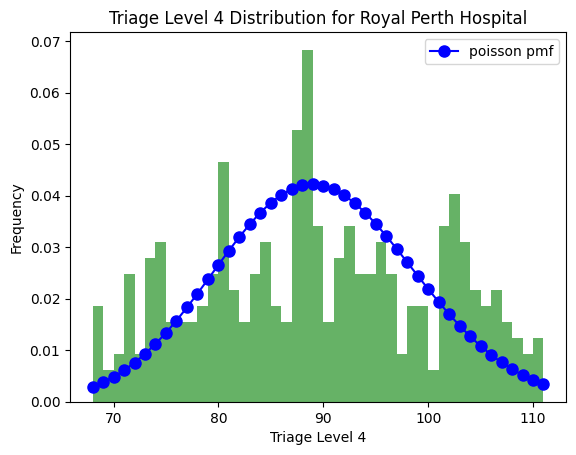

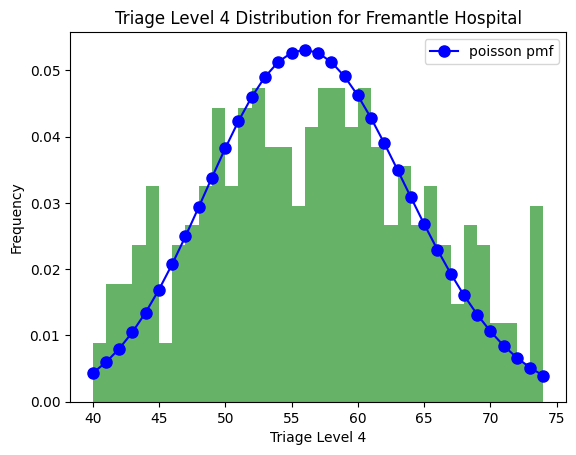

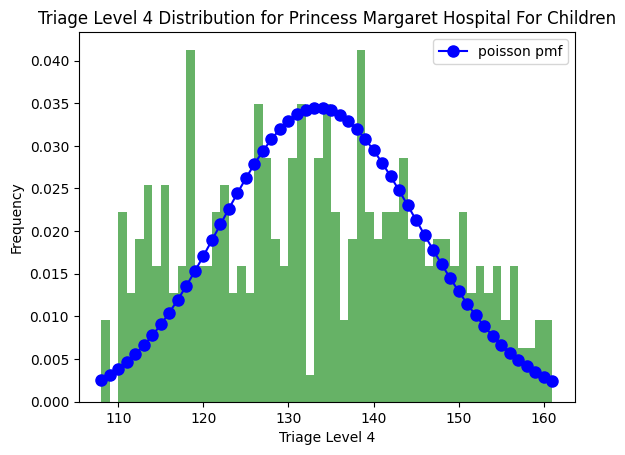

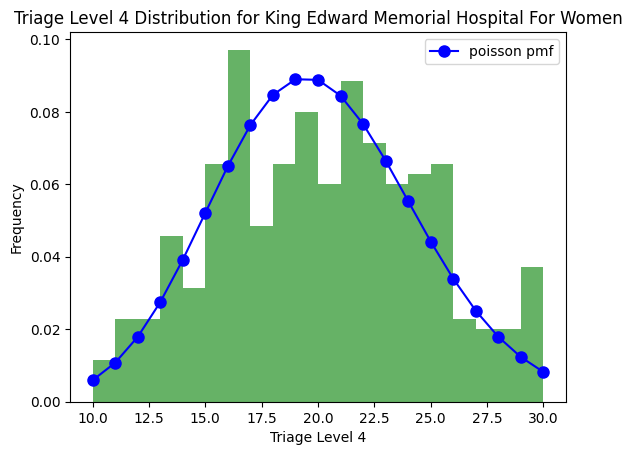

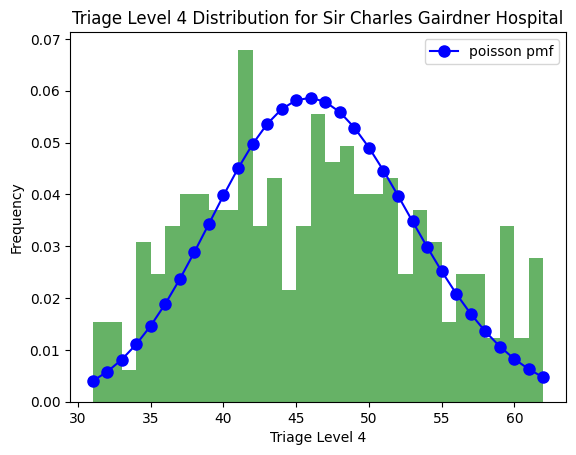

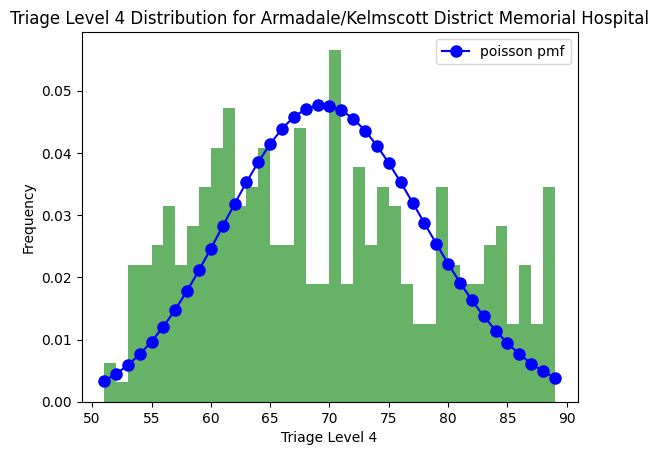

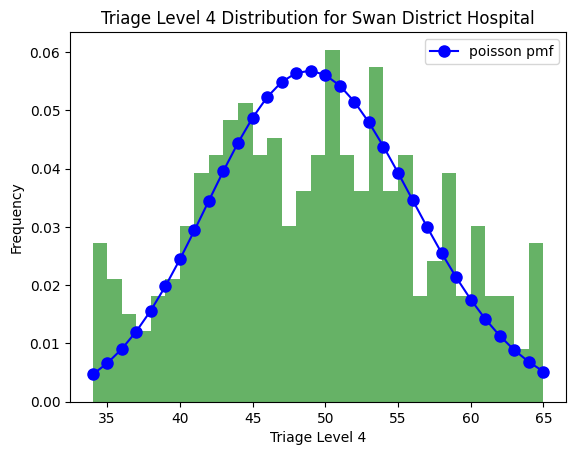

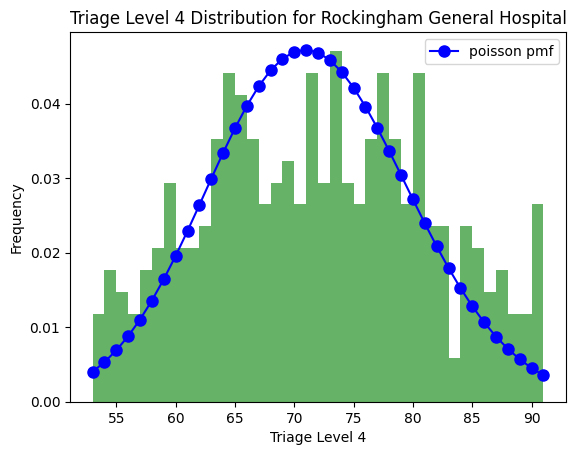

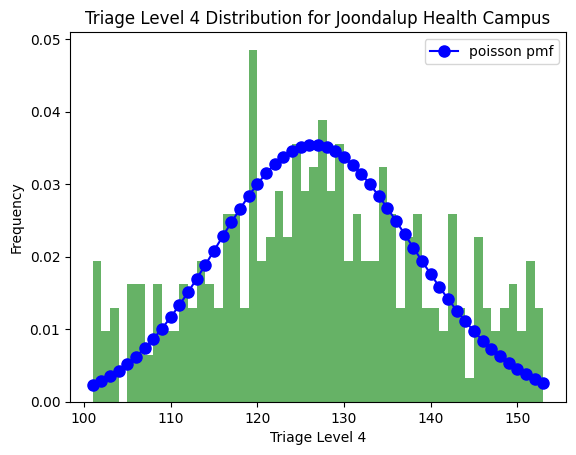

In [360]:
for hospital, df in dataframes.items():
    mu = df['Tri_4'].mean()
    poisson_estimate = poisson(mu)

    # Calculate poisson PMF for range of values
    x = np.arange(poisson.ppf(0.01, mu), poisson.ppf(0.99, mu))
    y = poisson_estimate.pmf(x)

    # Plot histogram of data
    plt.hist(df['Tri_4'], bins=x, density=True, alpha=0.6, color='g')

    # Plot estimated Poisson distribution
    plt.plot(x, y, 'bo-', ms=8, label='poisson pmf')

    # Title and labels
    plt.title(f'Triage Level 4 Distribution for {hospital}')
    plt.xlabel('Triage Level 4')
    plt.ylabel('Frequency')

    # Show legend and plot
    plt.legend()
    plt.show()

In [361]:
for hospital, df in dataframes.items():
    mu = df['Tri_5'].mean()
    poisson_estimate = poisson(mu)
    print(f"Poisson estimate for Triage 5 in {hospital}: mu = {mu}")

Poisson estimate for Triage 5 in Royal Perth Hospital: mu = 16.24931506849315
Poisson estimate for Triage 5 in Fremantle Hospital: mu = 15.38082191780822
Poisson estimate for Triage 5 in Princess Margaret Hospital For Children: mu = 4.090410958904109
Poisson estimate for Triage 5 in King Edward Memorial Hospital For Women: mu = 15.224657534246575
Poisson estimate for Triage 5 in Sir Charles Gairdner Hospital: mu = 5.323287671232877
Poisson estimate for Triage 5 in Armadale/Kelmscott District Memorial Hospital: mu = 11.471232876712328
Poisson estimate for Triage 5 in Swan District Hospital: mu = 8.150684931506849
Poisson estimate for Triage 5 in Rockingham General Hospital: mu = 6.997260273972603
Poisson estimate for Triage 5 in Joondalup Health Campus: mu = 8.027397260273972


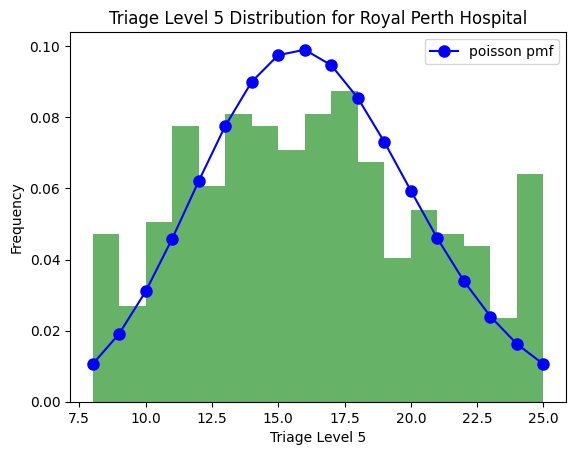

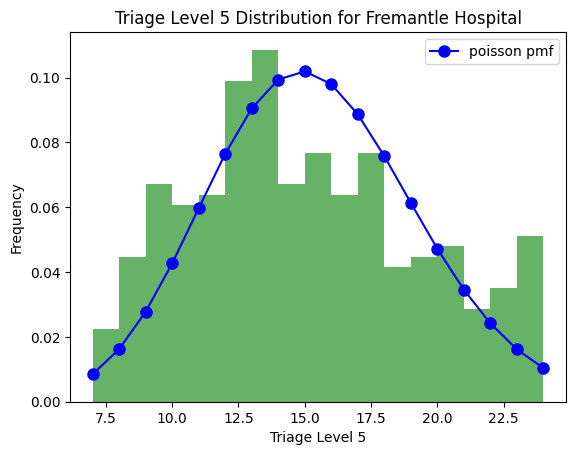

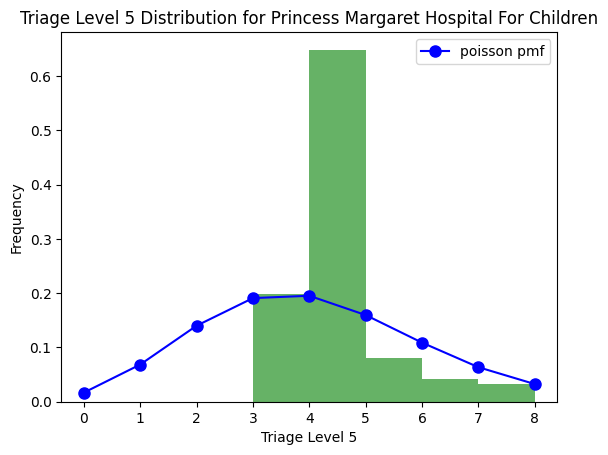

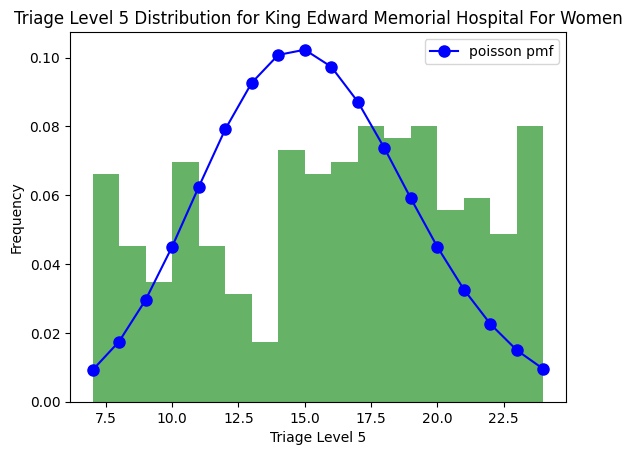

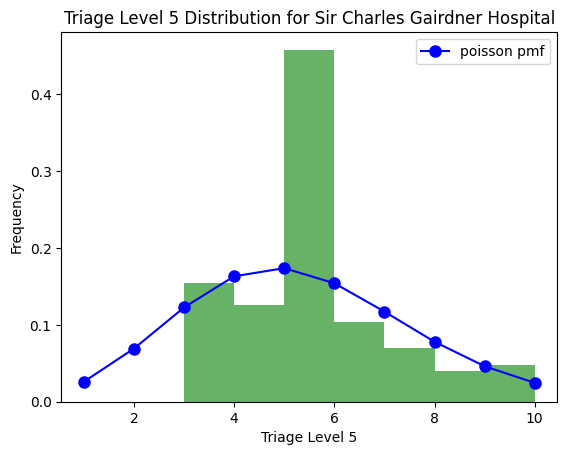

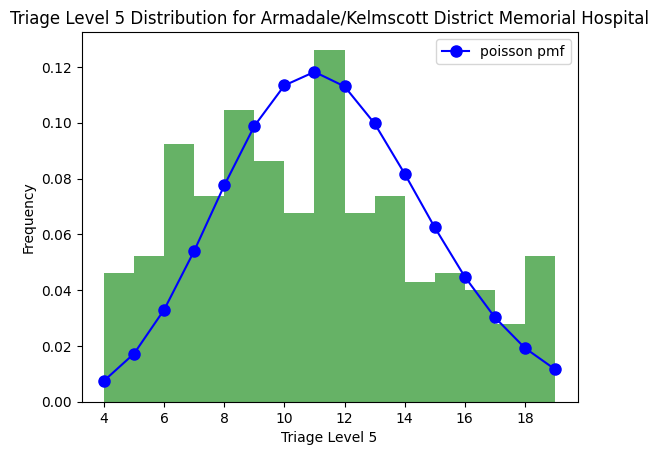

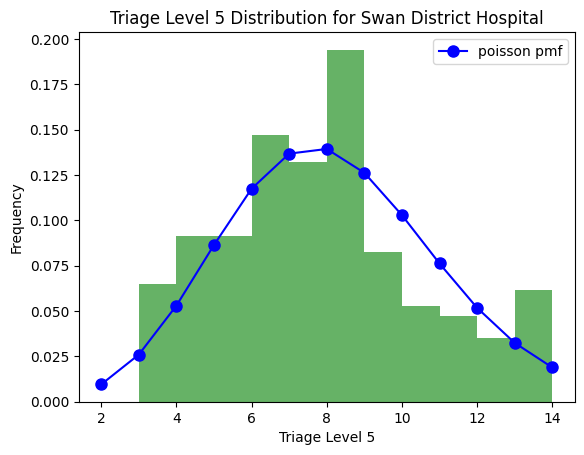

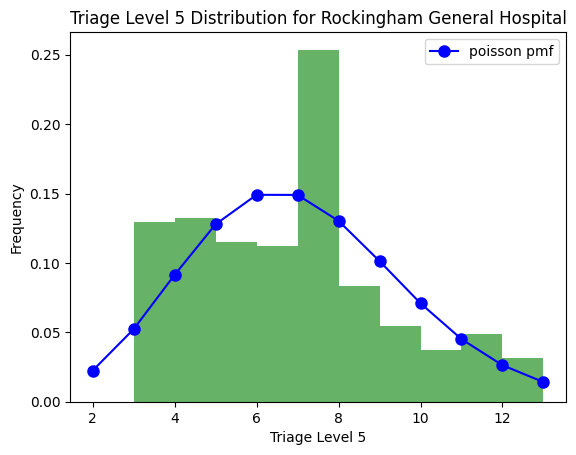

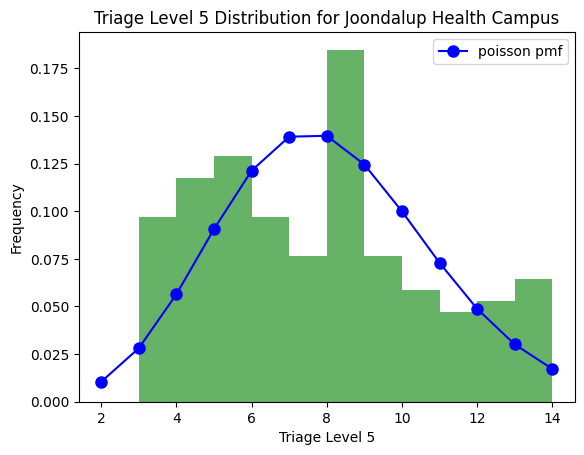

In [362]:
for hospital, df in dataframes.items():
    mu = df['Tri_5'].mean()
    poisson_estimate = poisson(mu)

    # Calculate poisson PMF for range of values
    x = np.arange(poisson.ppf(0.01, mu), poisson.ppf(0.99, mu))
    y = poisson_estimate.pmf(x)

    # Plot histogram of data
    plt.hist(df['Tri_5'], bins=x, density=True, alpha=0.6, color='g')

    # Plot estimated Poisson distribution
    plt.plot(x, y, 'bo-', ms=8, label='poisson pmf')

    # Title and labels
    plt.title(f'Triage Level 5 Distribution for {hospital}')
    plt.xlabel('Triage Level 5')
    plt.ylabel('Frequency')

    # Show legend and plot
    plt.legend()
    plt.show()

# Extreme Weather Events

In [363]:
Weather = pd.read_csv('/content/drive/MyDrive/Projects/3372792.csv')

In [364]:
Weather.head()

,STATION,NAME,DATE,PRCP,TAVG,TMAX,TMIN
0,ASN00009021,"PERTH AIRPORT, AS",1/07/2013,0.0,11.7,22.5,4.6
1,ASN00009021,"PERTH AIRPORT, AS",2/07/2013,0.0,13.9,21.6,2.2
2,ASN00009021,"PERTH AIRPORT, AS",3/07/2013,3.0,10.5,17.4,9.4
3,ASN00009021,"PERTH AIRPORT, AS",4/07/2013,1.0,9.5,17.3,3.9
4,ASN00009021,"PERTH AIRPORT, AS",5/07/2013,0.0,10.3,17.6,3.8


-Stations	PERTH AIRPORT, AS (GHCND:ASN00009021)
- Units	Metric
Data Types
-TMAX - Maximum temperature
- TAVG - Average Temperature.
- TMIN - Minimum temperature
- PRCP - Precipitation

In [365]:
Weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3642 entries, 0 to 3641
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   STATION  3642 non-null   object 
 1   NAME     3642 non-null   object 
 2   DATE     3642 non-null   object 
 3   PRCP     3642 non-null   float64
 4   TAVG     3639 non-null   float64
 5   TMAX     3641 non-null   float64
 6   TMIN     3641 non-null   float64
dtypes: float64(4), object(3)
memory usage: 199.3+ KB


In [366]:
# Change "Date" to Datetime object
Weather['DATE'] = pd.to_datetime(Weather['DATE'])

In [367]:
Weather.describe()

,PRCP,TAVG,TMAX,TMIN
count,3642.000000,3639.000000,3641.000000,3641.000000
mean,1.849808,18.662847,25.445290,12.595496
std,5.637952,5.265261,6.359935,4.882279
min,0.000000,7.400000,10.800000,-0.300000
25%,0.000000,14.500000,20.200000,9.000000
50%,0.000000,18.100000,24.500000,12.500000
75%,0.400000,22.600000,30.100000,16.100000
max,90.200000,35.100000,44.200000,28.500000


Following Nairn et al (2015), we propose a Extreme Heat Factor index. We propose a new index, called the excess heat factor (EHF) for use in Australian heatwave monitoring and forecasting. The index is based on a three-day-averaged daily mean temperature (DMT), and is intended to capture heatwave intensity as it applies to human health outcomes, although its usefulness is likely to be much broader and with potential for international applicability.

In [368]:
# Add 3-Day Averaged DMT
Weather['3D_Avg_DMT'] = Weather['TAVG'].shift(-1).rolling(window=3).mean()

In [380]:
# Track 95th Percentile of Averaged DMT
Perth_Weather_Percentile = Weather['TAVG'].quantile(0.95)

# Define Extreme Heat Factor
Weather['EHF'] = Weather['3D_Avg_DMT'] - 30

# Fill Missing Values
Weather['EHF'] = Weather['EHF'].fillna(0)

In [381]:
# Our Dataset goes to 2023. However, to remain consistent with our hospital data. We need to trim and only keep 2013-2014 data.
# Filter for dates between Jul-01-2013 and Jun-30-2014
filtered_Weather = Weather[(Weather['DATE'] >= '2013-07-01') & (Weather['DATE'] <= '2014-06-30')]

In [387]:
filtered_Weather.head()

,STATION,NAME,DATE,PRCP,TAVG,TMAX,TMIN,3D_Avg_DMT,EHF,T95
6,ASN00009021,"PERTH AIRPORT, AS",2013-07-07,0.0,9.3,16.7,3.7,9.733333,-20.266667,28.1
7,ASN00009021,"PERTH AIRPORT, AS",2013-08-07,0.0,10.3,18.5,2.5,10.800000,-19.200000,28.1
8,ASN00009021,"PERTH AIRPORT, AS",2013-09-07,0.0,12.8,19.6,3.4,11.766667,-18.233333,28.1
9,ASN00009021,"PERTH AIRPORT, AS",2013-10-07,25.4,12.2,19.5,8.5,12.566667,-17.433333,28.1
10,ASN00009021,"PERTH AIRPORT, AS",2013-11-07,0.0,12.7,15.0,7.0,12.266667,-17.733333,28.1


In [388]:
EHF = pd.DataFrame()

EHF['Average 30 Day'] = filtered_Weather['TAVG'].shift(1).rolling(window=30).mean()
EHF['Average 3 Day'] = filtered_Weather['TAVG'].shift(1).rolling(window=3).mean()
EHF['EHIsig'] = EHF['Average 3 Day'] - Perth_Weather_Percentile
EHF['EHIaccl'] = EHF['Average 3 Day'] - EHF['Average 30 Day']
EHF['EHF'] = EHF['EHIsig'] * np.maximum(1, EHF['EHIaccl'])


print(EHF.head())

    Average 30 Day  Average 3 Day     EHIsig  EHIaccl  EHF
6              NaN            NaN        NaN      NaN  NaN
7              NaN            NaN        NaN      NaN  NaN
8              NaN            NaN        NaN      NaN  NaN
9              NaN      10.800000 -17.300000      NaN  NaN
10             NaN      11.766667 -16.333333      NaN  NaN


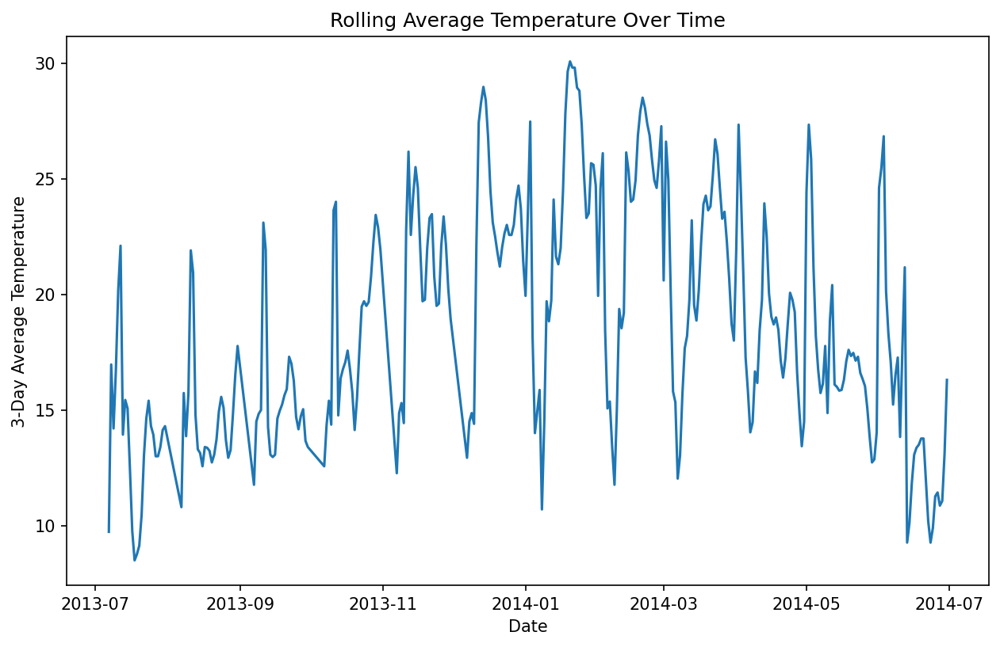

In [374]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='DATE', y='3D_Avg_DMT', data=filtered_Weather)
plt.xlabel('Date')
plt.ylabel('3-Day Average Temperature')
plt.title('Rolling Average Temperature Over Time')
plt.show()

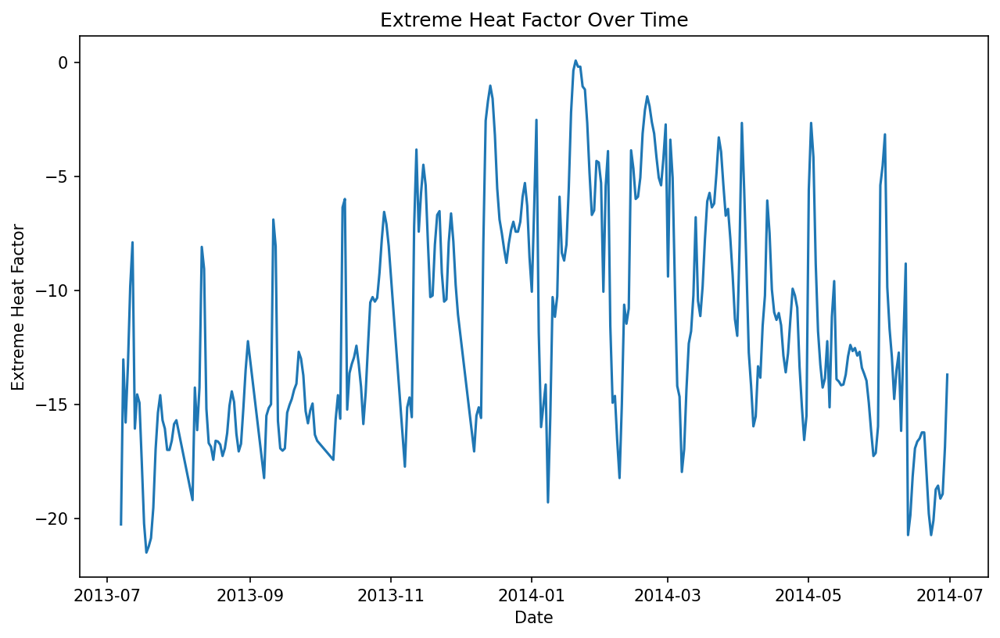

In [372]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='DATE', y='EHF', data=filtered_Weather)
plt.xlabel('Date')
plt.ylabel('Extreme Heat Factor')
plt.title('Extreme Heat Factor Over Time')
plt.show()

# Extreme Weather and Hospital Attendance

In [390]:
royal_perth_hospital_EHF = royal_perth_hospital
royal_perth_hospital_EHF['EHF'] = EHF['EHF']

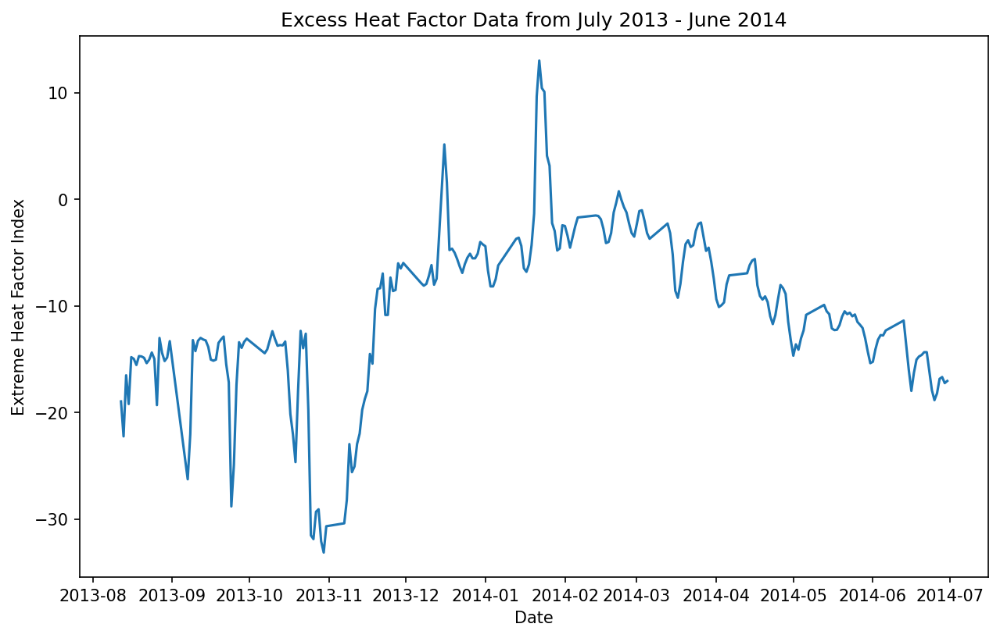

In [394]:
plt.figure(figsize=(10,6), dpi=150)
sns.lineplot(x='datetime', y='EHF', data=royal_perth_hospital_EHF)
plt.xlabel('Date')
plt.ylabel('Extreme Heat Factor Index')
plt.title("Excess Heat Factor Data from July 2013 - June 2014")
plt.show()

In [407]:
# Loop over all columns in the DataFrame
for col in royal_perth_hospital_EHF.columns:
    # If column data type is 'Int64', convert it to 'int64'
    if pd.api.types.is_integer_dtype(royal_perth_hospital_EHF[col]):
        # If there are missing values, fill with a placeholder before converting
        if royal_perth_hospital_EHF[col].isna().any():
            royal_perth_hospital_EHF[col] = royal_perth_hospital_EHF[col].fillna(0).astype('int64')  # Or use some other placeholder
        else:
            royal_perth_hospital_EHF[col] = royal_perth_hospital_EHF[col].astype('int64')

In [409]:
# Make sure your Date column is in datetime format
royal_perth_hospital_EHF['Date'] = pd.to_datetime(royal_perth_hospital_EHF['Date'])

# Create a new column 'DateInt' for integer representation of 'Date'
royal_perth_hospital_EHF['DateInt'] = royal_perth_hospital_EHF['Date'].apply(lambda x: x.toordinal()).astype('int')

ehf_model = smf.ols(formula='Attendance ~ DateInt + EHF', data=royal_perth_hospital_EHF)
ehf_model_fit = ehf_model.fit()

print(ehf_model_fit.summary())

                            OLS Regression Results                            
Dep. Variable:             Attendance   R-squared:                       0.051
Model:                            OLS   Adj. R-squared:                  0.044
Method:                 Least Squares   F-statistic:                     7.041
Date:                Sun, 25 Jun 2023   Prob (F-statistic):            0.00105
Time:                        02:06:42   Log-Likelihood:                -1113.4
No. Observations:                 263   AIC:                             2233.
Df Residuals:                     260   BIC:                             2244.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.101e+04   8424.499      1.307      0.1

In [416]:
# Generalised Additive Model
from pygam import LinearGAM, s
import numpy as np

# Convert 'numeric_date' to integers
royal_perth_hospital_EHF['Date'] = royal_perth_hospital_EHF['Date'].astype(np.int64)

X = royal_perth_hospital_EHF[['Date', 'EHF']]
y = royal_perth_hospital_EHF['Attendance']

# gam = LinearGAM(s(0) + s(1)).fit(X, y) # Currently has NaNs, Need some extra data from NOAA to avoid NAN

# For prediction:
# pred = gam.predict(X)

ValueError: ignored